<a href="https://colab.research.google.com/github/rubygitflow/Glossary-extraction/blob/main/University_of_Artificial_Intelligence_Glossary_extraction_Experiments_DS_2020_v_0_9_12_07.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Glossary extraction. The part-of-speech way. 
# Multiple Inputs: Lexemes, parts of speech, morphological features, alphabet.
**The research project**

На втором этапе по сегментации текста вернул в обучающую выборку фразы без определительных структур

https://www.pyimagesearch.com/2019/02/04/keras-multiple-inputs-and-mixed-data/ 

# **Service data**

In [1]:
!nvidia-smi

Mon Dec  7 20:31:45 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P0    30W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Ссылки на файлы данных:

База_словарей_train_6.docx : https://drive.google.com/file/d/13QKXApDf8q8R_BYviX1J80BCJXUOlZUw/view?usp=sharing

База_словарей_test_6.docx : https://drive.google.com/file/d/19a1rOu6NuAb-Y_HrHhN7Ssg_ZvxTXHhH/view?usp=sharing

База_словарей_train_6.xml : https://drive.google.com/file/d/16lNQFww1QyYRxr8S4OsA2THypqxLQOra/view?usp=sharing

База_словарей_test_6.xml : https://drive.google.com/file/d/1-9fG7sdiZnjkarvitPYgX9PFt95eErPi/view?usp=sharing


In [2]:
color_meaning = {'00ffff':'термин', 'ffff00':'связка', '00ff00':'определение', 'd3d3d3':'расшифровка', 
                 'ff00ff':'дубль-термин', 'ff0000':'дубль-связка', '808000':'дубль-определение', '0000ff':'дубль-расшифровка',
                 'cyan':'термин','yellow':'связка','green':'определение', 'lightgray':'расшифровка',	                 
                 'magenta':'дубль-термин', 'red':'дубль-связка','darkyellow':'дубль-определение', 'blue':'дубль-расшифровка'}

                 #создаем словарь соответствий цвет-значение   

In [3]:
color_dic = {'термин':0,'связка':1,'определение':2,'расшифровка':3,
			       'дубль-термин':4,'дубль-связка':5,'дубль-определение':6,'дубль-расшифровка':7}
dic_color = {value:key for key, value in color_dic.items()}

zero_symbol = 'o'

colors_count = len(color_dic) + 1 # количество уникальных тегов (не забываем про тег отсутствия класса для разметки)

skip_amount = colors_count  # кол-во пропускаемых строк под легенду при считывании данных (здесь учитывается, что есть пусая строка, в списке тегов последнее значение используется под отсутствующий класс для разметки)

In [4]:
colors_count

9

In [5]:
# названия необходимых тегов для извлекаемых категорий
r = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}r'
rpr = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}rPr'
t = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}t'
shd = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}shd'
fill = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}fill'
highlight = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}highlight'
val = '{http://schemas.openxmlformats.org/wordprocessingml/2006/main}val'

In [6]:
''' 
  Словарь для цветовой разметки разобранного текста
'''
class color:
  GREY    = '\33[90m'
  RED2    = '\33[91m'
  GREEN2  = '\33[92m'
  YELLOW2 = '\33[93m'
  BLUE2   = '\33[94m'
  VIOLET2 = '\33[95m'
  LI_CYAN = '\33[96m'
  WHITE2  = '\33[97m'

  BLACK  = '\33[30m'
  RED    = '\33[31m'
  GREEN  = '\33[32m'
  YELLOW = '\33[33m'
  BLUE   = '\33[34m'
  VIOLET = '\33[35m'
  CYAN   = '\33[36m'
  WHITE  = '\33[37m'

  GREYBG    = '\33[100m'
  REDBG2    = '\33[101m'
  GREENBG2  = '\33[102m'
  YELLOWBG2 = '\33[103m'
  BLUEBG2   = '\33[104m'
  VIOLETBG2 = '\33[105m'
  LI_CYANBG = '\33[106m'
  WHITEBG2  = '\33[107m'

  BLACKBG  = '\33[40m'
  REDBG    = '\33[41m'
  GREENBG  = '\33[42m'
  YELLOWBG = '\33[43m'
  BLUEBG   = '\33[44m'
  VIOLETBG = '\33[45m'
  CYANBG   = '\33[46m'
  WHITEBG  = '\33[47m'


  BOLD 		  = '\33[1m'
  ITALIC 	  = '\33[3m'
  UNDERLINE = '\33[4m'

  BLINK    = '\33[5m'
  BLINK2   = '\33[6m'
  SELECTED = '\33[7m'
  END 		 = '\33[0m'
  
dic_colored_items = {0:color.LI_CYANBG+color.BLACK, 1:color.YELLOWBG2+color.BLACK, 2:color.GREENBG2+color.BLACK, 3:color.WHITEBG+color.BLACK,
			               4:color.VIOLETBG2+color.WHITE2, 5:color.REDBG2+color.WHITE2, 6:color.YELLOWBG+color.BLACK, 7:color.BLUEBG+color.WHITE2}

## Connecting libraries

In [7]:
!pip install pymorphy2

     |████████████████████████████████| 61kB 3.4MB/s 
     |████████████████████████████████| 8.2MB 7.1MB/s 


In [8]:
!pip install polyglot
# https://github.com/aboSamoor/polyglot/issues/152
!pip install PyICU
!pip install pycld2
!pip install morfessor

     |████████████████████████████████| 133kB 4.3MB/s 
  Created wheel for polyglot: filename=polyglot-16.7.4-py2.py3-none-any.whl size=52559 sha256=af926e8027f374a062c59e5d6a75baa1e079442deb94cffe7f77ba4abb71c8ac
  Stored in directory: /root/.cache/pip/wheels/5e/91/ef/f1369fdc1203b0a9347d4b24f149b83a305f39ab047986d9da
Successfully built polyglot
     |████████████████████████████████| 235kB 6.1MB/s 
  Created wheel for PyICU: filename=PyICU-2.6-cp36-cp36m-linux_x86_64.whl size=1288207 sha256=58e220f05b86d25084b51b78bab7512ea0df485efa33e69755575b7503cb8e64
  Stored in directory: /root/.cache/pip/wheels/31/21/2f/1c91831e8a93537ab21f6b4b935781b681104635fdb0315791
Successfully built PyICU
     |████████████████████████████████| 41.4MB 76kB/s 
  Created wheel for pycld2: filename=pycld2-0.41-cp36-cp36m-linux_x86_64.whl size=9833468 sha256=e99557b2412045785aa13018451d87ceff80d77570180cb89ba16afe4f82d717
  Stored in directory: /root/.cache/pip/wheels/c6/8f/e9/08a1a8932a490175bd140206cd86a3db

In [9]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model # Импортируем модели keras
from tensorflow.keras.layers import Input, Dense, Embedding, Flatten, concatenate, Activation, MaxPooling1D, Conv1D, concatenate  # Импортируем стандартные слои keras
from tensorflow.keras.layers import Dropout, BatchNormalization, Conv2DTranspose, Lambda, LSTM, GRU, Bidirectional, GlobalMaxPool1D # Импортируем стандартные слои keras
from tensorflow.keras.layers import SpatialDropout1D 
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras import backend as K # Импортируем модуль backend keras'а
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras import utils # Импортируем модуль utils библиотеки tensorflow.keras для получения OHE-представления
from tensorflow.keras.metrics import AUC

from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt 
import collections
%matplotlib inline
import numpy as np 
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report # статистика точности предсказания по классам
import random
import datetime
import time

import xml.etree.ElementTree as ET

import re # https://habr.com/ru/post/349860/
import pymorphy2 # https://pymorphy2.readthedocs.io/en/latest/user/guide.html
import polyglot # https://polyglot.readthedocs.io/en/latest/
from polyglot.detect import Detector # https://polyglot.readthedocs.io/en/latest/Detection.html
from textblob import TextBlob # https://textblob.readthedocs.io/en/latest/quickstart.html
# import nltk
# from nltk import pos_tag # https://stackoverflow.com/questions/15388831/what-are-all-possible-pos-tags-of-nltk

import os # Импортируем библиотеку для работы с файловой системой
from google.colab import files # Импортируем Модуль для работы с файлами
from google.colab import drive # Подключаем гугл-диск

from sklearn.metrics import roc_curve, roc_auc_score

In [10]:
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [11]:
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
morph = pymorphy2.MorphAnalyzer()

## Library of local Functions

In [13]:
'''
  Сервиcная функция:
  Лемматизация для английского языка
  Функция предполагает разбор именно слов (без пробелов внутри текста - Это важно), 
  но лучшим оказался алгоритм лемматизации предложений
'''
# https://webdevblog.ru/podhody-lemmatizacii-s-primerami-v-python/
def textblob_lemmatize(blob):
  sent = TextBlob(blob)
  tag_dict = {"J": 'a', 
              "N": 'n', 
              "V": 'v', 
              "R": 'r'}
  words_and_tags = [(w, tag_dict.get(pos[0], 'n')) for w, pos in sent.tags]    
  lemmatized_list = [wd.lemmatize(tag) for wd, tag in words_and_tags]
  res = "".join(lemmatized_list)
  return res if res!='' else blob

In [14]:
'''
  Сервиcная функция:
  Извлечение тега для лексемы на английском
  https://www.geeksforgeeks.org/python-part-of-speech-tagging-using-textblob/
  CC coordinating conjunction
  CD cardinal digit
  DT determiner
  EX existential there (like: “there is” … think of it like “there exists”)
  FW foreign word
  IN preposition/subordinating conjunction
  JJ adjective ‘big’
  JJR adjective, comparative ‘bigger’
  JJS adjective, superlative ‘biggest’
  LS list marker 1)
  MD modal could, will
  NN noun, singular ‘desk’
  NNS noun plural ‘desks’
  NNP proper noun, singular ‘Harrison’
  NNPS proper noun, plural ‘Americans’
  PDT predeterminer ‘all the kids’
  POS possessive ending parent‘s
  PRP personal pronoun I, he, she
  PRP$ possessive pronoun my, his, hers
  RB adverb very, silently,
  RBR adverb, comparative better
  RBS adverb, superlative best
  RP particle give up
  TO to go ‘to‘ the store.
  UH interjection errrrrrrrm
  VB verb, base form take
  VBD verb, past tense took
  VBG verb, gerund/present participle taking
  VBN verb, past participle taken
  VBP verb, sing. present, non-3d take
  VBZ verb, 3rd person sing. present takes
  WDT wh-determiner which
  WP wh-pronoun who, what
  WP$ possessive wh-pronoun whose
  WRB wh-abverb where, when

  https://pymorphy2.readthedocs.io/en/latest/user/grammemes.html#russian-numbers
  Граммема	Значение	          Примеры
  sing	    единственное число	хомяк, говорит
  plur	    множественное число	хомяки, говорят
'''
def textblob_tags(blob):
  # print('textblob_tags:',blob, TextBlob(blob).tags)
  try:
    pos = TextBlob(blob).tags[0][1]
    if pos in ['NN', 'NNP']:
      numbers = 'sing'
    elif pos in ['NNS', 'NNPS']:
      numbers = 'plur'
    else:
      numbers = 'None'
  except:
    pos = 'NN'
    numbers = 'sing'

  return pos, numbers

In [15]:
'''
  Сервиcная функция:
  Назначение граммемы
  https://pymorphy2.readthedocs.io/en/latest/user/grammemes.html
'''
def define_morphy( 
  pos = 'None', animacy = 'None', aspect = 'None',
  case = 'None', gender = 'None', involvement = 'None',
  mood = 'None', number = 'None', person = 'None',
  tense = 'None', transitivity = 'None', voice = 'None'
): 
  return [str(pos), str(animacy), str(aspect), str(case), str(gender), str(involvement), 
          str(mood), str(number), str(person), str(tense), str(transitivity), str(voice)]



In [16]:
'''
  Сервиcная функция:
  Извлечение морфологических признаков лексемы 
'''
def morphyus(blob):
  # 1. язык: долюно быть - sign, en, ru, el. Другие пока не расматриваются
  # 2. С заглавной ли буквы написание слова
  # итерации по
    # 3. слово в нормальной форме
    # 4. часть речи
    # 5. всё остальное

  draw_in = lambda a: ''.join(a.split())

  
  morphy = []  
  tags = morph.parse(blob)
  # print('tags',tags)
  try:
    detector = Detector(blob)
    language = detector.language.code
    # print('language',language)
  except:
    lng_lst = str(tags[0].tag).split(',')
    # print('lng_lst',lng_lst)
    if lng_lst[0]=='UNKN':
      morphy.append('sign')
      morphy.append('true' if blob[0].isupper() else 'false')
      morphy.append(textblob_lemmatize(blob).lower())
      pos, number = textblob_tags(blob)
      morphy += define_morphy(pos = pos, number = number)         
      return morphy
    elif lng_lst[0]=='LATN':
      morphy.append('en')
      morphy.append('true' if blob[0].isupper() else 'false')
      morphy.append(textblob_lemmatize(blob).lower())
      pos, number = textblob_tags(blob)
      morphy += define_morphy(pos = pos, number = number)  
      return morphy
    elif lng_lst[0]=='NUMB':
      morphy.append('sign')
      morphy.append('false')
      morphy.append(draw_in(tags[0].normal_form)) # allways .lower()
      morphy += define_morphy(pos = 'NUMB', number = lng_lst[1])  
      return morphy
    elif lng_lst[0]=='ROMN':
      morphy.append('en')
      morphy.append('true' if blob[0].isupper() else 'false')
      morphy.append(textblob_lemmatize(blob).lower())
      pos, number = textblob_tags(blob)
      morphy += define_morphy(pos = pos, number = number)  
      # print 'ROMN' morfology
      morphy.append(draw_in(tags[0].normal_form)) # allways .lower()
      morphy += define_morphy(pos = 'ROMN')
      return morphy
    elif lng_lst[0]=='PNCT':
      morphy.append('sign')
      morphy.append('false')
      morphy.append(draw_in(tags[0].normal_form)) # allways .lower()
      morphy += define_morphy(pos = 'PNCT')  
      return morphy
    elif lng_lst[0] in ['NOUN','ADJF','ADJS','COMP','VERB','INFN','PRTF','PRTS','GRND','NUMR','ADVB','NPRO','PRED','PREP','CONJ','PRCL','INTJ']:
      language = 'ru'
    else:
      language = lng_lst[0]

  # print('language:',language, '; blob:', blob)
  if language in ['bg', 'uk', 'mn', 'ab', 'ba', 'be', 'ky', 'mk', 'ro', 'ru', 'sr', 'tk', 'tt', 'ug', 'uz', 'ug']: 
  # на самом деле плохое условие. Надо менять алгоритм работы с детектором языка - detector.language
    language = 'ru'
    morphy.append('ru')
    morphy.append('true' if blob[0].isupper() else 'false')
    for elem in tags:
      morphy.append(elem.normal_form) # allways .lower()
      morphy += define_morphy(pos = elem.tag.POS,
                              animacy = elem.tag.animacy, 
                              aspect = elem.tag.aspect,
                              case = elem.tag.case, 
                              gender = elem.tag.gender, 
                              involvement = elem.tag.involvement,
                              mood = elem.tag.mood, 
                              number = elem.tag.number,
                              person = elem.tag.person,
                              tense = elem.tag.tense,
                              transitivity = elem.tag.transitivity,
                              voice = elem.tag.voice)
  else:
    # en - ak da de gl hu la mt nl sco sl sm 
    if language != 'el':
      language = 'en'
    morphy.append(language)
    morphy.append('true' if blob[0].isupper() else 'false')
    morphy.append(textblob_lemmatize(blob).lower())
    pos, number = textblob_tags(blob)
    morphy += define_morphy(pos = pos, number = number)  
    if str(tags[0].tag)=='ROMN':
      morphy.append(tags[0].normal_form)
      morphy += define_morphy(pos = 'ROMN')

  return morphy

In [17]:
'''
  Сервиcная функция:
  Загрузка выборки заданного количества фраз из файла 
'''
def load_xml(filename, paragraphs_amount):
    test_tree = ET.parse(filename)

    test_root = test_tree.getroot()
    test_body = test_root[0]
    test_row_count = paragraphs_amount + skip_amount
    return list(iter(test_body))[:test_row_count]

In [18]:
'''
  Сервиcная функция:
  Вставка пробела в заданной позиции в строке
'''
def insert_space(text, index):
  return text[:index] + ' ' + text[index:]

In [19]:
'''
  Основная функция для подготовки обучающей выборки.
  Создаём параллельные массивы с текстом — paragraphs,
  категориями лексем — tags
  и классификацией предложений — semantics
'''
def pars_xml(ps):
    # Массивы данных по параграфам
    paragraphs = []
    tags = []
    semantics = []
    exception_amount = 0
    exception_array = []
    # Массив фактических цветов в файле исходных данных
    colors = set() # все цвета в документе
    # длина массива лексем в параграфе
    max_paragraph_len = 0  # Максимальная длина предложения
    max_paragraph_len_ind = -1  # Индекс предложения с максимальной длиной

    for i, paragraph in enumerate(ps): # проходим по всем абзацам
        z_item = [0] # массив семантических индикаторов -  наличие определительной струткуры первого и второго уровня
        if i > colors_count - 1:     # пропускаем легенду для цветовой разметки    
            phrases_list = paragraph.findall(r) # находим все фразы (часть новости)
            p_words = [] # список сущностей в абзаце
            tags_w = [] # список семантических цветов для слов в абзаце

            last_ind = len(phrases_list)-1
            for ind, phrase in enumerate(phrases_list): # проходим по всем фразам в абзаце
                words = [] # список сущностей во фразе
                y_list = [] # категории для сущностей во фразе

                try:
                  text = phrase.find(t).text # получаем текст, содержащийся во фразе

                  # 1) выделяем пробелом точку (воскл.зн., вопр.зн., двоеточние) в конце предложения
                  text_comma = text.strip()
                  len_text = len(text_comma)-1
                  if ind==last_ind and len_text>0: 
                    if text_comma[len_text] in ['.', ':', '!', '?']:
                      text_comma = insert_space(text_comma, len_text)
                    
                  # 2) выделяем пробелами символы: , { } ( ) [ ] ; « » „ “ "
                  text_comma = text_comma.replace(',', ' , ')
                  text_comma = text_comma.replace('(', ' ( ')
                  text_comma = text_comma.replace(')', ' ) ')
                  text_comma = text_comma.replace('[', ' [ ')
                  text_comma = text_comma.replace(']', ' ] ')
                  text_comma = text_comma.replace('{', ' { ')
                  text_comma = text_comma.replace('}', ' } ')
                  text_comma = text_comma.replace('"', ' " ')
                  text_comma = text_comma.replace('„', ' „ ')
                  text_comma = text_comma.replace('“', ' “ ')
                  text_comma = text_comma.replace('«', ' « ')
                  text_comma = text_comma.replace('»', ' » ')
                  text_comma = text_comma.replace(';', ' ; ')
                  text_comma = text_comma.replace('%', ' %') # вставляем пробел именно слева, но не справа
            
                  # 3) заменяем все виды пробелов одиночным пробелом #32  
                  text_comma = text_comma.replace('\xa0', '')
                  text_comma = text_comma.replace('\x301', '')
                  text_comma = text_comma.replace('\u0301', '')
                  text_comma = text_comma.replace('\ufeff', '')
                  text_comma = text_comma.replace('  ', ' ')
                  text_comma = text_comma.replace('  ', ' ')
                  text_comma = text_comma.strip()      

                  # 4) выделяем левым пробелом двоеточие (:) при одновременном выполнении условий: 
                  # после двух буквенных символов в любом алфавите и перед правым пробелом. 
                  # https://habr.com/ru/post/349860/
                  text_comma = re.sub(r'(\w\w)(:)(\s)',  r'\1 \2\3', text_comma)
                  text_comma = re.sub(r'(\w\w)(:)$',  r'\1 \2', text_comma)


                  if (len(text_comma)>0):
                    style = phrase.find(rpr) # получаем стили фразы
                    
                    if style.find(shd) is not None: # если размечали через заливку
                        color = style.find(shd).attrib[fill] # получаем значение цвета заливки
                    elif style.find(highlight) is not None: # если размечали через хайлайт
                        color = style.find(highlight).attrib[val] # получаем значение цвета хайлайта
                    else:
                        color = 'white' # иных вариантов выделения в word нет, значит эта фраза не выделена (белый цвет)
                    color = color.lower() # переводим строковое значение цвета в нижний регистр
                    meaning = color_meaning[color] if color in color_meaning else '' # если есть цвет в словаре цвет-значение, то получаем значение. в противном случае у фразы значение не было выделено
                    
                    colors.add(color) # добавляем цвет в словарь всех встреченных цветов, если нужно проанализировать их
                    
                    words = text_comma.split()
                    k = len(words)
                    if meaning in color_dic: # если во фразе присутствует какая-то выделяемая сущность
                      z_item = [1] # отмечаем фразу с понятийной структурой
                      for j in range(k):
                        y_list.append(meaning) # получаем индекс позиции, соответствующей какой-то семантической(смысловой) окраске и устанавливаем по этому индексу абсолютное значение категории
                    else:
                      for j in range(k):
                        y_list.append(zero_symbol)
            
                    p_words += words  # список сущностей в параграфе
                    tags_w += y_list # список семантических цветов для слов в параграфе

                except Exception:
                  exception_amount += 1
                  exception_array.append(i)

            # print(i, p_words)
            if p_words and len(p_words)>3: # количество слов в предложении позволяет иметь в себе определительную структуру 
                                           # как минимум из 3-х слов и завершающего знака препинания
              paragraphs.append(p_words)
              tags.append(tags_w)
              semantics.append(z_item) # записываем семантику
              
            if len(p_words) >= max_paragraph_len: 
              max_paragraph_len = len(p_words)
              max_paragraph_len_ind = i - skip_amount

        if i%100==0:
            print('line',i)

    return     paragraphs, tags, colors, max_paragraph_len, max_paragraph_len_ind, exception_array, semantics

In [20]:
'''
  Графическая функция:
  Подсчёт и вывод на печать статистики о содержании категорий определительных структур в размеченных текстах
'''
def class_stat(paragraphs, tags, ext_print = False):
  classes = np.zeros((colors_count))
  len_tags = len(tags)
  print('Длина размеченной выборки:', len_tags)
  if ext_print:
    print("\nПеречень фраз со 100% разметкой:")
  for i, elem in enumerate(tags):
    if zero_symbol in elem:
      if len(set(elem))==1:
        classes[0] += 1
    else:
      if ext_print:
        print("paragraphs[{}]".format(i), '=',paragraphs[i])
        print("tags[{}]".format(i), '=',tags[i])
        print(" ")
    for item in list(color_dic.keys()):
      if item in elem:
        real_index = int(color_dic[item]) + 1
        classes[real_index] += 1
  print("\nСтатистика по классам")
  for i in range(len(classes)):
    if i==0:
      print(f'Фраз без определительных структур: {classes[0]} - {round(classes[0]*100./len_tags,2)}%')
    else:
      key=list(color_dic.keys())[list(color_dic.values()).index(i-1)] # ключ по значению
      print(f'Фраз с категорией {key}: {classes[i]} - {round(classes[i]*100./len_tags,2)}%')

In [21]:
'''
  Графическая функция:
  Построение статистических графиков по входным данным.
'''
def draw_paragraphs_stat(paragraphs):
  # https://pyprog.pro/mpl/mpl_bar.html
  counter = []
  for elem in paragraphs:
    counter.append(len(elem))

  plt.figure(figsize=(27, 5))
  plt.grid(True)
  plt.bar(range(len(paragraphs)), counter)
  plt.suptitle('Фактическое распределение длин абзацев (в лексемах)')
  plt.show()

  dic_counter = collections.Counter(counter)
  print('Collections',dic_counter)

  plt.figure(figsize=(15, 5))
  plt.grid(True)
  plt.bar(dic_counter.keys(), dic_counter.values())
  plt.suptitle('Статистика кол-ва абзацев по их длинам')
  plt.show()

  return counter, dic_counter

In [22]:
'''
  Сервисная функция:
  Сделать разметку текста цветом
'''
def tokens_to_text(x_arr, y_arr, max_len = 0):
  res = '' 
  str_len = 0
  def add_col(col, txt):
    nonlocal res, str_len
    if max_len > 0:
      next_len = len(txt)
      if str_len + next_len > max_len:
        res = res + col + '\n ' + txt
        str_len = next_len + 1
      else:
        res = res + col + ' ' + txt
        str_len += next_len + 1
    else:
      res = res + col + ' ' + txt

  for i, el in enumerate(x_arr):
    if el==0:
      break
    col_ind = y_arr[i].argmax() + 1
    add_col(tag_tokenizer_dic_color[col_ind], tokenizer.index_word[el])

  return res + color.END

In [23]:
'''
  Сервисная функция:
  Сделать цветовую разметку текста
'''
def colorize_the_text(x_arr, y_arr, max_len = 0):
  res = '' 
  str_len = 0
  def add_col(col, txt):
    nonlocal res, str_len
    if max_len > 0:
      next_len = len(txt)
      if str_len + next_len > max_len:
        res = res + col + '\n ' + txt
        str_len = next_len + 1
      else:
        res = res + col + ' ' + txt
        str_len += next_len + 1
    else:
      res = res + col + ' ' + txt

  for i, el in enumerate(x_arr):
    col_ind = y_arr[i].argmax() + 1
    add_col(tag_tokenizer_dic_color[col_ind], el)

  return res + color.END

# **Reading input data**

## Reading and verifying data (XML parsing). 

### Training sample

In [24]:
paragraphs_amount = 2860
ps_train = load_xml('/content/drive/My Drive/Базы/NLP/База_словарей_train_6.xml', paragraphs_amount)

In [25]:
paragraphs_train, tags_train, train_colors, max_paragraph_len, max_paragraph_len_ind, exception_array, semantics_train  = pars_xml(ps_train)
paragraphs_amount = len(paragraphs_train)  # обновляем длину массива на случай наличия в исходной базе пустых строк
paragraphs_amount, exception_array # контрольный вывод на размера принятых данных и массива индексов пустых строк

line 0
line 100
line 200
line 300
line 400
line 500
line 600
line 700
line 800
line 900
line 1000
line 1100
line 1200
line 1300
line 1400
line 1500
line 1600
line 1700
line 1800
line 1900
line 2000
line 2100
line 2200
line 2300
line 2400
line 2500
line 2600
line 2700
line 2800


(2860, [])

In [26]:
# Визуальный контроль правильности разбора файла
for i, elem in enumerate(paragraphs_train):
  print(i+1, elem)

1 ['Декларативное', 'программирование', '—', 'парадигма', 'программирования', ',', 'в', 'которой', 'задаётся', 'спецификация', 'решения', 'задачи', ',', 'то', 'есть', 'описывается', ',', 'что', 'представляет', 'собой', 'проблема', 'и', 'ожидаемый', 'результат', '.']
2 ['Императивное', 'программирование', '—', 'это', 'парадигма', 'программирования', '(', 'стиль', 'написания', 'исходного', 'кода', 'компьютерной', 'программы', ')', ',', 'для', 'которой', 'характерно', 'следующее', ':', 'в', 'исходном', 'коде', 'программы', 'записываются', 'инструкции', '(', 'команды', ')', ';', 'инструкции', 'должны', 'выполняться', 'последовательно', ';', 'данные', ',', 'получаемые', 'при', 'выполнении', 'предыдущих', 'инструкций', ',', 'могут', 'читаться', 'из', 'памяти', 'последующими', 'инструкциями', ';', 'данные', ',', 'полученные', 'при', 'выполнении', 'инструкции', ',', 'могут', 'записываться', 'в', 'память', '.']
3 ['Автоматический', 'словарь', '—', 'это', 'словарь', 'в', 'специальном', 'машинном

In [27]:
train_yes = 0
train_no = 0
for elem in semantics_train:
  if elem[0]==1:
    train_yes += 1
  else:
    train_no += 1
print(f"train: yes={train_yes}, no={train_no}")

train: yes=1589, no=1271


In [28]:
if len(train_colors) > colors_count:
  print('В документе цветов разметки больше допустимого')
train_colors # выведем все цвета, которые мы встретили

{'blue',
 'cyan',
 'darkyellow',
 'green',
 'lightgray',
 'magenta',
 'red',
 'white',
 'yellow'}

In [29]:
print(len(paragraphs_train))
print(len(tags_train))

print('Максимальная длина предложения — max_paragraph_len =',max_paragraph_len)
print('Индекс предложения с максимальной длиной — max_paragraph_len_ind =',max_paragraph_len_ind)

2860
2860
Максимальная длина предложения — max_paragraph_len = 120
Индекс предложения с максимальной длиной — max_paragraph_len_ind = 1610


In [30]:
# Корректируем максимальную длину предложения для использования U-net сеток
max_paragraph_len = 128

In [31]:
train_paragraphs_len = len(paragraphs_train)
print('Длина обучающей выборки:', train_paragraphs_len)

Длина обучающей выборки: 2860


**Извлекаем статистику по абзацам**

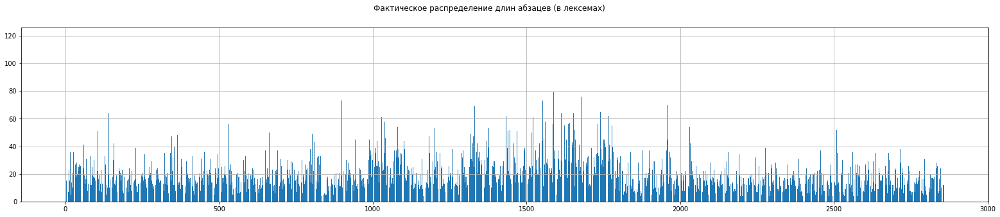

Collections Counter({13: 147, 12: 139, 15: 132, 19: 128, 11: 127, 14: 125, 16: 119, 10: 117, 9: 108, 8: 103, 18: 101, 17: 101, 20: 99, 7: 92, 22: 87, 21: 80, 24: 70, 23: 68, 26: 67, 25: 64, 5: 62, 27: 60, 6: 57, 31: 49, 29: 48, 30: 47, 28: 45, 4: 33, 32: 31, 33: 30, 37: 27, 35: 27, 36: 23, 39: 19, 34: 19, 38: 18, 42: 16, 40: 15, 45: 15, 41: 14, 43: 9, 51: 8, 47: 8, 56: 8, 44: 8, 52: 7, 48: 7, 49: 7, 46: 7, 62: 6, 50: 6, 64: 4, 53: 4, 58: 4, 57: 4, 73: 3, 55: 3, 61: 2, 54: 2, 69: 2, 72: 2, 59: 2, 65: 2, 63: 1, 60: 1, 103: 1, 75: 1, 85: 1, 83: 1, 77: 1, 79: 1, 120: 1, 76: 1, 67: 1, 80: 1, 99: 1, 88: 1, 104: 1, 70: 1})


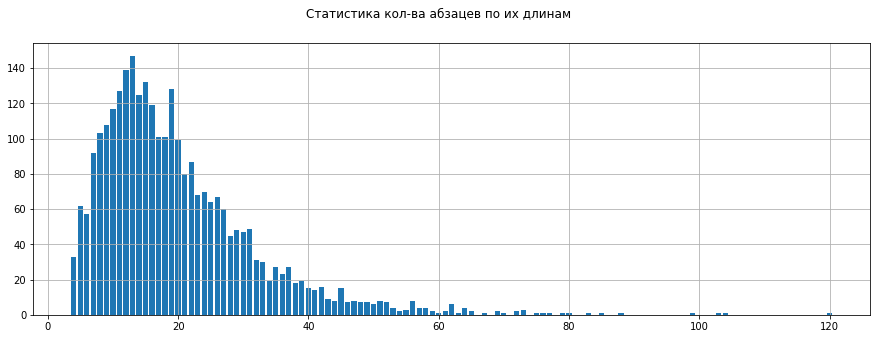

In [32]:
train_counter, train_count = draw_paragraphs_stat(paragraphs_train)

**Во скольких фразах встречается тот или  иной класс**

In [33]:
class_stat(paragraphs_train, tags_train)

Длина размеченной выборки: 2860

Статистика по классам
Фраз без определительных структур: 1271.0 - 44.44%
Фраз с категорией термин: 1575.0 - 55.07%
Фраз с категорией связка: 1545.0 - 54.02%
Фраз с категорией определение: 1518.0 - 53.08%
Фраз с категорией расшифровка: 779.0 - 27.24%
Фраз с категорией дубль-термин: 351.0 - 12.27%
Фраз с категорией дубль-связка: 259.0 - 9.06%
Фраз с категорией дубль-определение: 243.0 - 8.5%
Фраз с категорией дубль-расшифровка: 56.0 - 1.96%


### The extraction of morphological features for lexemes from the array paragraphs_train.

In [34]:
morph_train = []
for i, elem in enumerate(paragraphs_train):
  row = []
  for j,lexem in enumerate(elem):
    row.append(morphyus(lexem))
  morph_train.append(row)
  print(f'{i+1} done {j+1}!')

Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


1 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2 done 62!
3 done 22!
4 done 15!
5 done 13!
6 done 39!
7 done 27!
8 done 12!
9 done 20!
10 done 32!
11 done 7!
12 done 14!
13 done 23!
14 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

15 done 15!
16 done 33!
17 done 36!
18 done 12!
19 done 5!
20 done 15!
21 done 14!
22 done 18!
23 done 10!
24 done 15!
25 done 21!
26 done 42!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

27 done 36!
28 done 15!
29 done 16!
30 done 29!
31 done 17!
32 done 23!
33 done 18!
34 done 27!
35 done 11!
36 done 18!
37 done 12!
38 done 28!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

39 done 7!
40 done 20!
41 done 7!
42 done 22!
43 done 28!
44 done 25!
45 done 30!
46 done 27!
47 done 37!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

48 done 25!
49 done 10!
50 done 26!
51 done 8!
52 done 28!
53 done 14!
54 done 19!
55 done 8!
56 done 43!
57 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

58 done 40!
59 done 24!
60 done 11!
61 done 41!
62 done 62!
63 done 19!
64 done 19!
65 done 13!
66 done 13!
67 done 16!
68 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

69 done 31!
70 done 27!
71 done 16!
72 done 11!
73 done 8!
74 done 13!
75 done 13!
76 done 12!
77 done 24!
78 done 26!
79 done 19!
80 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

81 done 23!
82 done 33!
83 done 8!
84 done 12!
85 done 15!
86 done 12!
87 done 14!
88 done 25!
89 done 10!
90 done 19!
91 done 24!
92 done 18!
93 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

94 done 30!
95 done 32!
96 done 17!
97 done 20!
98 done 15!
99 done 11!
100 done 8!
101 done 18!
102 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

103 done 38!
104 done 22!
105 done 22!
106 done 19!
107 done 51!
108 done 21!
109 done 16!
110 done 29!
111 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

112 done 24!
113 done 8!
114 done 19!
115 done 13!
116 done 23!
117 done 23!
118 done 28!
119 done 7!
120 done 15!
121 done 13!
122 done 14!
123 done 19!
124 done 14!
125 done 13!
126 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

127 done 8!
128 done 20!
129 done 21!
130 done 33!
131 done 14!
132 done 27!
133 done 7!
134 done 5!
135 done 12!
136 done 12!
137 done 13!
138 done 10!
139 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

140 done 20!
141 done 15!
142 done 64!
143 done 10!
144 done 10!
145 done 32!
146 done 16!
147 done 9!
148 done 12!
149 done 20!
150 done 10!
151 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

152 done 27!
153 done 10!
154 done 7!
155 done 18!
156 done 18!
157 done 30!
158 done 14!
159 done 42!
160 done 13!
161 done 13!
162 done 12!
163 done 12!
164 done 9!
165 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

166 done 8!
167 done 19!
168 done 7!
169 done 7!
170 done 11!
171 done 8!
172 done 8!
173 done 14!
174 done 38!
175 done 15!
176 done 24!
177 done 11!
178 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

179 done 12!
180 done 21!
181 done 11!
182 done 15!
183 done 10!
184 done 19!
185 done 15!
186 done 23!
187 done 8!
188 done 8!
189 done 15!
190 done 6!
191 done 6!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

192 done 18!
193 done 11!
194 done 12!
195 done 14!
196 done 50!
197 done 17!
198 done 30!
199 done 38!
200 done 26!
201 done 10!
202 done 22!
203 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

204 done 37!
205 done 7!
206 done 6!
207 done 16!
208 done 10!
209 done 24!
210 done 9!
211 done 19!
212 done 22!
213 done 12!
214 done 13!
215 done 8!
216 done 20!
217 done 22!
218 done 34!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

219 done 20!
220 done 19!
221 done 40!
222 done 15!
223 done 29!
224 done 14!
225 done 9!
226 done 15!
227 done 41!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

228 done 16!
229 done 18!
230 done 39!
231 done 13!
232 done 11!
233 done 12!
234 done 7!
235 done 26!
236 done 7!
237 done 20!
238 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

239 done 31!
240 done 13!
241 done 27!
242 done 20!
243 done 13!
244 done 25!
245 done 10!
246 done 32!
247 done 14!
248 done 14!
249 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

250 done 35!
251 done 21!
252 done 27!
253 done 18!
254 done 26!
255 done 15!
256 done 25!
257 done 18!
258 done 12!
259 done 34!
260 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

261 done 16!
262 done 11!
263 done 13!
264 done 30!
265 done 10!
266 done 11!
267 done 20!
268 done 24!
269 done 20!
270 done 7!
271 done 12!
272 done 17!
273 done 17!
274 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

275 done 20!
276 done 25!
277 done 16!
278 done 21!
279 done 15!
280 done 29!
281 done 6!
282 done 15!
283 done 11!
284 done 13!
285 done 6!
286 done 9!
287 done 9!
288 done 11!
289 done 11!
290 done 13!
291 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

292 done 5!
293 done 22!
294 done 14!
295 done 12!
296 done 34!
297 done 23!
298 done 12!
299 done 15!
300 done 21!
301 done 24!
302 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

303 done 16!
304 done 17!
305 done 20!
306 done 6!
307 done 14!
308 done 14!
309 done 15!
310 done 12!
311 done 15!
312 done 63!
313 done 30!
314 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

315 done 52!
316 done 25!
317 done 15!
318 done 15!
319 done 7!
320 done 13!
321 done 8!
322 done 8!
323 done 35!
324 done 35!
325 done 16!
326 done 19!
327 done 11!
328 done 13!



Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to det

329 done 19!
330 done 18!
331 done 11!
332 done 21!
333 done 33!
334 done 12!
335 done 7!
336 done 6!
337 done 7!
338 done 4!
339 done 9!
340 done 5!
341 done 12!
342 done 13!
343 done 35!
344 done 13!
345 done 15!
346 done 6!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

347 done 47!
348 done 17!
349 done 22!
350 done 11!
351 done 32!
352 done 42!
353 done 12!
354 done 4!
355 done 40!
356 done 11!
357 done 12!
358 done 27!
359 done 8!
360 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

361 done 27!
362 done 9!
363 done 19!
364 done 5!
365 done 21!
366 done 48!
367 done 19!
368 done 12!
369 done 26!
370 done 14!
371 done 25!
372 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

373 done 26!
374 done 18!
375 done 16!
376 done 9!
377 done 11!
378 done 31!
379 done 19!
380 done 25!
381 done 14!
382 done 12!
383 done 24!
384 done 12!
385 done 12!
386 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

387 done 10!
388 done 8!
389 done 10!
390 done 10!
391 done 6!
392 done 11!
393 done 11!
394 done 14!
395 done 29!
396 done 17!
397 done 21!
398 done 17!
399 done 20!
400 done 7!
401 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

402 done 15!
403 done 14!
404 done 15!
405 done 16!
406 done 15!
407 done 17!
408 done 11!
409 done 9!
410 done 33!
411 done 31!
412 done 15!
413 done 16!
414 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

415 done 19!
416 done 33!
417 done 7!
418 done 8!
419 done 7!
420 done 5!
421 done 13!
422 done 19!
423 done 23!
424 done 15!
425 done 26!
426 done 14!
427 done 6!
428 done 13!
429 done 8!
430 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

431 done 30!
432 done 23!
433 done 13!
434 done 16!
435 done 16!
436 done 18!
437 done 18!
438 done 15!
439 done 21!
440 done 22!
441 done 8!
442 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

443 done 31!
444 done 32!
445 done 15!
446 done 19!
447 done 17!
448 done 17!
449 done 12!
450 done 12!
451 done 22!
452 done 14!
453 done 36!
454 done 26!
455 done 6!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

456 done 23!
457 done 20!
458 done 11!
459 done 16!
460 done 29!
461 done 14!
462 done 22!
463 done 22!
464 done 20!
465 done 14!
466 done 19!
467 done 15!
468 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

469 done 22!
470 done 23!
471 done 15!
472 done 21!
473 done 28!
474 done 31!
475 done 26!
476 done 14!
477 done 73!
478 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

479 done 7!
480 done 11!
481 done 12!
482 done 17!
483 done 11!
484 done 7!
485 done 5!
486 done 17!
487 done 10!
488 done 18!
489 done 24!
490 done 11!
491 done 21!
492 done 14!
493 done 13!
494 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

495 done 17!
496 done 16!
497 done 34!
498 done 26!
499 done 24!
500 done 22!
501 done 18!
502 done 19!
503 done 15!
504 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

505 done 64!
506 done 56!
507 done 21!
508 done 7!
509 done 10!
510 done 25!
511 done 30!
512 done 17!
513 done 17!
514 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

515 done 24!
516 done 17!
517 done 16!
518 done 20!
519 done 13!
520 done 26!
521 done 12!
522 done 19!
523 done 11!
524 done 13!
525 done 15!
526 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

527 done 60!
528 done 24!
529 done 42!
530 done 18!
531 done 27!
532 done 14!
533 done 56!
534 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

535 done 23!
536 done 22!
537 done 12!
538 done 33!
539 done 27!
540 done 13!
541 done 22!
542 done 11!
543 done 14!
544 done 4!
545 done 5!
546 done 9!
547 done 9!
548 done 6!
549 done 5!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

550 done 7!
551 done 5!
552 done 4!
553 done 9!
554 done 9!
555 done 18!
556 done 10!
557 done 11!
558 done 20!
559 done 4!
560 done 6!
561 done 8!
562 done 21!
563 done 13!
564 done 18!
565 done 45!
566 done 18!
567 done 10!
568 done 6!
569 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

570 done 7!
571 done 16!
572 done 14!
573 done 7!
574 done 29!
575 done 14!
576 done 26!
577 done 8!
578 done 37!
579 done 15!
580 done 13!
581 done 30!
582 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

583 done 22!
584 done 10!
585 done 14!
586 done 13!
587 done 33!
588 done 20!
589 done 7!
590 done 9!
591 done 19!
592 done 13!
593 done 16!
594 done 9!
595 done 21!
596 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

597 done 9!
598 done 17!
599 done 19!
600 done 10!
601 done 23!
602 done 16!
603 done 9!
604 done 19!
605 done 103!
606 done 16!
607 done 23!
608 done 20!
609 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

610 done 24!
611 done 9!
612 done 12!
613 done 26!
614 done 23!
615 done 14!
616 done 17!
617 done 10!
618 done 13!
619 done 10!
620 done 7!
621 done 12!
622 done 12!
623 done 12!
624 done 11!
625 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

626 done 11!
627 done 16!
628 done 11!
629 done 9!
630 done 15!
631 done 6!
632 done 28!
633 done 12!
634 done 14!
635 done 17!
636 done 15!
637 done 9!
638 done 10!
639 done 10!
640 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

641 done 18!
642 done 17!
643 done 12!
644 done 13!
645 done 13!
646 done 20!
647 done 19!
648 done 19!
649 done 15!
650 done 17!
651 done 19!
652 done 37!
653 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

654 done 14!
655 done 39!
656 done 16!
657 done 18!
658 done 24!
659 done 12!
660 done 18!
661 done 9!
662 done 18!
663 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

664 done 50!
665 done 22!
666 done 13!
667 done 17!
668 done 13!
669 done 24!
670 done 18!
671 done 18!
672 done 23!
673 done 15!
674 done 25!
675 done 23!
676 done 12!
677 done 8!
678 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

679 done 11!
680 done 19!
681 done 12!
682 done 13!
683 done 6!
684 done 18!
685 done 22!
686 done 28!
687 done 23!
688 done 62!
689 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

690 done 19!
691 done 37!
692 done 31!
693 done 48!
694 done 32!
695 done 15!
696 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

697 done 36!
698 done 11!
699 done 10!
700 done 31!
701 done 11!
702 done 14!
703 done 28!
704 done 26!
705 done 6!
706 done 9!
707 done 16!
708 done 15!
709 done 10!
710 done 16!
711 done 16!
712 done 11!
713 done 22!
714 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

715 done 19!
716 done 17!
717 done 16!
718 done 13!
719 done 25!
720 done 19!
721 done 11!
722 done 32!
723 done 23!
724 done 16!
725 done 30!
726 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

727 done 17!
728 done 13!
729 done 23!
730 done 15!
731 done 13!
732 done 21!
733 done 19!
734 done 18!
735 done 29!
736 done 32!
737 done 9!
738 done 18!
739 done 28!
740 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

741 done 18!
742 done 26!
743 done 18!
744 done 23!
745 done 14!
746 done 23!
747 done 26!
748 done 15!
749 done 20!
750 done 15!
751 done 19!
752 done 7!
753 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

754 done 16!
755 done 13!
756 done 19!
757 done 19!
758 done 22!
759 done 14!
760 done 13!
761 done 14!
762 done 11!
763 done 25!
764 done 18!
765 done 31!
766 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

767 done 24!
768 done 14!
769 done 14!
770 done 34!
771 done 30!
772 done 25!
773 done 6!
774 done 28!
775 done 20!
776 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

777 done 18!
778 done 25!
779 done 13!
780 done 15!
781 done 27!
782 done 26!
783 done 15!
784 done 17!
785 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

786 done 28!
787 done 24!
788 done 21!
789 done 13!
790 done 15!
791 done 12!
792 done 16!
793 done 8!
794 done 19!
795 done 11!
796 done 29!
797 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

798 done 38!
799 done 22!
800 done 14!
801 done 27!
802 done 27!
803 done 35!
804 done 49!
805 done 8!
806 done 13!
807 done 6!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

808 done 22!
809 done 17!
810 done 43!
811 done 32!
812 done 19!
813 done 9!
814 done 10!
815 done 18!
816 done 5!
817 done 15!
818 done 12!
819 done 9!
820 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

821 done 32!
822 done 12!
823 done 14!
824 done 14!
825 done 33!
826 done 27!
827 done 27!
828 done 17!
829 done 20!
830 done 24!
831 done 33!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

832 done 4!
833 done 4!
834 done 7!
835 done 5!
836 done 7!
837 done 8!
838 done 5!
839 done 5!
840 done 8!
841 done 4!
842 done 5!
843 done 6!
844 done 6!
845 done 5!
846 done 5!
847 done 7!
848 done 5!
849 done 8!
850 done 5!
851 done 5!
852 done 16!
853 done 18!
854 done 18!
855 done 16!
856 done 11!
857 done 14!
858 done 8!
859 done 18!
860 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

861 done 23!
862 done 9!
863 done 12!
864 done 27!
865 done 11!
866 done 25!
867 done 16!
868 done 8!
869 done 12!
870 done 18!
871 done 13!
872 done 15!
873 done 5!
874 done 8!
875 done 19!
876 done 19!
877 done 12!
878 done 8!
879 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

880 done 8!
881 done 21!
882 done 16!
883 done 16!
884 done 14!
885 done 13!
886 done 24!
887 done 18!
888 done 12!
889 done 17!
890 done 16!
891 done 27!
892 done 11!
893 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

894 done 21!
895 done 16!
896 done 11!
897 done 18!
898 done 19!
899 done 43!
900 done 73!
901 done 75!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

902 done 10!
903 done 18!
904 done 22!
905 done 27!
906 done 35!
907 done 12!
908 done 23!
909 done 30!
910 done 25!
911 done 30!
912 done 10!
913 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

914 done 25!
915 done 30!
916 done 34!
917 done 8!
918 done 10!
919 done 15!
920 done 22!
921 done 28!
922 done 14!
923 done 20!
924 done 17!
925 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

926 done 31!
927 done 17!
928 done 25!
929 done 21!
930 done 85!
931 done 16!
932 done 19!
933 done 9!
934 done 16!
935 done 13!
936 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

937 done 10!
938 done 20!
939 done 14!
940 done 8!
941 done 11!
942 done 15!
943 done 21!
944 done 45!
945 done 13!
946 done 16!
947 done 13!
948 done 11!
949 done 13!
950 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

951 done 11!
952 done 13!
953 done 13!
954 done 10!
955 done 18!
956 done 8!
957 done 10!
958 done 31!
959 done 24!
960 done 12!
961 done 23!
962 done 20!
963 done 20!
964 done 17!
965 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

966 done 7!
967 done 16!
968 done 17!
969 done 11!
970 done 13!
971 done 17!
972 done 17!
973 done 10!
974 done 11!
975 done 13!
976 done 19!
977 done 22!
978 done 14!
979 done 19!
980 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

981 done 53!
982 done 35!
983 done 14!
984 done 16!
985 done 34!
986 done 13!
987 done 32!
988 done 30!
989 done 41!
990 done 45!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

991 done 16!
992 done 33!
993 done 14!
994 done 37!
995 done 29!
996 done 18!
997 done 43!
998 done 34!
999 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1000 done 30!
1001 done 20!
1002 done 40!
1003 done 50!
1004 done 25!
1005 done 36!
1006 done 38!
1007 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1008 done 24!
1009 done 35!
1010 done 28!
1011 done 39!
1012 done 24!
1013 done 26!
1014 done 19!
1015 done 44!
1016 done 13!
1017 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1018 done 22!
1019 done 29!
1020 done 23!
1021 done 14!
1022 done 53!
1023 done 25!
1024 done 26!
1025 done 19!
1026 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1027 done 36!
1028 done 23!
1029 done 24!
1030 done 61!
1031 done 25!
1032 done 22!
1033 done 26!
1034 done 28!
1035 done 42!
1036 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1037 done 28!
1038 done 35!
1039 done 44!
1040 done 58!
1041 done 29!
1042 done 46!
1043 done 41!



Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to det

1044 done 26!
1045 done 28!
1046 done 12!
1047 done 17!
1048 done 26!
1049 done 24!
1050 done 16!
1051 done 8!
1052 done 22!
1053 done 15!
1054 done 14!
1055 done 10!
1056 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1057 done 18!
1058 done 7!
1059 done 24!
1060 done 7!
1061 done 14!
1062 done 22!
1063 done 13!
1064 done 14!
1065 done 17!
1066 done 18!
1067 done 13!
1068 done 32!
1069 done 29!
1070 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1071 done 37!
1072 done 30!
1073 done 31!
1074 done 13!
1075 done 39!
1076 done 39!
1077 done 33!
1078 done 37!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1079 done 52!
1080 done 32!
1081 done 21!
1082 done 54!
1083 done 35!
1084 done 32!
1085 done 32!
1086 done 38!
1087 done 20!
1088 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1089 done 19!
1090 done 27!
1091 done 35!
1092 done 35!
1093 done 20!
1094 done 34!
1095 done 42!
1096 done 45!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1097 done 29!
1098 done 29!
1099 done 22!
1100 done 45!
1101 done 41!
1102 done 17!
1103 done 44!
1104 done 23!
1105 done 38!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1106 done 19!
1107 done 17!
1108 done 16!
1109 done 15!
1110 done 27!
1111 done 15!
1112 done 23!
1113 done 26!
1114 done 26!
1115 done 20!
1116 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1117 done 23!
1118 done 19!
1119 done 22!
1120 done 18!
1121 done 6!
1122 done 18!
1123 done 20!
1124 done 19!
1125 done 13!
1126 done 24!
1127 done 9!
1128 done 12!
1129 done 13!
1130 done 20!
1131 done 16!
1132 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1133 done 29!
1134 done 9!
1135 done 11!
1136 done 10!
1137 done 11!
1138 done 14!
1139 done 10!
1140 done 13!
1141 done 12!
1142 done 21!
1143 done 8!
1144 done 6!
1145 done 16!
1146 done 12!
1147 done 15!
1148 done 8!
1149 done 15!
1150 done 14!
1151 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1152 done 14!
1153 done 9!
1154 done 11!
1155 done 20!
1156 done 13!
1157 done 11!
1158 done 14!
1159 done 12!
1160 done 25!
1161 done 31!
1162 done 6!
1163 done 9!
1164 done 4!
1165 done 4!
1166 done 9!
1167 done 15!
1168 done 9!
1169 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1170 done 21!
1171 done 11!
1172 done 11!
1173 done 18!
1174 done 10!
1175 done 28!
1176 done 14!
1177 done 13!
1178 done 23!
1179 done 10!
1180 done 13!
1181 done 11!
1182 done 10!
1183 done 6!
1184 done 47!
1185 done 33!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1186 done 35!
1187 done 9!
1188 done 18!
1189 done 9!
1190 done 14!
1191 done 16!
1192 done 25!
1193 done 14!
1194 done 29!
1195 done 15!
1196 done 22!
1197 done 29!
1198 done 20!
1199 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1200 done 19!
1201 done 23!
1202 done 45!
1203 done 53!
1204 done 16!
1205 done 25!
1206 done 31!
1207 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1208 done 22!
1209 done 36!
1210 done 11!
1211 done 29!
1212 done 13!
1213 done 9!
1214 done 30!
1215 done 33!
1216 done 16!
1217 done 17!
1218 done 15!
1219 done 11!
1220 done 35!
1221 done 20!
1222 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1223 done 20!
1224 done 24!
1225 done 12!
1226 done 26!
1227 done 49!
1228 done 11!
1229 done 34!
1230 done 13!
1231 done 11!
1232 done 16!
1233 done 13!
1234 done 13!
1235 done 14!
1236 done 7!
1237 done 9!
1238 done 5!
1239 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1240 done 16!
1241 done 14!
1242 done 27!
1243 done 20!
1244 done 21!
1245 done 14!
1246 done 27!
1247 done 18!
1248 done 19!
1249 done 26!
1250 done 14!
1251 done 15!
1252 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1253 done 21!
1254 done 24!
1255 done 19!
1256 done 10!
1257 done 9!
1258 done 21!
1259 done 38!
1260 done 40!
1261 done 18!
1262 done 31!



Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to det

1263 done 33!
1264 done 25!
1265 done 15!
1266 done 11!
1267 done 20!
1268 done 11!
1269 done 16!
1270 done 13!
1271 done 7!
1272 done 14!
1273 done 6!
1274 done 12!
1275 done 12!
1276 done 11!
1277 done 16!
1278 done 23!
1279 done 13!
1280 done 5!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1281 done 19!
1282 done 19!
1283 done 46!
1284 done 12!
1285 done 28!
1286 done 16!
1287 done 45!
1288 done 28!
1289 done 25!
1290 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1291 done 35!
1292 done 12!
1293 done 32!
1294 done 30!
1295 done 37!
1296 done 24!
1297 done 21!
1298 done 26!
1299 done 25!
1300 done 21!
1301 done 14!
1302 done 16!
1303 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1304 done 12!
1305 done 18!
1306 done 17!
1307 done 10!
1308 done 16!
1309 done 12!
1310 done 48!
1311 done 33!
1312 done 22!
1313 done 44!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1314 done 17!
1315 done 21!
1316 done 25!
1317 done 49!
1318 done 31!
1319 done 14!
1320 done 49!
1321 done 9!
1322 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1323 done 38!
1324 done 29!
1325 done 33!
1326 done 42!
1327 done 39!
1328 done 47!
1329 done 26!
1330 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1331 done 40!
1332 done 69!
1333 done 31!
1334 done 26!
1335 done 22!
1336 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1337 done 36!
1338 done 22!
1339 done 36!
1340 done 24!
1341 done 42!
1342 done 31!
1343 done 21!
1344 done 12!
1345 done 32!
1346 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1347 done 29!
1348 done 12!
1349 done 36!
1350 done 32!
1351 done 20!
1352 done 24!
1353 done 30!
1354 done 21!
1355 done 27!
1356 done 38!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1357 done 20!
1358 done 44!
1359 done 46!
1360 done 8!
1361 done 10!
1362 done 49!
1363 done 72!
1364 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1365 done 45!
1366 done 30!
1367 done 16!
1368 done 20!
1369 done 9!
1370 done 22!
1371 done 16!
1372 done 44!
1373 done 47!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1374 done 32!
1375 done 41!
1376 done 40!
1377 done 20!
1378 done 53!
1379 done 24!
1380 done 12!
1381 done 41!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1382 done 30!
1383 done 30!
1384 done 30!
1385 done 14!
1386 done 39!
1387 done 10!
1388 done 22!
1389 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1390 done 41!
1391 done 26!
1392 done 28!
1393 done 25!
1394 done 29!
1395 done 29!
1396 done 10!
1397 done 29!
1398 done 39!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1399 done 20!
1400 done 14!
1401 done 18!
1402 done 14!
1403 done 14!
1404 done 14!
1405 done 15!
1406 done 16!
1407 done 19!
1408 done 31!
1409 done 16!
1410 done 16!
1411 done 15!
1412 done 16!
1413 done 14!
1414 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1415 done 22!
1416 done 26!
1417 done 20!
1418 done 12!
1419 done 26!
1420 done 8!
1421 done 10!
1422 done 12!
1423 done 27!
1424 done 26!
1425 done 21!
1426 done 29!
1427 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1428 done 27!
1429 done 25!
1430 done 31!
1431 done 26!
1432 done 18!
1433 done 24!
1434 done 43!
1435 done 62!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1436 done 47!
1437 done 19!
1438 done 29!
1439 done 39!
1440 done 20!
1441 done 51!
1442 done 15!
1443 done 22!
1444 done 28!
1445 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1446 done 21!
1447 done 52!
1448 done 23!
1449 done 16!
1450 done 42!
1451 done 13!
1452 done 19!
1453 done 28!
1454 done 28!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1455 done 40!
1456 done 34!
1457 done 16!
1458 done 19!
1459 done 15!
1460 done 42!
1461 done 39!
1462 done 32!
1463 done 83!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1464 done 14!
1465 done 20!
1466 done 28!
1467 done 11!
1468 done 20!
1469 done 15!
1470 done 51!
1471 done 26!
1472 done 21!
1473 done 25!
1474 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1475 done 35!
1476 done 30!
1477 done 36!
1478 done 27!
1479 done 15!
1480 done 22!
1481 done 24!
1482 done 22!
1483 done 19!
1484 done 22!
1485 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1486 done 77!
1487 done 14!
1488 done 20!
1489 done 22!
1490 done 21!
1491 done 26!
1492 done 59!
1493 done 37!
1494 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1495 done 39!
1496 done 31!
1497 done 23!
1498 done 72!
1499 done 55!
1500 done 14!
1501 done 31!
1502 done 36!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1503 done 41!
1504 done 32!
1505 done 23!
1506 done 13!
1507 done 57!
1508 done 16!
1509 done 25!
1510 done 25!
1511 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1512 done 26!
1513 done 40!
1514 done 24!
1515 done 26!
1516 done 50!
1517 done 12!
1518 done 18!
1519 done 29!
1520 done 26!
1521 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1522 done 61!
1523 done 26!
1524 done 22!
1525 done 29!
1526 done 34!
1527 done 39!
1528 done 30!
1529 done 21!
1530 done 39!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1531 done 37!
1532 done 36!
1533 done 30!
1534 done 37!
1535 done 23!
1536 done 33!
1537 done 20!
1538 done 38!
1539 done 20!
1540 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1541 done 32!
1542 done 30!
1543 done 42!
1544 done 29!
1545 done 24!
1546 done 48!
1547 done 31!
1548 done 35!
1549 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1550 done 27!
1551 done 48!
1552 done 44!
1553 done 52!
1554 done 73!
1555 done 47!
1556 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1557 done 36!
1558 done 46!
1559 done 50!
1560 done 27!
1561 done 16!
1562 done 58!
1563 done 18!
1564 done 21!
1565 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1566 done 28!
1567 done 22!
1568 done 31!
1569 done 43!
1570 done 27!
1571 done 17!
1572 done 30!
1573 done 23!
1574 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1575 done 62!
1576 done 38!
1577 done 24!
1578 done 23!
1579 done 21!
1580 done 40!
1581 done 22!
1582 done 17!
1583 done 24!
1584 done 27!
1585 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1586 done 50!
1587 done 56!
1588 done 27!
1589 done 79!
1590 done 56!
1591 done 37!
1592 done 49!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1593 done 31!
1594 done 30!
1595 done 33!
1596 done 37!
1597 done 51!
1598 done 19!
1599 done 17!
1600 done 5!
1601 done 14!
1602 done 16!
1603 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1604 done 37!
1605 done 19!
1606 done 31!
1607 done 34!
1608 done 23!
1609 done 28!
1610 done 30!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1611 done 120!
1612 done 18!
1613 done 25!
1614 done 64!
1615 done 43!
1616 done 29!
1617 done 31!
1618 done 31!
1619 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1620 done 18!
1621 done 40!
1622 done 39!
1623 done 8!
1624 done 15!
1625 done 55!
1626 done 31!
1627 done 30!
1628 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1629 done 31!
1630 done 24!
1631 done 45!
1632 done 27!
1633 done 19!
1634 done 58!
1635 done 17!
1636 done 38!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1637 done 56!
1638 done 18!
1639 done 29!
1640 done 31!
1641 done 57!
1642 done 21!
1643 done 19!
1644 done 49!
1645 done 28!
1646 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1647 done 29!
1648 done 28!
1649 done 51!
1650 done 43!
1651 done 35!
1652 done 41!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1653 done 33!
1654 done 64!
1655 done 27!
1656 done 11!
1657 done 27!
1658 done 52!
1659 done 11!
1660 done 45!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1661 done 38!
1662 done 28!
1663 done 30!
1664 done 25!
1665 done 21!
1666 done 28!
1667 done 16!
1668 done 41!
1669 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1670 done 23!
1671 done 30!
1672 done 14!
1673 done 41!
1674 done 14!
1675 done 22!
1676 done 37!
1677 done 25!
1678 done 51!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1679 done 76!
1680 done 28!
1681 done 19!
1682 done 59!
1683 done 14!
1684 done 22!
1685 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1686 done 44!
1687 done 29!
1688 done 51!
1689 done 35!
1690 done 24!
1691 done 34!
1692 done 52!
1693 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1694 done 29!
1695 done 30!
1696 done 28!
1697 done 25!
1698 done 26!
1699 done 35!
1700 done 32!
1701 done 27!
1702 done 33!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1703 done 38!
1704 done 11!
1705 done 16!
1706 done 13!
1707 done 8!
1708 done 12!
1709 done 12!
1710 done 11!
1711 done 18!
1712 done 39!
1713 done 20!
1714 done 29!
1715 done 19!
1716 done 47!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1717 done 33!
1718 done 20!
1719 done 19!
1720 done 25!
1721 done 32!
1722 done 19!
1723 done 25!
1724 done 25!
1725 done 21!
1726 done 25!
1727 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1728 done 57!
1729 done 34!
1730 done 40!
1731 done 35!
1732 done 67!
1733 done 56!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1734 done 27!
1735 done 33!
1736 done 46!
1737 done 37!
1738 done 37!
1739 done 16!
1740 done 37!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1741 done 33!
1742 done 65!
1743 done 42!
1744 done 38!
1745 done 23!
1746 done 27!
1747 done 36!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1748 done 30!
1749 done 56!
1750 done 25!
1751 done 51!
1752 done 45!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1753 done 65!
1754 done 45!
1755 done 36!
1756 done 42!
1757 done 31!
1758 done 40!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1759 done 80!
1760 done 46!
1761 done 28!
1762 done 33!
1763 done 23!
1764 done 29!
1765 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1766 done 99!
1767 done 29!
1768 done 57!
1769 done 62!
1770 done 22!
1771 done 41!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1772 done 88!
1773 done 31!
1774 done 58!
1775 done 20!
1776 done 25!
1777 done 16!
1778 done 42!
1779 done 55!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1780 done 37!
1781 done 40!
1782 done 104!
1783 done 36!
1784 done 20!
1785 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1786 done 35!
1787 done 26!
1788 done 19!
1789 done 20!
1790 done 22!
1791 done 17!
1792 done 9!
1793 done 15!
1794 done 17!
1795 done 9!
1796 done 30!
1797 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1798 done 32!
1799 done 8!
1800 done 18!
1801 done 5!
1802 done 8!
1803 done 10!
1804 done 28!
1805 done 22!
1806 done 33!
1807 done 12!
1808 done 26!
1809 done 15!
1810 done 22!
1811 done 16!
1812 done 5!
1813 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1814 done 12!
1815 done 22!
1816 done 13!
1817 done 5!
1818 done 8!
1819 done 8!
1820 done 8!
1821 done 7!
1822 done 6!
1823 done 13!
1824 done 29!
1825 done 20!
1826 done 5!
1827 done 6!
1828 done 8!
1829 done 11!
1830 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1831 done 28!
1832 done 21!
1833 done 9!
1834 done 8!
1835 done 8!
1836 done 11!
1837 done 22!
1838 done 12!
1839 done 21!
1840 done 36!
1841 done 9!
1842 done 11!
1843 done 11!
1844 done 9!
1845 done 25!
1846 done 16!
1847 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1848 done 7!
1849 done 19!
1850 done 16!
1851 done 8!
1852 done 8!
1853 done 22!
1854 done 6!
1855 done 30!
1856 done 7!
1857 done 8!
1858 done 10!
1859 done 9!
1860 done 16!
1861 done 9!
1862 done 13!
1863 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1864 done 15!
1865 done 28!
1866 done 32!
1867 done 13!
1868 done 12!
1869 done 15!
1870 done 7!
1871 done 4!
1872 done 11!
1873 done 8!
1874 done 7!
1875 done 6!
1876 done 6!
1877 done 37!
1878 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1879 done 11!
1880 done 13!
1881 done 18!
1882 done 10!
1883 done 18!
1884 done 22!
1885 done 34!
1886 done 17!
1887 done 9!
1888 done 17!
1889 done 30!
1890 done 21!
1891 done 38!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1892 done 11!
1893 done 19!
1894 done 17!
1895 done 33!
1896 done 15!
1897 done 14!
1898 done 21!
1899 done 24!
1900 done 37!
1901 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1902 done 24!
1903 done 10!
1904 done 24!
1905 done 21!
1906 done 12!
1907 done 8!
1908 done 5!
1909 done 5!
1910 done 15!
1911 done 23!
1912 done 20!
1913 done 29!
1914 done 9!
1915 done 9!
1916 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1917 done 29!
1918 done 28!
1919 done 10!
1920 done 16!
1921 done 10!
1922 done 11!
1923 done 7!
1924 done 8!
1925 done 19!
1926 done 20!
1927 done 18!
1928 done 14!
1929 done 5!
1930 done 16!
1931 done 10!
1932 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1933 done 14!
1934 done 5!
1935 done 16!
1936 done 10!
1937 done 10!
1938 done 20!
1939 done 16!
1940 done 23!
1941 done 48!
1942 done 31!
1943 done 21!
1944 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1945 done 22!
1946 done 20!
1947 done 20!
1948 done 14!
1949 done 20!
1950 done 37!
1951 done 17!
1952 done 7!
1953 done 20!
1954 done 18!
1955 done 10!
1956 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1957 done 37!
1958 done 27!
1959 done 70!
1960 done 17!
1961 done 45!
1962 done 23!
1963 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1964 done 69!
1965 done 18!
1966 done 25!
1967 done 36!
1968 done 13!
1969 done 32!
1970 done 27!
1971 done 8!
1972 done 14!
1973 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1974 done 14!
1975 done 11!
1976 done 16!
1977 done 16!
1978 done 16!
1979 done 15!
1980 done 13!
1981 done 12!
1982 done 15!
1983 done 5!
1984 done 5!
1985 done 10!
1986 done 9!
1987 done 5!
1988 done 16!
1989 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1990 done 22!
1991 done 10!
1992 done 19!
1993 done 6!
1994 done 12!
1995 done 30!
1996 done 11!
1997 done 8!
1998 done 20!
1999 done 45!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2000 done 56!
2001 done 35!
2002 done 43!
2003 done 20!
2004 done 21!
2005 done 21!
2006 done 34!
2007 done 15!
2008 done 29!
2009 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2010 done 8!
2011 done 19!
2012 done 37!
2013 done 15!
2014 done 28!
2015 done 8!
2016 done 25!
2017 done 19!
2018 done 10!
2019 done 22!
2020 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2021 done 21!
2022 done 19!
2023 done 13!
2024 done 13!
2025 done 21!
2026 done 8!
2027 done 12!
2028 done 11!
2029 done 8!
2030 done 10!
2031 done 9!
2032 done 54!
2033 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2034 done 42!
2035 done 26!
2036 done 19!
2037 done 23!
2038 done 29!
2039 done 16!
2040 done 22!
2041 done 15!
2042 done 19!
2043 done 25!
2044 done 16!
2045 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2046 done 21!
2047 done 13!
2048 done 15!
2049 done 24!
2050 done 11!
2051 done 12!
2052 done 26!
2053 done 26!
2054 done 9!
2055 done 7!
2056 done 9!
2057 done 17!
2058 done 7!
2059 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2060 done 12!
2061 done 9!
2062 done 10!
2063 done 20!
2064 done 10!
2065 done 8!
2066 done 7!
2067 done 17!
2068 done 6!
2069 done 14!
2070 done 10!
2071 done 10!
2072 done 11!
2073 done 8!
2074 done 7!
2075 done 7!
2076 done 15!
2077 done 6!
2078 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2079 done 25!
2080 done 15!
2081 done 11!
2082 done 22!
2083 done 14!
2084 done 11!
2085 done 6!
2086 done 15!
2087 done 20!
2088 done 20!
2089 done 17!
2090 done 12!
2091 done 22!
2092 done 5!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2093 done 15!
2094 done 24!
2095 done 36!
2096 done 31!
2097 done 7!
2098 done 8!
2099 done 16!
2100 done 19!
2101 done 28!
2102 done 26!
2103 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2104 done 9!
2105 done 12!
2106 done 9!
2107 done 18!
2108 done 15!
2109 done 17!
2110 done 15!
2111 done 23!
2112 done 23!
2113 done 14!
2114 done 13!
2115 done 6!
2116 done 11!
2117 done 18!
2118 done 5!
2119 done 20!
2120 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2121 done 16!
2122 done 16!
2123 done 24!
2124 done 14!
2125 done 40!
2126 done 11!
2127 done 12!
2128 done 10!
2129 done 13!
2130 done 15!
2131 done 10!
2132 done 20!
2133 done 9!
2134 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2135 done 14!
2136 done 12!
2137 done 26!
2138 done 13!
2139 done 8!
2140 done 8!
2141 done 17!
2142 done 32!
2143 done 10!
2144 done 13!
2145 done 8!
2146 done 17!
2147 done 24!
2148 done 8!
2149 done 6!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2150 done 32!
2151 done 8!
2152 done 20!
2153 done 29!
2154 done 6!
2155 done 19!
2156 done 13!
2157 done 36!
2158 done 11!
2159 done 17!
2160 done 21!
2161 done 11!
2162 done 7!
2163 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2164 done 16!
2165 done 14!
2166 done 9!
2167 done 17!
2168 done 12!
2169 done 11!
2170 done 13!
2171 done 10!
2172 done 14!
2173 done 15!
2174 done 8!
2175 done 9!
2176 done 7!
2177 done 7!
2178 done 9!
2179 done 9!
2180 done 8!
2181 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2182 done 9!
2183 done 13!
2184 done 22!
2185 done 25!
2186 done 13!
2187 done 27!
2188 done 17!
2189 done 8!
2190 done 7!
2191 done 29!
2192 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2193 done 34!
2194 done 26!
2195 done 19!
2196 done 12!
2197 done 4!
2198 done 26!
2199 done 18!
2200 done 8!
2201 done 11!
2202 done 11!
2203 done 4!
2204 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2205 done 13!
2206 done 7!
2207 done 17!
2208 done 15!
2209 done 13!
2210 done 15!
2211 done 28!
2212 done 7!
2213 done 22!
2214 done 13!
2215 done 9!
2216 done 18!
2217 done 10!
2218 done 12!
2219 done 13!
2220 done 7!
2221 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2222 done 16!
2223 done 19!
2224 done 17!
2225 done 4!
2226 done 12!
2227 done 9!
2228 done 19!
2229 done 22!
2230 done 18!
2231 done 22!
2232 done 14!
2233 done 9!
2234 done 20!
2235 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2236 done 17!
2237 done 10!
2238 done 34!
2239 done 19!
2240 done 19!
2241 done 16!
2242 done 25!
2243 done 12!
2244 done 14!
2245 done 11!
2246 done 12!
2247 done 32!
2248 done 4!
2249 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2250 done 29!
2251 done 11!
2252 done 18!
2253 done 7!
2254 done 23!
2255 done 13!
2256 done 22!
2257 done 26!
2258 done 6!
2259 done 25!
2260 done 23!
2261 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2262 done 21!
2263 done 28!
2264 done 15!
2265 done 9!
2266 done 5!
2267 done 7!
2268 done 11!
2269 done 11!
2270 done 18!
2271 done 11!
2272 done 16!
2273 done 12!
2274 done 18!
2275 done 21!
2276 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2277 done 12!
2278 done 39!
2279 done 31!
2280 done 21!
2281 done 30!
2282 done 23!
2283 done 27!
2284 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2285 done 39!
2286 done 19!
2287 done 18!
2288 done 23!
2289 done 21!
2290 done 11!
2291 done 11!
2292 done 18!
2293 done 4!
2294 done 47!
2295 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2296 done 24!
2297 done 24!
2298 done 11!
2299 done 27!
2300 done 9!
2301 done 14!
2302 done 4!
2303 done 12!
2304 done 13!
2305 done 15!
2306 done 9!
2307 done 15!
2308 done 10!
2309 done 5!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2310 done 48!
2311 done 21!
2312 done 28!
2313 done 17!
2314 done 24!
2315 done 12!
2316 done 20!
2317 done 15!
2318 done 9!
2319 done 25!
2320 done 9!
2321 done 26!
2322 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2323 done 15!
2324 done 18!
2325 done 4!
2326 done 11!
2327 done 30!
2328 done 11!
2329 done 9!
2330 done 8!
2331 done 8!
2332 done 8!
2333 done 12!
2334 done 15!
2335 done 7!
2336 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2337 done 15!
2338 done 17!
2339 done 8!
2340 done 5!
2341 done 17!
2342 done 15!
2343 done 9!
2344 done 10!
2345 done 16!
2346 done 8!
2347 done 9!
2348 done 13!
2349 done 16!
2350 done 11!
2351 done 27!
2352 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2353 done 12!
2354 done 21!
2355 done 23!
2356 done 18!
2357 done 9!
2358 done 19!
2359 done 17!
2360 done 17!
2361 done 17!
2362 done 14!
2363 done 6!
2364 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2365 done 33!
2366 done 19!
2367 done 11!
2368 done 16!
2369 done 15!
2370 done 22!
2371 done 13!
2372 done 15!
2373 done 9!
2374 done 19!
2375 done 13!
2376 done 11!
2377 done 11!
2378 done 12!
2379 done 7!
2380 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2381 done 10!
2382 done 24!
2383 done 9!
2384 done 12!
2385 done 11!
2386 done 20!
2387 done 31!
2388 done 13!
2389 done 17!
2390 done 18!
2391 done 7!
2392 done 14!
2393 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2394 done 11!
2395 done 8!
2396 done 23!
2397 done 7!
2398 done 18!
2399 done 4!
2400 done 13!
2401 done 5!
2402 done 11!
2403 done 11!
2404 done 7!
2405 done 10!
2406 done 5!
2407 done 21!
2408 done 13!
2409 done 16!
2410 done 19!
2411 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2412 done 24!
2413 done 23!
2414 done 15!
2415 done 14!
2416 done 6!
2417 done 19!
2418 done 16!
2419 done 19!
2420 done 6!
2421 done 11!
2422 done 18!
2423 done 9!
2424 done 20!
2425 done 5!
2426 done 10!
2427 done 45!
2428 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2429 done 25!
2430 done 19!
2431 done 13!
2432 done 6!
2433 done 20!
2434 done 24!
2435 done 20!
2436 done 10!
2437 done 21!
2438 done 7!
2439 done 8!
2440 done 9!
2441 done 5!
2442 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2443 done 19!
2444 done 18!
2445 done 7!
2446 done 13!
2447 done 22!
2448 done 10!
2449 done 15!
2450 done 7!
2451 done 13!
2452 done 6!
2453 done 24!
2454 done 23!
2455 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2456 done 10!
2457 done 16!
2458 done 37!
2459 done 15!
2460 done 21!
2461 done 13!
2462 done 5!
2463 done 9!
2464 done 12!
2465 done 6!
2466 done 20!
2467 done 17!
2468 done 8!
2469 done 9!
2470 done 8!
2471 done 19!
2472 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2473 done 18!
2474 done 10!
2475 done 9!
2476 done 10!
2477 done 4!
2478 done 10!
2479 done 14!
2480 done 6!
2481 done 15!
2482 done 7!
2483 done 12!
2484 done 16!
2485 done 4!
2486 done 10!
2487 done 9!
2488 done 31!
2489 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2490 done 39!
2491 done 27!
2492 done 27!
2493 done 14!
2494 done 12!
2495 done 4!
2496 done 22!
2497 done 17!
2498 done 12!
2499 done 4!
2500 done 12!
2501 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2502 done 18!
2503 done 12!
2504 done 14!
2505 done 10!
2506 done 12!
2507 done 26!
2508 done 11!
2509 done 4!
2510 done 52!
2511 done 11!
2512 done 35!
2513 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2514 done 13!
2515 done 7!
2516 done 14!
2517 done 16!
2518 done 7!
2519 done 13!
2520 done 14!
2521 done 24!
2522 done 13!
2523 done 16!
2524 done 16!
2525 done 21!
2526 done 12!
2527 done 20!
2528 done 21!



Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to det

2529 done 30!
2530 done 9!
2531 done 7!
2532 done 5!
2533 done 5!
2534 done 35!
2535 done 4!
2536 done 15!
2537 done 9!
2538 done 13!
2539 done 9!
2540 done 26!
2541 done 13!
2542 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2543 done 17!
2544 done 31!
2545 done 37!
2546 done 7!
2547 done 12!
2548 done 23!
2549 done 5!
2550 done 21!
2551 done 8!
2552 done 13!
2553 done 9!
2554 done 10!
2555 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2556 done 25!
2557 done 11!
2558 done 12!
2559 done 10!
2560 done 7!
2561 done 29!
2562 done 36!
2563 done 18!
2564 done 4!
2565 done 18!
2566 done 16!
2567 done 15!
2568 done 22!
2569 done 15!
2570 done 10!



Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to det

2571 done 14!
2572 done 5!
2573 done 27!
2574 done 41!
2575 done 21!
2576 done 21!
2577 done 27!
2578 done 24!
2579 done 4!
2580 done 16!
2581 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2582 done 21!
2583 done 18!
2584 done 19!
2585 done 26!
2586 done 13!
2587 done 10!
2588 done 10!
2589 done 15!
2590 done 19!
2591 done 17!
2592 done 27!
2593 done 13!
2594 done 14!
2595 done 6!
2596 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2597 done 20!
2598 done 8!
2599 done 13!
2600 done 15!
2601 done 10!
2602 done 7!
2603 done 26!
2604 done 27!
2605 done 20!
2606 done 12!
2607 done 10!
2608 done 20!
2609 done 10!
2610 done 15!
2611 done 4!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2612 done 29!
2613 done 20!
2614 done 23!
2615 done 11!
2616 done 17!
2617 done 19!
2618 done 9!
2619 done 25!
2620 done 5!
2621 done 11!
2622 done 5!
2623 done 7!
2624 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2625 done 21!
2626 done 13!
2627 done 9!
2628 done 14!
2629 done 29!
2630 done 6!
2631 done 14!
2632 done 24!
2633 done 8!
2634 done 18!
2635 done 13!
2636 done 13!
2637 done 35!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2638 done 15!
2639 done 17!
2640 done 16!
2641 done 26!
2642 done 8!
2643 done 13!
2644 done 9!
2645 done 15!
2646 done 9!
2647 done 19!
2648 done 24!
2649 done 12!
2650 done 21!
2651 done 10!
2652 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2653 done 19!
2654 done 15!
2655 done 24!
2656 done 15!
2657 done 27!
2658 done 19!
2659 done 12!
2660 done 19!
2661 done 12!
2662 done 30!
2663 done 23!
2664 done 9!
2665 done 6!
2666 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2667 done 13!
2668 done 16!
2669 done 26!
2670 done 18!
2671 done 12!
2672 done 7!
2673 done 17!
2674 done 11!
2675 done 6!
2676 done 24!
2677 done 22!
2678 done 10!
2679 done 35!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2680 done 23!
2681 done 30!
2682 done 10!
2683 done 12!
2684 done 9!
2685 done 15!
2686 done 4!
2687 done 6!
2688 done 15!
2689 done 20!
2690 done 7!
2691 done 4!
2692 done 12!
2693 done 21!
2694 done 12!
2695 done 27!
2696 done 5!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2697 done 17!
2698 done 8!
2699 done 36!
2700 done 24!
2701 done 18!
2702 done 23!
2703 done 42!
2704 done 10!
2705 done 19!
2706 done 9!
2707 done 9!
2708 done 17!
2709 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2710 done 15!
2711 done 12!
2712 done 12!
2713 done 10!
2714 done 20!
2715 done 10!
2716 done 21!
2717 done 28!
2718 done 7!
2719 done 38!
2720 done 15!
2721 done 9!
2722 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2723 done 24!
2724 done 27!
2725 done 21!
2726 done 8!
2727 done 6!
2728 done 27!
2729 done 17!
2730 done 10!
2731 done 12!
2732 done 14!
2733 done 13!
2734 done 7!
2735 done 31!
2736 done 7!
2737 done 15!
2738 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2739 done 9!
2740 done 15!
2741 done 13!
2742 done 13!
2743 done 17!
2744 done 26!
2745 done 12!
2746 done 8!
2747 done 17!
2748 done 22!
2749 done 7!
2750 done 8!
2751 done 11!
2752 done 5!
2753 done 7!
2754 done 7!
2755 done 5!
2756 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2757 done 9!
2758 done 16!
2759 done 7!
2760 done 12!
2761 done 8!
2762 done 16!
2763 done 14!
2764 done 6!
2765 done 7!
2766 done 13!
2767 done 13!
2768 done 5!
2769 done 17!
2770 done 11!
2771 done 14!
2772 done 8!
2773 done 13!
2774 done 4!
2775 done 18!
2776 done 14!
2777 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2778 done 11!
2779 done 22!
2780 done 5!
2781 done 19!
2782 done 5!
2783 done 13!
2784 done 24!
2785 done 15!
2786 done 8!
2787 done 12!
2788 done 16!
2789 done 30!
2790 done 6!
2791 done 5!
2792 done 5!
2793 done 9!
2794 done 16!
2795 done 5!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2796 done 31!
2797 done 13!
2798 done 11!
2799 done 5!
2800 done 8!
2801 done 26!
2802 done 5!
2803 done 25!
2804 done 16!
2805 done 9!
2806 done 14!
2807 done 6!
2808 done 27!
2809 done 14!
2810 done 12!
2811 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2812 done 30!
2813 done 10!
2814 done 17!
2815 done 20!
2816 done 11!
2817 done 9!
2818 done 19!
2819 done 17!
2820 done 12!
2821 done 17!
2822 done 18!
2823 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2824 done 18!
2825 done 16!
2826 done 18!
2827 done 18!
2828 done 4!
2829 done 46!
2830 done 28!
2831 done 14!
2832 done 8!
2833 done 7!
2834 done 28!
2835 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2836 done 24!
2837 done 9!
2838 done 26!
2839 done 10!
2840 done 8!
2841 done 10!
2842 done 6!
2843 done 19!
2844 done 16!
2845 done 20!
2846 done 8!
2847 done 20!
2848 done 24!
2849 done 10!
2850 done 10!
2851 done 9!
2852 done 6!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

2853 done 33!
2854 done 33!
2855 done 12!
2856 done 10!
2857 done 12!
2858 done 20!
2859 done 12!
2860 done 4!


In [35]:
for mrph in morph_train[1999]:
  print(mrph)

['ru', 'true', 'сформулировать', 'INFN', 'None', 'perf', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'tran', 'None']
['ru', 'false', 'он', 'NPRO', 'None', 'None', 'accs', 'masc', 'None', 'None', 'sing', '3per', 'None', 'None', 'None', 'оно', 'NPRO', 'None', 'None', 'accs', 'neut', 'None', 'None', 'sing', '3per', 'None', 'None', 'None', 'его', 'ADJF', 'None', 'None', 'gent', 'femn', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'его', 'ADJF', 'None', 'None', 'gent', 'neut', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'его', 'ADJF', 'None', 'None', 'nomn', 'None', 'None', 'None', 'plur', 'None', 'None', 'None', 'None', 'его', 'ADJF', 'None', 'None', 'datv', 'None', 'None', 'None', 'plur', 'None', 'None', 'None', 'None', 'он', 'NPRO', 'None', 'None', 'gent', 'masc', 'None', 'None', 'sing', '3per', 'None', 'None', 'None', 'оно', 'NPRO', 'None', 'None', 'gent', 'neut', 'None', 'None', 'sing', '3per', 'None', 'None', 'None', 'его', 'ADJF', 'None', 'None', 'n

In [36]:
# Статистика по длинам морфологических описаний для лексем 
k = 0
word = ''
index = -1
a = set()
for i, elem in enumerate(morph_train):
  for j,lexem in enumerate(elem):
    dlina = len(lexem)
    a.add(dlina)
    if dlina>k:
      index = i
      k = dlina
      word = lexem[2]

print(f'Лексема с максимально длинным морфологическим описанием: max(lexemdescription) = {k}; word = {word}; index(предложения) = {index}')
print('Перечень всех вариантов для длины морфологического описания лексемы\n',sorted(a))

Лексема с максимально длинным морфологическим описанием: max(lexemdescription) = 977; word = так; index(предложения) = 1999
Перечень всех вариантов для длины морфологического описания лексемы
 [15, 28, 41, 54, 67, 80, 93, 106, 119, 132, 145, 158, 171, 184, 197, 210, 223, 236, 249, 262, 275, 314, 327, 340, 353, 366, 379, 392, 418, 444, 470, 483, 496, 509, 548, 561, 626, 652, 665, 977]


In [37]:
# Составим массив нормальных форм слов параллельный массиву paragraphs_train
# Составим массив частей речи параллельный массиву paragraphs_train
# Составим массив падежей слов параллельный массиву paragraphs_train
# Составим массив языковой принадлежности слов параллельный массиву paragraphs_train
norms_train = []
pos_train = []
case_train = []
lang_train = []
for i, elem in enumerate(morph_train):
  norms_sentence = []
  pos_sentence = []
  case_sentence = []
  lang_sentence = []
  for j,lexem in enumerate(elem):
    len_descr = len(lexem)
    lang_sentence.append(lexem[0])
    norms_sentence.append(lexem[2])
    # собрать все части речи у лексемы
    pos = set()
    for k in range(3, len_descr,13):
      pos.add(lexem[k])
    pos_sentence.append("".join(list(pos)))
    # собрать у лексемы все падежи и 
    # признаки формы глагола, причастия, деепричастия - GRND, PRTS, PRTF, INFN, VERB
    case = set()
    if lexem[3] in ['GRND', 'PRTS', 'PRTF', 'INFN', 'VERB']:
      for k in range(4, len_descr,13):
        for m in range(k, k+11):
          case.add(lexem[m] if not lexem[m] in ['None'] else '')
    else: 
      for k in range(6, len_descr,13):
        case.add(lexem[k])
    case_sentence.append("".join(list(case)))
  norms_train.append(norms_sentence)  
  pos_train.append(pos_sentence)
  case_train.append(case_sentence)
  lang_train.append(lang_sentence)

In [38]:
for i, elem in enumerate(lang_train):
  print(i+1, elem)

1 ['ru', 'ru', 'sign', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
2 ['en', 'ru', 'sign', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'sign', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'en', 'ru', 'sign', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign']
3 ['en', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
4 ['ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
5 ['ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'sign']
6 ['ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'r

In [39]:
for i, elem in enumerate(norms_train):
  print(i+1, elem)

1 ['декларативный', 'программирование', '—', 'парадигма', 'программирование', ',', 'в', 'который', 'задаваться', 'спецификация', 'решение', 'задача', ',', 'то', 'есть', 'описываться', ',', 'что', 'представлять', 'себя', 'проблема', 'и', 'ожидать', 'результат', '.']
2 ['императивное', 'программирование', '—', 'это', 'парадигма', 'программирование', '(', 'стиль', 'написание', 'исходный', 'код', 'компьютерный', 'программа', ')', ',', 'для', 'который', 'характерный', 'следующий', ':', 'в', 'исходный', 'код', 'программа', 'записываться', 'инструкция', '(', 'команда', ')', ';', 'инструкция', 'должный', 'выполняться', 'последовательно', ';', 'дать', ',', 'получать', 'при', 'выполнение', 'предыдущий', 'инструкция', ',', 'мочь', 'читаться', 'из', 'память', 'последующими', 'инструкция', ';', 'дать', ',', 'получить', 'при', 'выполнение', 'инструкция', ',', 'мочь', 'записываться', 'в', 'память', '.']
3 ['автоматический', 'словарь', '—', 'это', 'словарь', 'в', 'специальный', 'машинный', 'формат', '

In [40]:
for i, elem in enumerate(pos_train):
  print(i+1, elem)

1 ['ADJF', 'NOUN', 'PNCT', 'NOUN', 'NOUN', 'PNCT', 'NOUNPREP', 'ADJF', 'VERB', 'NOUN', 'NOUN', 'NOUN', 'PNCT', 'PRCLCONJADJF', 'INTJINFNVERB', 'VERB', 'PNCT', 'PRCLNPROADVBCONJ', 'VERB', 'NPRO', 'NOUN', 'PRCLINTJNOUNCONJ', 'PRTF', 'NOUN', 'PNCT']
2 ['NN', 'NOUN', 'PNCT', 'PRCLNPROADJF', 'NOUN', 'NOUN', 'PNCT', 'NOUN', 'NOUN', 'ADJF', 'NOUN', 'ADJF', 'NOUN', 'PNCT', 'PNCT', 'GRNDPREP', 'ADJF', 'ADJSADVB', 'PRTFADJF', 'PNCT', 'NOUNPREP', 'ADJF', 'NOUN', 'NOUN', 'VERB', 'NOUN', 'PNCT', 'NOUN', 'PNCT', 'PNCT', 'NOUN', 'ADJS', 'INFN', 'ADJSADVB', 'PNCT', 'NOUNPRTFADJF', 'PNCT', 'PRTF', 'NOUNPREPVERB', 'NOUN', 'ADJF', 'NOUN', 'PNCT', 'VERB', 'INFN', 'NOUNPREP', 'NOUN', 'NN', 'NOUN', 'PNCT', 'NOUNPRTFADJF', 'PNCT', 'PRTF', 'NOUNPREPVERB', 'NOUN', 'NOUN', 'PNCT', 'VERB', 'INFN', 'NOUNPREP', 'NOUN', 'PNCT']
3 ['NN', 'NOUN', 'PNCT', 'PRCLNPROADJF', 'NOUN', 'NOUNPREP', 'ADJF', 'ADJF', 'NOUN', 'PNCT', 'PRTF', 'GRNDPREP', 'NOUN', 'PRCLPREPINTJ', 'NOUN', 'NOUN', 'CONJ', 'ADJF', 'NOUN', 'NOUN', 'NOUN

In [41]:
for i, elem in enumerate(case_train):
  print(i+1, elem)

1 ['nomnaccs', 'nomnaccs', 'None', 'nomn', 'gentnomnaccs', 'None', 'datvgentNonenomnabltloctaccs', 'loctgentabltdatv', 'intr3perindcpressingimpf', 'nomn', 'gentnomnaccs', 'gentnomnaccs', 'None', 'nomnNoneaccs', 'intrtran3perindcplurpressingimpf', 'intr3perindcpressingimpf', 'None', 'nomnNoneaccs', 'tran3perindcpressingimpf', 'ablt', 'nomn', 'datvgentNonenomnabltloctaccs', 'masctrannomnaccsinanpssvpressingimpf', 'nomnaccs', 'None']
2 ['None', 'nomnaccs', 'None', 'nomnNoneaccs', 'nomn', 'gentnomnaccs', 'None', 'nomnaccs', 'gentnomnaccs', 'gentaccs', 'gentnomn', 'loctgentdatvablt', 'gentnomnaccs', 'None', 'None', 'None', 'loctgentabltdatv', 'None', 'nomnaccs', 'None', 'datvgentNonenomnabltloctaccs', 'loct', 'loctdatv', 'gentnomnaccs', 'intr3perindcplurpresimpf', 'datvgentnomnloctaccs', 'None', 'gentnomnaccs', 'None', 'None', 'datvgentnomnloctaccs', 'None', 'intrimpf', 'None', 'None', 'tranpastnomnplurinanpssvperfaccs', 'None', 'trannomnplurinanpssvpresaccsimpf', 'gentNone', 'loct', 'loctg

### Testing sample

In [42]:
test_paragraphs_amount = 715
ps_test = load_xml('/content/drive/My Drive/Базы/NLP/База_словарей_test_6.xml', test_paragraphs_amount)
print(len(ps_test))

724


In [43]:
paragraphs_test, tags_test, test_colors, max_test_paragraph_len, max_test_paragraph_len_ind, test_exception_array, semantics_test  = pars_xml(ps_test)
test_paragraphs_amount = len(paragraphs_test)  # обновляем длину массива на случай наличия в исходной базе пустых строк
test_paragraphs_amount, test_exception_array # контрольный вывод на размера принятых данных и массива индексов пустых строк

line 0
line 100
line 200
line 300
line 400
line 500
line 600
line 700


(715, [])

In [44]:
# Визуальный контроль правильности разбора файла
for i, elem in enumerate(paragraphs_test):
  print(i+1, elem)

1 ['Удобный', 'поиск', '—', 'возможность', 'использования', 'эффективной', 'системы', 'поиска', '(', 'полнотекстовый', 'поиск', ',', 'одновременный', 'поиск', 'в', 'нескольких', 'словарях', ',', 'высокая', 'скорость', 'поиска', ')', '[', '26', ']', '.']
2 ['Синтаксический', 'анализатор', '(', 'жарг.', 'парсер', '←', 'англ.', 'parser', ')', '—', 'это', 'программа', 'или', 'часть', 'программы', ',', 'выполняющая', 'синтаксический', 'анализ', '.']
3 ['Свойство', '—', 'необходимое', 'условие', 'принадлежности', 'классу', '.']
4 ['Парадигма', 'программирования', 'как', 'исходная', 'концептуальная', 'схема', 'постановки', 'проблем', 'и', 'их', 'решения', 'является', 'инструментом', 'грамматического', 'описания', 'фактов', ',', 'событий', ',', 'явлений', 'и', 'процессов', ',', 'возможно', ',', 'не', 'существующих', 'одновременно', ',', 'но', 'интуитивно', 'объединяемых', 'в', 'общее', 'понятие', '.']
5 ['Ветвление', '—', 'однократное', 'выполнение', 'одной', 'из', 'двух', 'или', 'более', 'опе

In [45]:
test_yes = 0
test_no = 0
for elem in semantics_test:
  if elem[0]==1:
    test_yes += 1
  else:
    test_no += 1
print(f"train: yes={test_yes}, no={test_no}")

train: yes=425, no=290


In [46]:
if len(test_colors) > colors_count:
  print('В документе цветов разметки больше допустимого')
test_colors # выведем все цвета, которые мы встретили

{'blue',
 'cyan',
 'darkyellow',
 'green',
 'lightgray',
 'magenta',
 'red',
 'white',
 'yellow'}

In [47]:
print(len(paragraphs_test))
print(len(tags_test))

print('Максимальная длина предложения — max_test_paragraph_len =',max_test_paragraph_len)
print('Индекс предложения с максимальной длиной — max_test_paragraph_len_ind =',max_test_paragraph_len_ind)

715
715
Максимальная длина предложения — max_test_paragraph_len = 64
Индекс предложения с максимальной длиной — max_test_paragraph_len_ind = 60


In [48]:
# Корректируем максимальную длину предложения для использования U-net сеток
max_test_paragraph_len = max_paragraph_len

**Извлекаем статистику по абзацам**

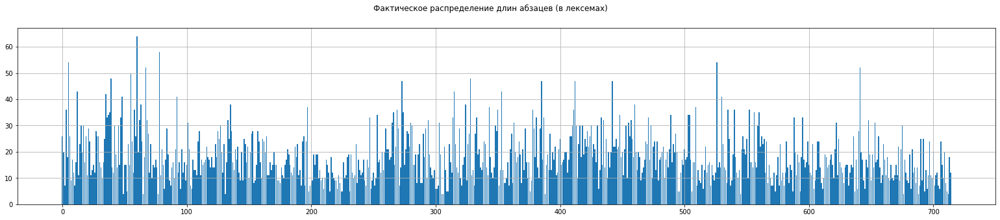

Collections Counter({15: 40, 14: 40, 12: 37, 16: 35, 17: 34, 10: 34, 11: 32, 9: 30, 13: 28, 20: 27, 18: 27, 7: 26, 19: 24, 21: 23, 23: 22, 8: 22, 24: 20, 5: 18, 22: 18, 30: 17, 6: 17, 26: 16, 25: 16, 33: 11, 4: 11, 28: 10, 36: 9, 29: 9, 27: 9, 31: 8, 32: 7, 34: 6, 35: 5, 38: 4, 47: 4, 43: 3, 41: 3, 37: 3, 54: 2, 48: 2, 52: 2, 42: 1, 50: 1, 64: 1, 58: 1})


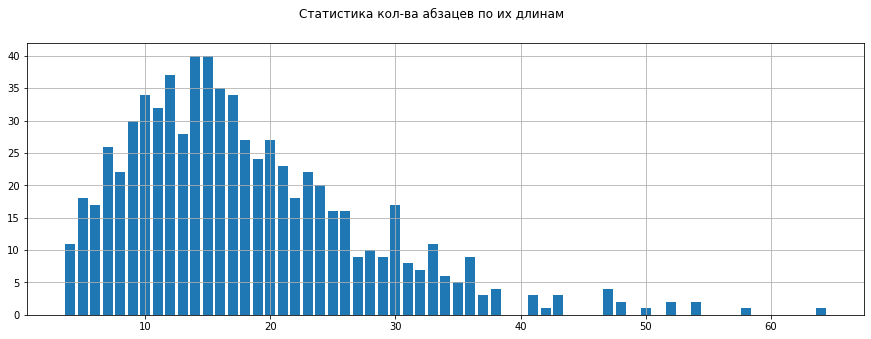

In [49]:
test_counter, test_count = draw_paragraphs_stat(paragraphs_test)

**Во скольких фразах встречается тот или  иной класс**

In [50]:
class_stat(paragraphs_test, tags_test)

Длина размеченной выборки: 715

Статистика по классам
Фраз без определительных структур: 290.0 - 40.56%
Фраз с категорией термин: 423.0 - 59.16%
Фраз с категорией связка: 421.0 - 58.88%
Фраз с категорией определение: 407.0 - 56.92%
Фраз с категорией расшифровка: 230.0 - 32.17%
Фраз с категорией дубль-термин: 87.0 - 12.17%
Фраз с категорией дубль-связка: 53.0 - 7.41%
Фраз с категорией дубль-определение: 57.0 - 7.97%
Фраз с категорией дубль-расшифровка: 8.0 - 1.12%


### The extraction of morphological features for lexemes from the array paragraphs_test.

In [51]:
morph_test = []
for i, elem in enumerate(paragraphs_test):
  row = []
  for j,lexem in enumerate(elem):
    row.append(morphyus(lexem))
  morph_test.append(row)
  print(f'{i+1} done {j+1}!')

Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

1 done 26!
2 done 20!
3 done 7!
4 done 36!
5 done 18!
6 done 54!
7 done 26!
8 done 9!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


9 done 17!
10 done 12!
11 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

12 done 16!
13 done 43!
14 done 11!
15 done 23!
16 done 30!
17 done 20!
18 done 30!
19 done 16!
20 done 26!
21 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


22 done 29!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

23 done 24!
24 done 11!
25 done 13!
26 done 15!
27 done 12!
28 done 28!
29 done 26!
30 done 26!
31 done 16!
32 done 14!
33 done 10!
34 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


35 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

36 done 42!
37 done 33!
38 done 34!
39 done 35!
40 done 48!
41 done 14!
42 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


43 done 30!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

44 done 19!
45 done 14!
46 done 30!
47 done 15!
48 done 33!
49 done 41!
50 done 4!
51 done 15!
52 done 15!
53 done 5!
54 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


55 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

56 done 50!
57 done 24!
58 done 12!
59 done 36!
60 done 26!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

61 done 64!
62 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

63 done 32!
64 done 38!
65 done 24!
66 done 4!
67 done 18!
68 done 52!
69 done 32!
70 done 27!
71 done 12!
72 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


73 done 10!
74 done 15!
75 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

76 done 17!
77 done 14!
78 done 4!
79 done 58!
80 done 11!
81 done 21!
82 done 15!
83 done 6!
84 done 17!
85 done 29!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


86 done 19!
87 done 9!
88 done 7!
89 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

90 done 16!
91 done 10!
92 done 21!
93 done 41!
94 done 12!
95 done 16!
96 done 6!
97 done 21!
98 done 12!
99 done 16!
100 done 9!
101 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

102 done 31!
103 done 21!
104 done 7!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

105 done 6!
106 done 17!
107 done 13!
108 done 13!
109 done 11!
110 done 24!
111 done 28!
112 done 11!
113 done 17!
114 done 15!
115 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


116 done 17!
117 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

118 done 18!
119 done 17!
120 done 14!
121 done 18!
122 done 14!
123 done 14!
124 done 23!
125 done 18!
126 done 28!
127 done 25!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


128 done 30!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

129 done 20!
130 done 12!
131 done 23!
132 done 4!
133 done 16!
134 done 32!
135 done 25!
136 done 38!
137 done 28!
138 done 16!
139 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.


140 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

141 done 17!
142 done 22!
143 done 12!
144 done 9!
145 done 20!
146 done 9!
147 done 25!
148 done 23!
149 done 16!
150 done 22!
151 done 10!
152 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

153 done 27!
154 done 28!
155 done 8!
156 done 9!
157 done 15!
158 done 28!
159 done 24!
160 done 16!
161 done 10!
162 done 25!
163 done 24!
164 done 20!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

165 done 26!
166 done 11!
167 done 11!
168 done 16!
169 done 13!
170 done 15!
171 done 20!
172 done 15!
173 done 15!
174 done 9!
175 done 9!
176 done 8!
177 done 14!
178 done 11!
179 done 10!
180 done 15!
181 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

182 done 21!
183 done 19!
184 done 15!
185 done 12!
186 done 11!
187 done 14!
188 done 22!
189 done 18!
190 done 23!
191 done 11!
192 done 13!
193 done 7!
194 done 24!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

195 done 26!
196 done 7!
197 done 24!
198 done 37!
199 done 5!
200 done 7!
201 done 8!
202 done 9!
203 done 19!
204 done 15!
205 done 19!
206 done 19!
207 done 10!
208 done 13!
209 done 9!
210 done 10!
211 done 6!
212 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

213 done 17!
214 done 15!
215 done 12!
216 done 5!
217 done 18!
218 done 12!
219 done 10!
220 done 9!
221 done 9!
222 done 6!
223 done 11!
224 done 8!
225 done 5!
226 done 5!
227 done 16!
228 done 10!
229 done 11!
230 done 18!
231 done 19!
232 done 5!
233 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

234 done 12!
235 done 10!
236 done 11!
237 done 23!
238 done 8!
239 done 17!
240 done 13!
241 done 11!
242 done 12!
243 done 17!
244 done 9!
245 done 7!
246 done 17!
247 done 14!
248 done 33!
249 done 6!
250 done 9!
251 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

252 done 7!
253 done 10!
254 done 34!
255 done 16!
256 done 17!
257 done 12!
258 done 20!
259 done 13!
260 done 20!
261 done 29!
262 done 21!
263 done 21!
264 done 17!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

265 done 18!
266 done 31!
267 done 35!
268 done 15!
269 done 22!
270 done 36!
271 done 29!
272 done 7!
273 done 14!
274 done 47!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

275 done 35!
276 done 15!
277 done 21!
278 done 28!
279 done 27!
280 done 22!
281 done 31!
282 done 30!
283 done 15!
284 done 15!
285 done 19!
286 done 8!
287 done 19!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

288 done 23!
289 done 8!
290 done 8!
291 done 27!
292 done 18!
293 done 29!
294 done 10!
295 done 32!
296 done 19!
297 done 14!
298 done 11!
299 done 10!
300 done 13!
301 done 6!
302 done 6!
303 done 7!
304 done 31!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

305 done 19!
306 done 4!
307 done 4!
308 done 22!
309 done 13!
310 done 5!
311 done 5!
312 done 23!
313 done 16!
314 done 12!
315 done 33!
316 done 43!
317 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

318 done 14!
319 done 12!
320 done 29!
321 done 10!
322 done 7!
323 done 15!
324 done 18!
325 done 38!
326 done 9!
327 done 23!
328 done 27!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

329 done 48!
330 done 11!
331 done 13!
332 done 7!
333 done 27!
334 done 33!
335 done 19!
336 done 21!
337 done 14!
338 done 13!
339 done 16!
340 done 24!
341 done 23!
342 done 14!
343 done 11!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

344 done 37!
345 done 18!
346 done 12!
347 done 10!
348 done 14!
349 done 30!
350 done 28!
351 done 36!
352 done 7!
353 done 13!
354 done 43!
355 done 13!
356 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

357 done 8!
358 done 10!
359 done 16!
360 done 7!
361 done 21!
362 done 27!
363 done 8!
364 done 31!
365 done 20!
366 done 16!
367 done 18!
368 done 24!
369 done 19!
370 done 8!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

371 done 21!
372 done 13!
373 done 29!
374 done 16!
375 done 10!
376 done 16!
377 done 5!
378 done 9!
379 done 36!
380 done 29!
381 done 18!
382 done 33!
383 done 14!
384 done 10!
385 done 29!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

386 done 47!
387 done 17!
388 done 33!
389 done 4!
390 done 15!
391 done 19!
392 done 13!
393 done 27!
394 done 13!
395 done 20!
396 done 17!
397 done 22!
398 done 11!
399 done 12!
400 done 21!
401 done 25!
402 done 15!
403 done 16!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

404 done 17!
405 done 20!
406 done 20!
407 done 12!
408 done 17!
409 done 26!
410 done 26!
411 done 30!
412 done 36!
413 done 47!
414 done 30!
415 done 10!
416 done 23!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

417 done 30!
418 done 18!
419 done 30!
420 done 19!
421 done 25!
422 done 22!
423 done 28!
424 done 22!
425 done 26!
426 done 30!
427 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

428 done 23!
429 done 21!
430 done 16!
431 done 30!
432 done 6!
433 done 13!
434 done 33!
435 done 15!
436 done 32!
437 done 14!
438 done 25!
439 done 10!
440 done 20!
441 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

442 done 20!
443 done 47!
444 done 22!
445 done 22!
446 done 25!
447 done 21!
448 done 22!
449 done 34!
450 done 18!
451 done 20!
452 done 11!
453 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

454 done 30!
455 done 10!
456 done 31!
457 done 26!
458 done 32!
459 done 25!
460 done 18!
461 done 38!
462 done 20!
463 done 13!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

464 done 20!
465 done 18!
466 done 9!
467 done 12!
468 done 14!
469 done 17!
470 done 24!
471 done 23!
472 done 33!
473 done 17!
474 done 30!
475 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

476 done 22!
477 done 24!
478 done 13!
479 done 24!
480 done 9!
481 done 17!
482 done 18!
483 done 20!
484 done 22!
485 done 10!
486 done 17!
487 done 20!
488 done 14!
489 done 21!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

490 done 34!
491 done 16!
492 done 23!
493 done 20!
494 done 27!
495 done 20!
496 done 5!
497 done 5!
498 done 12!
499 done 17!
500 done 15!
501 done 21!
502 done 17!
503 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

504 done 34!
505 done 34!
506 done 17!
507 done 5!
508 done 16!
509 done 16!
510 done 37!
511 done 7!
512 done 13!
513 done 9!
514 done 8!
515 done 15!
516 done 6!
517 done 13!
518 done 22!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

519 done 12!
520 done 15!
521 done 16!
522 done 7!
523 done 15!
524 done 11!
525 done 9!
526 done 12!
527 done 54!
528 done 14!
529 done 16!
530 done 14!
531 done 41!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

532 done 23!
533 done 14!
534 done 13!
535 done 8!
536 done 36!
537 done 25!
538 done 7!
539 done 9!
540 done 19!
541 done 36!
542 done 18!
543 done 12!
544 done 10!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

545 done 13!
546 done 4!
547 done 21!
548 done 26!
549 done 21!
550 done 19!
551 done 25!
552 done 10!
553 done 36!
554 done 16!
555 done 16!
556 done 14!
557 done 35!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

558 done 16!
559 done 14!
560 done 30!
561 done 35!
562 done 22!
563 done 26!
564 done 23!
565 done 25!
566 done 12!
567 done 24!
568 done 8!
569 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

570 done 10!
571 done 7!
572 done 7!
573 done 12!
574 done 5!
575 done 11!
576 done 18!
577 done 7!
578 done 23!
579 done 9!
580 done 12!
581 done 7!
582 done 12!
583 done 24!
584 done 14!
585 done 8!
586 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

587 done 13!
588 done 5!
589 done 33!
590 done 20!
591 done 11!
592 done 19!
593 done 16!
594 done 5!
595 done 18!
596 done 33!
597 done 17!
598 done 14!
599 done 16!
600 done 24!
601 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

602 done 12!
603 done 11!
604 done 23!
605 done 6!
606 done 9!
607 done 13!
608 done 24!
609 done 24!
610 done 14!
611 done 8!
612 done 6!
613 done 10!
614 done 19!
615 done 18!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

616 done 14!
617 done 15!
618 done 17!
619 done 19!
620 done 15!
621 done 10!
622 done 21!
623 done 31!
624 done 11!
625 done 25!
626 done 16!
627 done 14!
628 done 12!
629 done 8!
630 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

631 done 15!
632 done 15!
633 done 7!
634 done 12!
635 done 15!
636 done 14!
637 done 26!
638 done 5!
639 done 17!
640 done 6!
641 done 28!
642 done 52!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

643 done 20!
644 done 17!
645 done 9!
646 done 6!
647 done 17!
648 done 14!
649 done 32!
650 done 19!
651 done 9!
652 done 19!
653 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

654 done 31!
655 done 16!
656 done 17!
657 done 26!
658 done 14!
659 done 8!
660 done 11!
661 done 23!
662 done 17!
663 done 11!
664 done 18!
665 done 10!
666 done 9!
667 done 15!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

668 done 10!
669 done 9!
670 done 11!
671 done 15!
672 done 11!
673 done 22!
674 done 9!
675 done 21!
676 done 30!
677 done 4!
678 done 17!
679 done 12!
680 done 9!
681 done 8!
682 done 19!
683 done 6!
684 done 21!
685 done 12!
686 done 14!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

687 done 8!
688 done 14!
689 done 4!
690 done 7!
691 done 25!
692 done 9!
693 done 25!
694 done 5!
695 done 13!
696 done 6!
697 done 11!
698 done 24!
699 done 11!
700 done 10!
701 done 20!
702 done 7!
703 done 11!
704 done 12!


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

705 done 7!
706 done 6!
707 done 24!
708 done 15!
709 done 10!
710 done 20!
711 done 8!
712 done 5!
713 done 4!
714 done 18!
715 done 12!


In [52]:
len(morph_test)

715

In [53]:
for mrph in morph_test[665]:
  print(mrph)

['ru', 'true', 'сделать', 'VERB', 'None', 'perf', 'None', 'None', 'None', 'indc', 'plur', '1per', 'futr', 'tran', 'None', 'сделать', 'VERB', 'None', 'perf', 'None', 'None', 'incl', 'impr', 'sing', 'None', 'None', 'tran', 'None']
['ru', 'false', 'это', 'PRCL', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'это', 'NPRO', 'None', 'None', 'nomn', 'neut', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'это', 'NPRO', 'None', 'None', 'accs', 'neut', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'этот', 'ADJF', 'None', 'None', 'accs', 'neut', 'None', 'None', 'sing', 'None', 'None', 'None', 'None', 'этот', 'ADJF', 'None', 'None', 'nomn', 'neut', 'None', 'None', 'sing', 'None', 'None', 'None', 'None']
['ru', 'false', 'через', 'PREP', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None']
['en', 'false', '@import', 'NN', 'None', 'None', 'None', 'None', 'None', 'None', 'sing', 'None', 'None', 'None', 'Non

In [54]:
# Статистика по длинам морфологических описаний для лексем 
k_test = 0
word_test = ''
index_test = -1
a_test = set()
for i, elem in enumerate(morph_test):
  for j,lexem in enumerate(elem):
    dlina = len(lexem)
    a.add(dlina)
    if dlina>k_test:
      index_test = i
      k_test = dlina
      word_test = lexem[2]

print(f'Лексема с максимально длинным морфологическим описанием: max(lexemdescription) = {k_test}; word = {word_test}; index(предложения) = {index_test}')
print('Перечень всех вариантов для длины морфологического описания лексемы\n',sorted(a))

Лексема с максимально длинным морфологическим описанием: max(lexemdescription) = 665; word = так; index(предложения) = 385
Перечень всех вариантов для длины морфологического описания лексемы
 [15, 28, 41, 54, 67, 80, 93, 106, 119, 132, 145, 158, 171, 184, 197, 210, 223, 236, 249, 262, 275, 314, 327, 340, 353, 366, 379, 392, 418, 444, 470, 483, 496, 509, 548, 561, 626, 652, 665, 977]


In [55]:
# Составим массив нормальных форм слов параллельный массиву paragraphs_test
# Составим массив частей речи параллельный массиву paragraphs_test
# Составим массив падежей слов параллельный массиву paragraphs_test
# Составим массив языковой принадлежности слов параллельный массиву paragraphs_test
norms_test = []
pos_test = []
case_test = []
lang_test = []
for i, elem in enumerate(morph_test):
  norms_sentence = []
  pos_sentence = []
  case_sentence = []
  lang_sentence = []
  for j,lexem in enumerate(elem):
    len_descr = len(lexem)
    lang_sentence.append(lexem[0])
    norms_sentence.append(lexem[2])
    # собрать все части речи у лексемы
    pos = set()
    for k in range(3, len_descr,13):
      pos.add(lexem[k])
    pos_sentence.append("".join(list(pos)))
    # собрать у лексемы все падежи и 
    # признаки формы глагола, причастия, деепричастия - GRND, PRTS, PRTF, INFN, VERB
    case = set()
    if lexem[3] in ['GRND', 'PRTS', 'PRTF', 'INFN', 'VERB']:
      for k in range(4, len_descr,13):
        for m in range(k, k+11):
          case.add(lexem[m] if not lexem[m] in ['None'] else '')
    else: 
      for k in range(6, len_descr,13):
        case.add(lexem[k])
    case_sentence.append("".join(list(case)))
  norms_test.append(norms_sentence)  
  pos_test.append(pos_sentence)
  case_test.append(case_sentence)
  lang_test.append(lang_sentence)

In [56]:
for i, elem in enumerate(lang_test):
  print(i+1, elem)

1 ['ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'sign', 'sign', 'sign', 'sign', 'sign']
2 ['ru', 'ru', 'sign', 'ru', 'ru', 'sign', 'ru', 'en', 'sign', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'sign']
3 ['ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'sign']
4 ['ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'en', 'ru', 'ru', 'sign', 'ru', 'sign', 'ru', 'ru', 'ru', 'sign', 'ru', 'sign', 'ru', 'en', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
5 ['ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign']
6 ['ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'sign', 'ru', 'ru', 'ru', 'ru', 'ru', 'en', 'sign', 'ru', 'sign', 'sign', 'ru', 'ru', 'ru', 'ru', 'en', 'ru', 'ru', 'ru'

In [57]:
for i, elem in enumerate(norms_test):
  print(i+1, elem)

1 ['удобный', 'поиск', '—', 'возможность', 'использование', 'эффективный', 'система', 'поиск', '(', 'полнотекстовый', 'поиск', ',', 'одновременный', 'поиск', 'в', 'несколько', 'словарь', ',', 'высокий', 'скорость', 'поиск', ')', '[', '26', ']', '.']
2 ['синтаксический', 'анализатор', '(', 'жарг.', 'парсер', '←', 'англ.', 'parser', ')', '—', 'это', 'программа', 'или', 'часть', 'программа', ',', 'выполнять', 'синтаксический', 'анализ', '.']
3 ['свойство', '—', 'необходимый', 'условие', 'принадлежность', 'класс', '.']
4 ['парадигма', 'программирование', 'как', 'исходный', 'концептуальный', 'схема', 'постановка', 'проблема', 'и', 'они', 'решение', 'являться', 'инструмент', 'грамматического', 'описание', 'факт', ',', 'событие', ',', 'явление', 'и', 'процесс', ',', 'возможно', ',', 'не', 'существующих', 'одновременно', ',', 'но', 'интуитивно', 'объединять', 'в', 'общий', 'понятие', '.']
5 ['ветвление', '—', 'однократный', 'выполнение', 'один', 'из', 'два', 'или', 'более', 'операция', ',', 'в

In [58]:
for i, elem in enumerate(pos_test):
  print(i+1, elem)

1 ['ADJF', 'NOUN', 'PNCT', 'NOUN', 'NOUN', 'ADJF', 'NOUN', 'NOUN', 'PNCT', 'ADJF', 'NOUN', 'PNCT', 'ADJF', 'NOUN', 'NOUNPREP', 'NUMR', 'NOUN', 'PNCT', 'ADJF', 'NOUN', 'NOUN', 'PNCT', 'PNCT', 'NUMB', 'PNCT', 'PNCT']
2 ['ADJF', 'NOUN', 'PNCT', 'None', 'NOUN', 'NN', 'None', 'NN', 'PNCT', 'PNCT', 'PRCLNPROADJF', 'NOUN', 'CONJ', 'NOUN', 'NOUN', 'PNCT', 'PRTF', 'ADJF', 'NOUN', 'PNCT']
3 ['NOUN', 'PNCT', 'ADJF', 'NOUN', 'NOUN', 'NOUN', 'PNCT']
4 ['NOUN', 'NOUN', 'PRCLADVBCONJ', 'ADJF', 'ADJF', 'NOUN', 'NOUN', 'NOUN', 'PRCLINTJNOUNCONJ', 'NPROADJF', 'NOUN', 'VERB', 'NOUN', 'NN', 'NOUN', 'NOUN', 'PNCT', 'NOUN', 'PNCT', 'NOUN', 'PRCLINTJNOUNCONJ', 'NOUN', 'PNCT', 'ADJSADVBCONJ', 'PNCT', 'PRCL', 'NN', 'ADJSADVB', 'PNCT', 'INTJCONJ', 'ADJSADVB', 'PRTF', 'NOUNPREP', 'ADJF', 'NOUN', 'PNCT']
5 ['NOUN', 'PNCT', 'ADJF', 'NOUN', 'ADJF', 'NOUNPREP', 'NUMR', 'CONJ', 'ADVB', 'NOUN', 'PNCT', 'NOUNPREP', 'NOUN', 'PREP', 'NOUN', 'PRTFADJF', 'NOUN', 'PNCT']
6 ['ADJF', 'NOUN', 'VERB', 'NOUNPREP', 'NOUNADJF', 'P

In [59]:
for i, elem in enumerate(case_test):
  print(i+1, elem)

1 ['nomnaccs', 'nomnaccs', 'None', 'nomnaccs', 'gentnomnaccs', 'datvgentloctablt', 'gentnomnaccs', 'gent', 'None', 'nomnaccs', 'nomnaccs', 'None', 'nomnaccs', 'nomnaccs', 'datvgentNonenomnabltloctaccs', 'loctgentaccs', 'loct', 'None', 'nomn', 'nomnaccs', 'gent', 'None', 'None', 'None', 'None', 'None']
2 ['nomnaccs', 'nomnaccs', 'None', 'None', 'nomnaccs', 'None', 'None', 'None', 'None', 'None', 'nomnNoneaccs', 'nomn', 'None', 'nomnaccs', 'gentnomnaccs', 'None', 'actvtrannomnfemnpressingimpf', 'nomnaccs', 'nomnaccs', 'None']
3 ['nomnaccs', 'None', 'nomnaccs', 'nomnaccs', 'datvgentnomnloctaccs', 'datv', 'None']
4 ['nomn', 'gentnomnaccs', 'None', 'nomn', 'nomn', 'nomn', 'gentnomnaccs', 'gent', 'datvgentNonenomnabltloctaccs', 'datvgentnomnabltloctaccs', 'gentnomnaccs', 'intr3perindcpressingimpf', 'ablt', 'None', 'gentnomnaccs', 'gent', 'None', 'gent', 'None', 'gent', 'datvgentNonenomnabltloctaccs', 'gent', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'None', 'animgenttra

# **Step 1. Text Classification** on the Parts of Speech

## Preparing a dataset

Объединим обучающий и тестовый массивы, чтобы воспользоваться общим токенизатором для нескольких входов с данными о pos, case, и т.д.

In [60]:
full_pcln = pos_train + pos_test + case_train + case_test + lang_train + lang_test + norms_train + norms_test
full_semantics = semantics_train + semantics_test
print(len(full_pcln))
print(len(full_semantics))

14300
3575


In [61]:
full_pcln_together = [' '.join(sequence) for sequence in full_pcln]

In [62]:
full_pcln_together[max_paragraph_len_ind]

'NOUN VERB NOUN NOUNPREP ADJF NOUN NOUN PNCT PRCLNPROADJF PNCT NOUN NOUNADJF PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT NOUNADJF NOUN PRCLINTJNOUNCONJ NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT ADJF NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT PRCLINTJCONJ PRCL NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT NOUN PNCT PNCT'

In [63]:
full_semantics[max_paragraph_len_ind]

[1]

In [64]:
num_words = 9000
sent_len = max_paragraph_len 
tokenizer = Tokenizer(num_words, filters=' \t\n', oov_token='<UNK>')

In [65]:
tokenizer.fit_on_texts(full_pcln_together)

In [66]:
# реальная длина словаря. Сравниваем со значением num_words
len(tokenizer.index_word)

8899

**Токенизируем входные данные.** (Выходные данные у нас изначально представляют собой токены)

In [67]:
X = tokenizer.texts_to_sequences(full_pcln_together)

In [68]:
Y = np.array(full_semantics)

**Теперь разобъём X на два входных массива с данными о pos, cases, lang и norms размерностью paragraphs_amount + test_paragraphs_amount каждый**

In [69]:
L = paragraphs_amount + test_paragraphs_amount
M = 2*L
N = M+L
X_pos = X[:L]
X_case = X[L:M]
X_lang = X[M:N]
X_norms = X[N:]

**Проверка входящих и исходящих массивов на соответствие их размерностей** 

(для выявления факта порчи данных функцией Tokenizer)

In [70]:
len(X_pos)==len(Y)

True

In [71]:
len(X_case)==len(Y)

True

In [72]:
len(X_lang)==len(Y)

True

In [73]:
len(X_norms)==len(Y)

True

In [74]:
print(Y)

[[1]
 [1]
 [1]
 ...
 [0]
 [0]
 [0]]


In [75]:
print(X_pos[0])

[8, 4, 6, 4, 4, 6, 18, 8, 16, 4, 4, 4, 6, 113, 150, 16, 6, 77, 16, 40, 4, 23, 31, 4, 6]


In [76]:
print(X_case[0])

[7, 7, 3, 17, 13, 3, 12, 142, 33, 17, 13, 13, 3, 21, 151, 33, 3, 21, 58, 19, 17, 12, 378, 7, 3]


In [77]:
print(X_lang[0])

[2, 2, 5, 2, 2, 5, 2, 2, 2, 2, 2, 2, 5, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 2, 5]


In [78]:
print(X_norms[0])

[3040, 124, 25, 421, 124, 9, 20, 49, 708, 1279, 273, 270, 9, 115, 152, 3041, 9, 75, 289, 218, 455, 24, 1280, 285, 14]


**Выравнивание массивов до максимального размера абзаца**

In [79]:
X_pos = pad_sequences(X_pos, sent_len, padding='post', truncating='post') # заполнение в конце и обрезка с конца предложения

In [80]:
X_case = pad_sequences(X_case, sent_len, padding='post', truncating='post') # заполнение в конце и обрезка с конца предложения

In [81]:
X_lang = pad_sequences(X_lang, sent_len, padding='post', truncating='post')

In [82]:
X_norms = pad_sequences(X_norms, sent_len, padding='post', truncating='post')

In [83]:
X_pos.shape

(3575, 128)

In [84]:
X_case.shape

(3575, 128)

In [85]:
X_lang.shape

(3575, 128)

In [86]:
X_norms.shape

(3575, 128)

In [87]:
Y.shape

(3575, 1)

In [88]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html
Xtrain_pos, Xtest_pos, Ytrain, Ytest = train_test_split(X_pos, Y, train_size=train_paragraphs_len, shuffle=False) # Не перемешиваем данные и берём целую часть на тренировочную выборку

In [89]:
Xtrain_case = X_case[:train_paragraphs_len]
Xtest_case = X_case[train_paragraphs_len:]

Xtrain_lang = X_lang[:train_paragraphs_len]
Xtest_lang = X_lang[train_paragraphs_len:]

Xtrain_norms = X_norms[:train_paragraphs_len]
Xtest_norms = X_norms[train_paragraphs_len:]

### Total for training and testing samples we have:

In [90]:
print('Xtrain_pos.shape=',Xtrain_pos.shape)
print('Xtest_pos.shape=',Xtest_pos.shape)
print('Xtrain_case.shape=',Xtrain_case.shape)
print('Xtest_case.shape=',Xtest_case.shape)

print('Xtrain_lang.shape=',Xtrain_lang.shape)
print('Xtest_lang.shape=',Xtest_lang.shape)
print('Xtrain_norms.shape=',Xtrain_norms.shape)
print('Xtest_norms.shape=',Xtest_norms.shape)

print('Ytrain.shape=',Ytrain.shape)
print('Ytest.shape=',Ytest.shape)

Xtrain_pos.shape= (2860, 128)
Xtest_pos.shape= (715, 128)
Xtrain_case.shape= (2860, 128)
Xtest_case.shape= (715, 128)
Xtrain_lang.shape= (2860, 128)
Xtest_lang.shape= (715, 128)
Xtrain_norms.shape= (2860, 128)
Xtest_norms.shape= (715, 128)
Ytrain.shape= (2860, 1)
Ytest.shape= (715, 1)


In [91]:
Xtrain_pos[1]

array([ 11,   4,   6,  56,   4,   4,   6,   4,   4,   8,   4,   8,   4,
         6,   6,  37,   8,  60,  48,   6,  18,   8,   4,   4,  16,   4,
         6,   4,   6,   6,   4,  87,  30,  60,   6,  89,   6,  31, 129,
         4,   8,   4,   6,  16,  30,  18,   4,  11,   4,   6,  89,   6,
        31, 129,   4,   4,   6,  16,  30,  18,   4,   6,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0], dtype=int32)

In [92]:
Xtrain_case[1]

array([  3,   7,   3,  21,  17,  13,   3,   7,  13,  26, 108,  91,  13,
         3,   3,   3, 142,   3,   7,   3,  12,  22,  83,  13,  67,  32,
         3,  13,   3,   3,  32,   3,  86,   3,   3, 192,   3, 437, 100,
        22,  27,  15,   3,  67,  86,  73,  32,   3,  19,   3, 192,   3,
       192, 100,  22,  32,   3,  67,  86,  12,   7,   3,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0], dtype=int32)

In [93]:
Xtrain_lang[1]

array([10,  2,  5,  2,  2,  2,  5,  2,  2,  2,  2,  2,  2,  5,  5,  2,  2,
        2,  2,  5,  2,  2,  2,  2,  2,  2,  5,  2,  5,  5,  2,  2,  2,  2,
        5,  2,  5,  2,  2,  2,  2,  2,  5,  2,  2,  2,  2, 10,  2,  5,  2,
        5,  2,  2,  2,  2,  5,  2,  2,  2,  2,  5,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0], dtype=int32)

In [94]:
Xtrain_norms[1]

array([4402,  124,   25,   45,  421,  124,   29,  439,  612,  221,  103,
        647,  145,   28,    9,   39,   49, 1281,  250,   47,   20,  221,
        103,  145, 1282,  428,   29,  389,   28,   88,  428,  186,  568,
       2418,   88,  195,    9, 1089,  130,  290,  594,  428,    9,   97,
       2419,   90,  533, 4403,  428,   88,  195,    9,  390,  130,  290,
        428,    9,   97, 1282,   20,  533,   14,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0], dtype=int32)

In [95]:
Ytrain[1]

array([1])

## Recurrent neural network model (LSTM)

In [96]:
embedding_size = 100

# параллельная архитектура
input_pos = Input((sent_len,))
x_pos = Embedding(num_words, embedding_size)(input_pos)
x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
x_pos = BatchNormalization()(x_pos)
x_pos = Activation('relu')(x_pos)
x_pos = Dropout(0.2)(x_pos)

input_case = Input((sent_len,))
x_case = Embedding(num_words, embedding_size)(input_case)
x_case = Conv1D(64, 3, padding='same', name='input2_conv1')(x_case)
x_case = BatchNormalization()(x_case)
x_case = Activation('relu')(x_case)
x_case = Dropout(0.2)(x_case)

input_lang = Input((sent_len,))
x_lang = Embedding(num_words, embedding_size)(input_lang)
x_lang = Conv1D(64, 3, padding='same', name='input3_conv1')(x_lang)
x_lang = BatchNormalization()(x_lang)
x_lang = Activation('relu')(x_lang)
x_lang = Dropout(0.2)(x_lang)

input_norms = Input((sent_len,))
x_norms = Embedding(num_words, embedding_size)(input_norms)
x_norms = Conv1D(64, 3, padding='same', name='input4_conv1')(x_norms)
x_norms = BatchNormalization()(x_norms)
x_norms = Activation('relu')(x_norms)
x_norms = Dropout(0.2)(x_norms)

x = concatenate([x_pos, x_case, x_lang, x_norms])

# последовательная архитектура
# x_pos = Embedding(num_words, embedding_size)(input_pos)
# x_pos = BatchNormalization()(x_pos)
# x_pos = LSTM(128, return_sequences=True)(x_pos)
# x_pos = Dropout(0.2)(x_pos)

# input_case = Input((sent_len,))
# x_case = Embedding(num_words, embedding_size)(input_case)

# input_lang = Input((sent_len,))
# x_lang = Embedding(num_words, embedding_size)(input_lang)

# input_norms = Input((sent_len,))
# x_norms = Embedding(num_words, embedding_size)(input_norms)


# x = concatenate([x_pos, x_case])
# x = BatchNormalization()(x)
# x = LSTM(128, return_sequences=True)(x)
# x = Dropout(0.2)(x)

# x = concatenate([x, x_lang])
# x = BatchNormalization()(x)
# x = LSTM(128, return_sequences=True)(x)
# x = Dropout(0.2)(x)

# x = concatenate([x, x_norms])
# x = BatchNormalization()(x)
x = LSTM(128, return_sequences=True)(x)
x = SpatialDropout1D(0.2)(x)
x = Flatten()(x)
# x = BatchNormalization()(x)
x = Dense(100, activation='relu')(x)
x = Dropout(0.2)(x)
output = Dense(1, activation='sigmoid')(x)

modelLSTM = Model(inputs=[input_pos, input_case, input_lang, input_norms], outputs=output)

#  'adam' 'rmsprop'   Adam
modelLSTM.compile(loss='binary_crossentropy', metrics=[AUC(num_thresholds=150)], optimizer=RMSprop(lr=1e-4)) #

modelLSTM.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128)]        0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 128)]        0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 128)]        0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 128)]        0                                            
_______________________________________________________________________________________

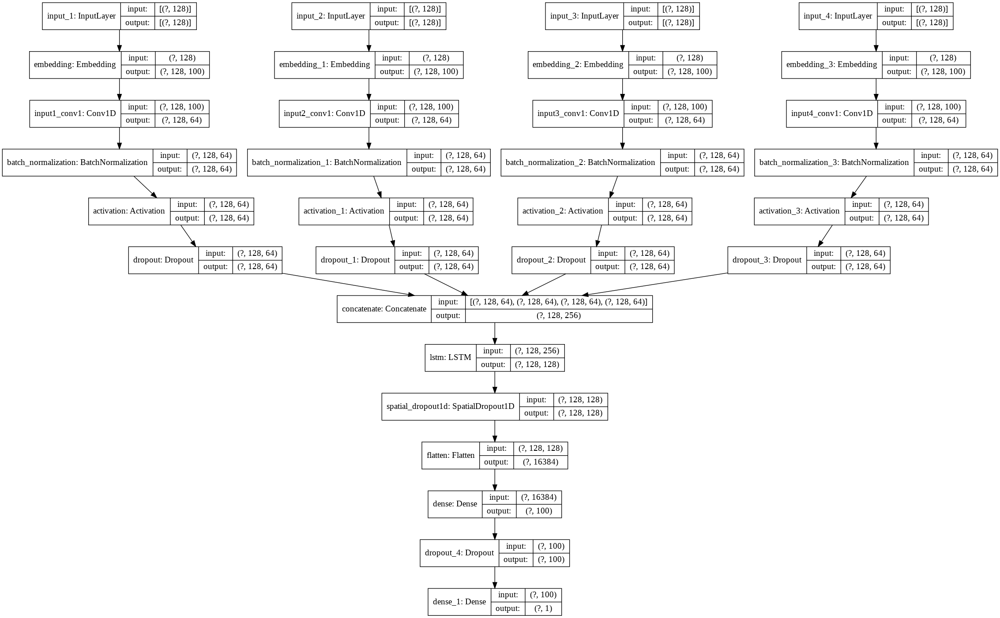

In [97]:
plot_model(modelLSTM, show_shapes=True)

In [98]:
historyLSTM = modelLSTM.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                            batch_size=96, epochs=30, 
                            validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest))

Epoch 1/30
30/30 [==============================] - 2s 52ms/step - loss: 0.6187 - auc: 0.7127 - val_loss: 0.6893 - val_auc: 0.8259
Epoch 2/30
30/30 [==============================] - 1s 30ms/step - loss: 0.4590 - auc: 0.8671 - val_loss: 0.6636 - val_auc: 0.9351
Epoch 3/30
30/30 [==============================] - 1s 29ms/step - loss: 0.3775 - auc: 0.9109 - val_loss: 0.6540 - val_auc: 0.9541
Epoch 4/30
30/30 [==============================] - 1s 29ms/step - loss: 0.3341 - auc: 0.9311 - val_loss: 0.6409 - val_auc: 0.9682
Epoch 5/30
30/30 [==============================] - 1s 30ms/step - loss: 0.2957 - auc: 0.9459 - val_loss: 0.6173 - val_auc: 0.9726
Epoch 6/30
30/30 [==============================] - 1s 30ms/step - loss: 0.2504 - auc: 0.9612 - val_loss: 0.6001 - val_auc: 0.9725
Epoch 7/30
30/30 [==============================] - 1s 29ms/step - loss: 0.2233 - auc: 0.9689 - val_loss: 0.5784 - val_auc: 0.9802
Epoch 8/30
30/30 [==============================] - 1s 29ms/step - loss: 0.1948 - a

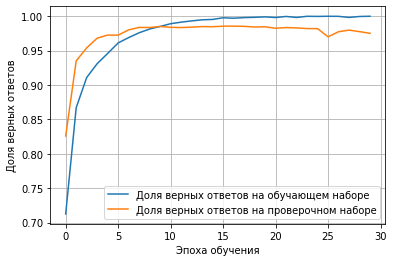

In [99]:
# график прогрессии обучения нейросети в Matplotlib
plt.plot(historyLSTM.history['auc'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyLSTM.history['val_auc'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend(loc='best')
plt.show()

**Проверка качества работы нейронной сети**

In [100]:
Y_hat = modelLSTM.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])
Y_hat.shape, Ytest.shape

((715, 1), (715, 1))

In [101]:
y_coincidence = 0
y_unrecognized = 0
y_contrived = 0
for i, pred in enumerate(Y_hat):
  b = Ytest[i][0]
  a = round(pred[0])
  print(a, b, paragraphs_test[i])
  if a+b>1.5:
    y_coincidence += 1
  elif a+b<0.5:
    y_coincidence += 1
  else:
    if a>0.5:
      y_contrived += 1
    else:
      y_unrecognized += 1

print(f"\nРаспознано: {y_coincidence}; Нераспознано: {y_unrecognized}; Надумано: {y_contrived}")  

1.0 1 ['Удобный', 'поиск', '—', 'возможность', 'использования', 'эффективной', 'системы', 'поиска', '(', 'полнотекстовый', 'поиск', ',', 'одновременный', 'поиск', 'в', 'нескольких', 'словарях', ',', 'высокая', 'скорость', 'поиска', ')', '[', '26', ']', '.']
1.0 1 ['Синтаксический', 'анализатор', '(', 'жарг.', 'парсер', '←', 'англ.', 'parser', ')', '—', 'это', 'программа', 'или', 'часть', 'программы', ',', 'выполняющая', 'синтаксический', 'анализ', '.']
1.0 1 ['Свойство', '—', 'необходимое', 'условие', 'принадлежности', 'классу', '.']
1.0 1 ['Парадигма', 'программирования', 'как', 'исходная', 'концептуальная', 'схема', 'постановки', 'проблем', 'и', 'их', 'решения', 'является', 'инструментом', 'грамматического', 'описания', 'фактов', ',', 'событий', ',', 'явлений', 'и', 'процессов', ',', 'возможно', ',', 'не', 'существующих', 'одновременно', ',', 'но', 'интуитивно', 'объединяемых', 'в', 'общее', 'понятие', '.']
1.0 1 ['Ветвление', '—', 'однократное', 'выполнение', 'одной', 'из', 'двух', 

ROC-кривая (англ. receiver operating characteristic, рабочая характеристика приёмника) — график, позволяющий оценить качество бинарной классификации, отображает соотношение между долей объектов от общего количества носителей признака, верно классифицированных как несущие признак (англ. true positive rate, TPR, называемой чувствительностью алгоритма классификации), и долей объектов от общего количества объектов, не несущих признака, ошибочно классифицированных как несущие признак (англ. false positive rate, FPR, величина 1-FPR называется специфичностью алгоритма классификации) при варьировании порога решающего правила.

https://ru.wikipedia.org/wiki/ROC-%D0%BA%D1%80%D0%B8%D0%B2%D0%B0%D1%8F

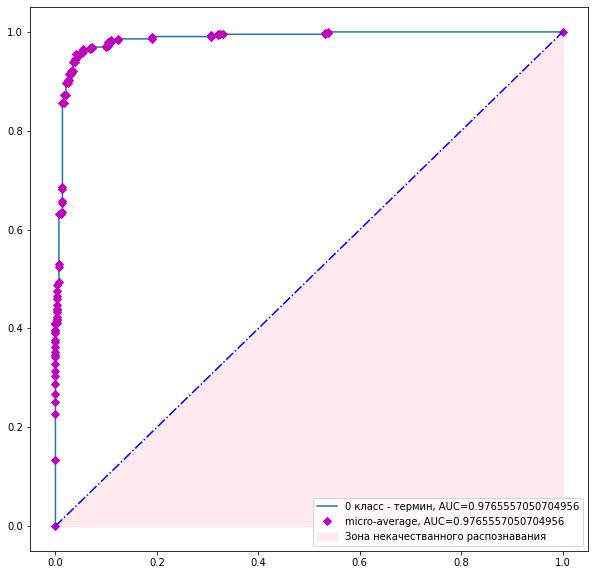

In [102]:
plt.figure(figsize=(10,10))


num_classes = 1 #узнаем, сколько всего классов
for i in range(num_classes): #проходимся по всем классам
  fpr, tpr, thresholds = roc_curve(Ytest[:, i], Y_hat[:, i]) #получаем roc-кривую для очередного класса
  plt.plot(fpr, tpr, label='{} класс - {}, AUC={}'.format(i, dic_color[i], AUC()(Ytest[:, i], Y_hat[:, i]))) #отрисовываем кривую и подписываем ее площадь

avg_fpr, avg_tpr, thresholds = roc_curve(Ytest.flatten(), Y_hat.flatten()) #получаем micro-average (общую) кривую roc
plt.plot(avg_fpr, avg_tpr, 'mD',label='micro-average, AUC={}'.format(AUC()(Ytest, Y_hat)))#отрисовываем кривую и подписываем ее площадь
plt.plot([0,1], [0,1], 'b-.') #обозначим границу качественной работы нейросети
plt.fill_between([0,1], [0,1], label='Зона некачестванного распознавания', color='pink', alpha=0.3) #обозначим границу некачественной работы нейросети
plt.legend()

## Fetching arrays for the next step in extracting definitional structures in phrases with expected semantic status

In [103]:
pos_train_2 = []
case_train_2 = []
lang_train_2 = []
norms_train_2 = []
tags_train_2 = []
paragraphs_train_2 = []
for i, elem in enumerate(semantics_train):
  if elem[0]==1:
    pos_train_2.append(pos_train[i])
    case_train_2.append(case_train[i])
    lang_train_2.append(lang_train[i])
    norms_train_2.append(norms_train[i])
    paragraphs_train_2.append(paragraphs_train[i])
    tags_train_2.append(tags_train[i])

print(f'Обучающие массивы (с размерностью {train_yes})', 
      len(pos_train_2), len(case_train_2), 
      len(lang_train_2), len(norms_train_2), 
      len(tags_train_2), len(paragraphs_train_2))


Обучающие массивы (с размерностью 1589) 1589 1589 1589 1589 1589 1589


In [104]:
pos_test_2 = []
case_test_2 = []
lang_test_2 = []
norms_test_2 = []
tags_test_2 = []
paragraphs_test_2 = []
for i, elem in enumerate(Y_hat):
  if round(elem[0])>0:
    pos_test_2.append(pos_test[i])
    case_test_2.append(case_test[i])
    lang_test_2.append(lang_test[i])
    norms_test_2.append(norms_test[i])
    paragraphs_test_2.append(paragraphs_test[i])
    tags_test_2.append(tags_test[i])

print(f'Тренировочные массивы (с размерностью {test_yes}):',
      len(pos_test_2), len(case_test_2), 
      len(lang_test_2), len(norms_test_2), 
      len(tags_test_2), len(paragraphs_test_2))


Тренировочные массивы (с размерностью 425): 424 424 424 424 424 424


# **Step 2. Segmentation of text** on the Parts of Speech

## Preparing a dataset

Объединим обучающий и тестовый массивы, чтобы воспользоваться общим токенизатором.

In [105]:
# Здесь для обучения оставим обучающую выборку в полном объёме, 
# а из тестовой возьмём только то, что выбрала нейронка на предыдущем шаге
all_pcln = pos_train + pos_test_2 + case_train + case_test_2 + \
           lang_train + lang_test_2 + norms_train + norms_test_2 
all_tags = tags_train + tags_test_2
all_paragraphs = paragraphs_train + paragraphs_test_2
train_test_paragraphs_amount_2 = len(all_paragraphs)

print(len(all_pcln))
print(len(all_tags))
print(len(all_paragraphs))

print(f'train_test_paragraphs_amount_2 = {train_test_paragraphs_amount_2}')

13136
3284
3284
train_test_paragraphs_amount_2 = 3284


In [106]:
all_pcln_together = [' '.join(sequence) for sequence in all_pcln]

In [107]:
len(all_pcln_together)

13136

In [108]:
all_pcln_together[0]

'ADJF NOUN PNCT NOUN NOUN PNCT NOUNPREP ADJF VERB NOUN NOUN NOUN PNCT PRCLCONJADJF INTJINFNVERB VERB PNCT PRCLNPROADVBCONJ VERB NPRO NOUN PRCLINTJNOUNCONJ PRTF NOUN PNCT'

In [109]:
all_tags_together = [' '.join(tag) for tag in all_tags]

In [110]:
all_tags_together[0]

'термин термин связка определение определение o расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка расшифровка o'

In [111]:
# Токенайзер для текстов приготовлен на предыдущем шаге

# num_words = 9000
# sent_len = max_paragraph_len 
# tokenizer = Tokenizer(num_words, filters=' \t\n', oov_token='<UNK>')

In [112]:
# tokenizer.fit_on_texts(all_paragraphs_together)

In [113]:
# реальная длина словаря. Сравниваем со значением num_words
# len(tokenizer.index_word)

In [114]:
# Токенайзер для категорий определительной структуры ещё не готов

tag_tokenizer = Tokenizer(filters=' ') # colors_count - количество категорий - лучше не указывать, чтобы не потерять категории. Все они автоматически подцедпляются под своими индексами

In [115]:
tag_tokenizer.fit_on_texts(all_tags_together)

In [116]:
tag_tokenizer.index_word # Здесь обращаем внимание, что фактическая нумерация индексов смещена на единицу по сравнению с массивом color_dic

{1: 'o',
 2: 'расшифровка',
 3: 'определение',
 4: 'термин',
 5: 'связка',
 6: 'дубль-определение',
 7: 'дубль-термин',
 8: 'дубль-связка',
 9: 'дубль-расшифровка'}

In [117]:
tag_tokenizer.word_index

{'o': 1,
 'дубль-определение': 6,
 'дубль-расшифровка': 9,
 'дубль-связка': 8,
 'дубль-термин': 7,
 'определение': 3,
 'расшифровка': 2,
 'связка': 5,
 'термин': 4}

In [118]:
len(tag_tokenizer.index_word) # эта величина равна colors_count

9

In [119]:
# prepare color dictionary
tag_tokenizer_dic_color = {}
tag_tokenizer_dic_color[1] = color.END
for i in range(2,10):
  tag_tokenizer_dic_color[i] = dic_colored_items[color_dic[tag_tokenizer.index_word[i]]]
tag_tokenizer_dic_color

{1: '\x1b',
 2: '\x1b\x1b',
 3: '\x1b\x1b',
 4: '\x1b\x1b',
 5: '\x1b\x1b',
 6: '\x1b\x1b',
 7: '\x1b\x1b',
 8: '\x1b\x1b',
 9: '\x1b\x1b'}

**Токенизируем входные данные.** (Выходные данные у нас изначально представляют собой токены)

In [120]:
X_2 = tokenizer.texts_to_sequences(all_pcln_together)

In [121]:
Y_2 = tag_tokenizer.texts_to_sequences(all_tags_together)

**Теперь разобъём X на два входных массива с данными о pos и cases размерностью paragraphs_amount + test_paragraphs_amount каждый**

In [122]:
L = train_test_paragraphs_amount_2
M = 2*L
N = M+L
X_2_pos = X_2[:L]
X_2_case = X_2[L:M]
X_2_lang = X_2[M:N]
X_2_norms = X_2[N:]

**Проверка входящих и исходящих массивов на соответствие их размерностей** 

(для выявления факта порчи данных функцией Tokenizer)

In [123]:
len(X_2_pos)==len(Y_2)

True

In [124]:
len(X_2_case)==len(Y_2)

True

In [125]:
len(X_2_lang)==len(Y_2)

True

In [126]:
len(X_2_norms)==len(Y_2)

True

In [127]:
len(Y_2)

3284

In [128]:
# Проверка на согласованность входных и выходных данных
for i, elem in enumerate(X_2_pos):
  if len(Y_2[i]) != len(X_2_pos[i]):
    print('X_2_pos[{}] ='.format(i),X_2_pos[i])
    print('Y_2[{}] ='.format(i),Y_2[i])
    # Если все массивы равны, то здесь  ничего не должно печататься
  else:
    pass
    # print('len(X_2_pos[{}]) ='.format(i),len(Y_2[i]))
  if len(Y_2[i]) != len(X_2_case[i]):
    print('X_2_case[{}] ='.format(i),X_2_case[i])
    print('Y_2[{}] ='.format(i),Y_2[i])
    # Если все массивы равны, то здесь  ничего не должно печататься
  else:
    pass
    # print('len(X_2_case[{}]) ='.format(i),len(Y_2[i]))
  if len(Y_2[i]) != len(X_2_lang[i]):
    print('X_2_lang[{}] ='.format(i),X_2_lang[i])
    print('Y_2[{}] ='.format(i),Y_2[i])
    # Если все массивы равны, то здесь  ничего не должно печататься
  else:
    pass
    # print('len(X_2_lang[{}]) ='.format(i),len(Y_2[i]))
  if len(Y_2[i]) != len(X_2_norms[i]):
    print('X_2_norms[{}] ='.format(i),X_2_norms[i])
    print('Y_2[{}] ='.format(i),Y_2[i])
    # Если все массивы равны, то здесь  ничего не должно печататься
  else:
    pass
    # print('len(X_2_norms[{}]) ='.format(i),len(Y_2[i]))

**Выравнивание массивов до максимального размера абзаца**

In [129]:
X_2_pos = pad_sequences(X_2_pos, sent_len, padding='post', truncating='post') # заполнение в конце и обрезка с конца предложения

In [130]:
X_2_case = pad_sequences(X_2_case, sent_len, padding='post', truncating='post') # заполнение в конце и обрезка с конца предложения

In [131]:
X_2_lang = pad_sequences(X_2_lang, sent_len, padding='post', truncating='post')

In [132]:
X_2_norms = pad_sequences(X_2_norms, sent_len, padding='post', truncating='post')

In [133]:
X_2_pos.shape

(3284, 128)

In [134]:
X_2_case.shape

(3284, 128)

In [135]:
X_2_lang.shape

(3284, 128)

In [136]:
X_2_norms.shape

(3284, 128)

In [137]:
Y_2 = pad_sequences(Y_2, sent_len, value=1, padding='post', truncating='post') # заполнение в конце и обрезка с конца предложения

In [138]:
Y_2.shape

(3284, 128)

In [139]:
Y_2 = to_categorical(Y_2, colors_count+1)  # см. лекцию "Занятие № 6 Углубленный курс по текстам" https://youtu.be/Nfw7ZY-WzS8?t=1533
Y_2.shape

(3284, 128, 10)

In [140]:
Y_2 = Y_2[:, :, 1:]  # см. лекцию "Занятие № 6 Углубленный курс по текстам" https://youtu.be/Nfw7ZY-WzS8?t=1533
Y_2.shape

(3284, 128, 9)

In [141]:
print(colorize_the_text(all_paragraphs[13], Y_2[13], 0))

 hash ( x ) - Возвращает хеш указанного объекта .


Далее заменяем массивы из первого этапа по классификации предложений

In [142]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html
Xtrain_pos, Xtest_pos, Ytrain, Ytest = train_test_split(X_2_pos, Y_2, train_size=train_paragraphs_len, shuffle=False) # Не перемешиваем данные и берём целую часть на тренировочную выборку

In [143]:
Xtrain_case = X_2_case[:train_paragraphs_len]
Xtest_case = X_2_case[train_paragraphs_len:]

Xtrain_lang = X_2_lang[:train_paragraphs_len]
Xtest_lang = X_2_lang[train_paragraphs_len:]

Xtrain_norms = X_2_norms[:train_paragraphs_len]
Xtest_norms = X_2_norms[train_paragraphs_len:]

### Total for training and testing samples we have:

In [144]:
# Новые размерности уже "только" для массивов с определительными структурами, 
# с учетом вычисленных на этапе классификации предложений

print('Xtrain_pos.shape=',Xtrain_pos.shape)
print('Xtest_pos.shape=',Xtest_pos.shape)
print('Xtrain_case.shape=',Xtrain_case.shape)
print('Xtest_case.shape=',Xtest_case.shape)
print('Xtrain_lang.shape=',Xtrain_lang.shape)
print('Xtest_lang.shape=',Xtest_lang.shape)
print('Xtrain_norms.shape=',Xtrain_norms.shape)
print('Xtest_norms.shape=',Xtest_norms.shape)
print('Ytrain.shape=',Ytrain.shape)
print('Ytest.shape=',Ytest.shape)

Xtrain_pos.shape= (2860, 128)
Xtest_pos.shape= (424, 128)
Xtrain_case.shape= (2860, 128)
Xtest_case.shape= (424, 128)
Xtrain_lang.shape= (2860, 128)
Xtest_lang.shape= (424, 128)
Xtrain_norms.shape= (2860, 128)
Xtest_norms.shape= (424, 128)
Ytrain.shape= (2860, 128, 9)
Ytest.shape= (424, 128, 9)


In [145]:
Xtrain_pos[1]

array([ 11,   4,   6,  56,   4,   4,   6,   4,   4,   8,   4,   8,   4,
         6,   6,  37,   8,  60,  48,   6,  18,   8,   4,   4,  16,   4,
         6,   4,   6,   6,   4,  87,  30,  60,   6,  89,   6,  31, 129,
         4,   8,   4,   6,  16,  30,  18,   4,  11,   4,   6,  89,   6,
        31, 129,   4,   4,   6,  16,  30,  18,   4,   6,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0], dtype=int32)

In [146]:
Xtrain_case[1]

array([  3,   7,   3,  21,  17,  13,   3,   7,  13,  26, 108,  91,  13,
         3,   3,   3, 142,   3,   7,   3,  12,  22,  83,  13,  67,  32,
         3,  13,   3,   3,  32,   3,  86,   3,   3, 192,   3, 437, 100,
        22,  27,  15,   3,  67,  86,  73,  32,   3,  19,   3, 192,   3,
       192, 100,  22,  32,   3,  67,  86,  12,   7,   3,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0], dtype=int32)

In [147]:
Xtrain_lang[1]

array([10,  2,  5,  2,  2,  2,  5,  2,  2,  2,  2,  2,  2,  5,  5,  2,  2,
        2,  2,  5,  2,  2,  2,  2,  2,  2,  5,  2,  5,  5,  2,  2,  2,  2,
        5,  2,  5,  2,  2,  2,  2,  2,  5,  2,  2,  2,  2, 10,  2,  5,  2,
        5,  2,  2,  2,  2,  5,  2,  2,  2,  2,  5,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0], dtype=int32)

In [148]:
Xtrain_norms[1]

array([4402,  124,   25,   45,  421,  124,   29,  439,  612,  221,  103,
        647,  145,   28,    9,   39,   49, 1281,  250,   47,   20,  221,
        103,  145, 1282,  428,   29,  389,   28,   88,  428,  186,  568,
       2418,   88,  195,    9, 1089,  130,  290,  594,  428,    9,   97,
       2419,   90,  533, 4403,  428,   88,  195,    9,  390,  130,  290,
        428,    9,   97, 1282,   20,  533,   14,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0], dtype=int32)

In [149]:
Ytrain[1]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [150]:
# Пример окраски размеченного текста
print(colorize_the_text(paragraphs_test_2[0], Ytest[0], max_paragraph_len))

 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких
 словарях , высокая скорость поиска ) [ 26 ] .


## Modelling

In [151]:
emb_size = 128

In [152]:
'''
  Собственная функция метрики, обрабатывающая пересечение двух областей
'''
def dice_coef(y_true, y_pred):
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.) # Возвращаем площадь пересечения деленную на площадь объединения двух областей

In [153]:
model_dir = "/content/drive/My Drive/tmp/"

In [154]:
'''
  callback-функция сохранения на диск лучшей модели в процессе обучения
  запись осуществляется на google-диск
'''
callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(model_dir, "weights" + "_epoch_{epoch}"),
        monitor="val_dice_coef",
        save_best_only=True,
        save_weights_only=True,
        mode='max',
        verbose=1
    )
]

### **Recurrent neural network GRU**

#### Algorithm: Embedding + Bidirectional(GRU) + GRU , batch_size = 128, activation='softmax'

*Последовательная архитектура*

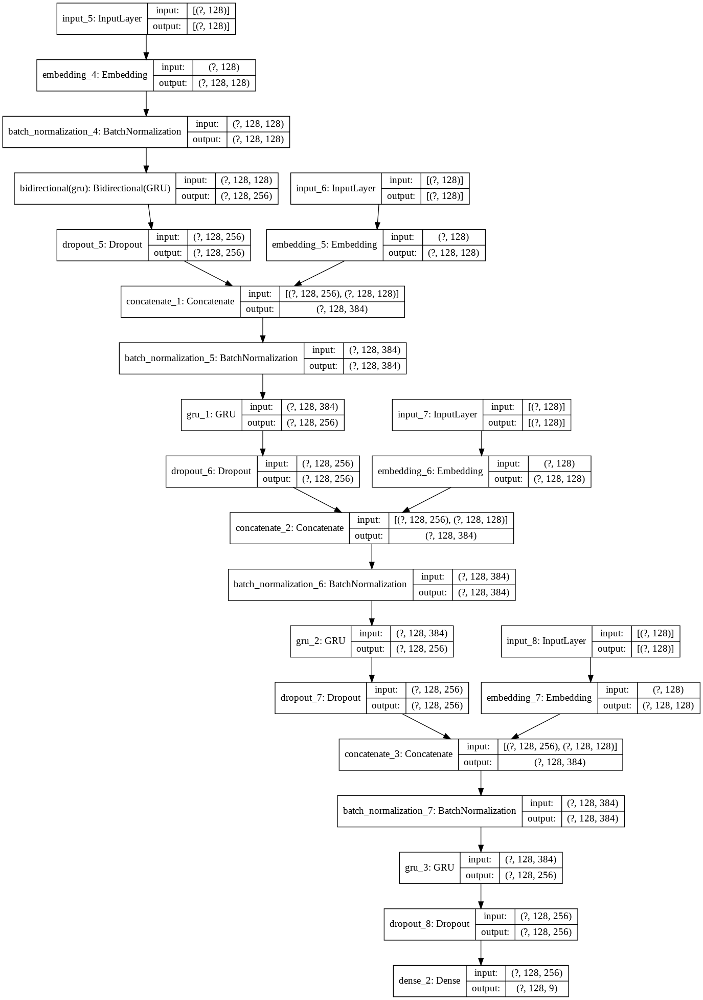

In [155]:
input_pos = Input((sent_len,))
x_pos = Embedding(num_words, emb_size)(input_pos)
x_pos = BatchNormalization()(x_pos)
x_pos = Bidirectional(GRU(emb_size, return_sequences=True))(x_pos)
x_pos = Dropout(0.2)(x_pos)

input_case = Input((sent_len,))
x_case = Embedding(num_words, emb_size)(input_case)

input_lang = Input((sent_len,))
x_lang = Embedding(num_words, emb_size)(input_lang)

input_norms = Input((sent_len,))
x_norms = Embedding(num_words, emb_size)(input_norms)

x = concatenate([x_pos, x_case])
x = BatchNormalization()(x)
x = GRU(emb_size * 2, return_sequences=True)(x)
x = Dropout(0.2)(x)

x = concatenate([x, x_lang])
x = BatchNormalization()(x)
x = GRU(emb_size * 2, return_sequences=True)(x)
x = Dropout(0.2)(x)

x = concatenate([x, x_norms])
x = BatchNormalization()(x)
x = GRU(emb_size * 2, return_sequences=True)(x)
x = Dropout(0.2)(x)

output = Dense(colors_count, activation='softmax')(x)

modelEGRU = Model(inputs=[input_pos, input_case, input_lang, input_norms], outputs=output)

modelEGRU.compile(loss='categorical_crossentropy', optimizer='adam', metrics=[dice_coef])
# modelEGRU.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=[dice_coef, AUC(num_thresholds=150)])

plot_model(modelEGRU, show_shapes=True)

In [156]:
historyEGRU = modelEGRU.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain,
                            epochs=100, batch_size=128,
                            validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest),  
                            callbacks=callbacks_list,
                            verbose=1)
                    
modelEGRU.save( '/content/drive/My Drive/tmp/modelEGRU_100epochs(gl_extr).h5' )

Epoch 1/100
23/23 [==============================] - ETA: 0s - loss: 0.5047 - dice_coef: 0.8170
Epoch 00001: val_dice_coef improved from -inf to 0.11729, saving model to /content/drive/My Drive/tmp/weights_epoch_1
23/23 [==============================] - 4s 162ms/step - loss: 0.5047 - dice_coef: 0.8170 - val_loss: 2.3067 - val_dice_coef: 0.1173
Epoch 2/100
23/23 [==============================] - ETA: 0s - loss: 0.1600 - dice_coef: 0.9273
Epoch 00002: val_dice_coef did not improve from 0.11729
23/23 [==============================] - 2s 97ms/step - loss: 0.1600 - dice_coef: 0.9273 - val_loss: 3.9851 - val_dice_coef: 0.0360
Epoch 3/100
23/23 [==============================] - ETA: 0s - loss: 0.1273 - dice_coef: 0.9416
Epoch 00003: val_dice_coef did not improve from 0.11729
23/23 [==============================] - 2s 96ms/step - loss: 0.1273 - dice_coef: 0.9416 - val_loss: 3.1238 - val_dice_coef: 0.0616
Epoch 4/100
23/23 [==============================] - ETA: 0s - loss: 0.1053 - dice_co

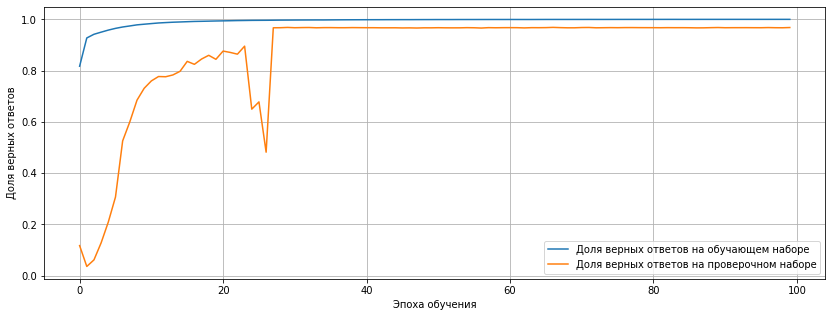

In [157]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyEGRU.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyEGRU.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()


**Проверка тренировочной выборки (насколько хорошо выучены примеры)**

In [158]:
YpredEGRU_train = modelEGRU.predict([Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms])

In [ ]:
for i, el in enumerate(paragraphs_train_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytrain[i]))
  print(colorize_the_text(el, YpredEGRU_train[i]))

*Чтобы память не забивать, результат 100%-го совпадения предсказаний с разметкой обучающей выборки удалён из текста*

**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [159]:
YpredEGRU_test = modelEGRU.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [160]:
# выбираем конкретную фразу из тестовой выборки
i = 2 + 1
print(f'{i}.')
print(colorize_the_text(paragraphs_test_2[i], Ytest[i]))
print(colorize_the_text(paragraphs_test_2[i], YpredEGRU_test[i]))

3.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .


In [161]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest[i]))
  print(colorize_the_text(el, YpredEGRU_test[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/

1.
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
2.
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
3.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
4.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее пон

In [162]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredEGRU_test.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      0.99      0.99     48969
      расшифровка       0.78      0.84      0.81      2083
      определение       0.86      0.83      0.84      1870
           термин       0.86      0.80      0.83       824
           связка       0.91      0.87      0.89       598
дубль-определение       0.41      0.28      0.33       185
     дубль-термин       0.54      0.47      0.50       232
     дубль-связка       0.52      0.31      0.39        88
дубль-расшифровка       0.03      0.02      0.02        63

         accuracy                           0.97     54912
        macro avg       0.65      0.60      0.62     54912
     weighted avg       0.97      0.97      0.97     54912



#### Algorithm: Embedding + Bidirectional(GRU) + GRU , batch_size = 128, activation='softmax'

*Параллельная архитектура*

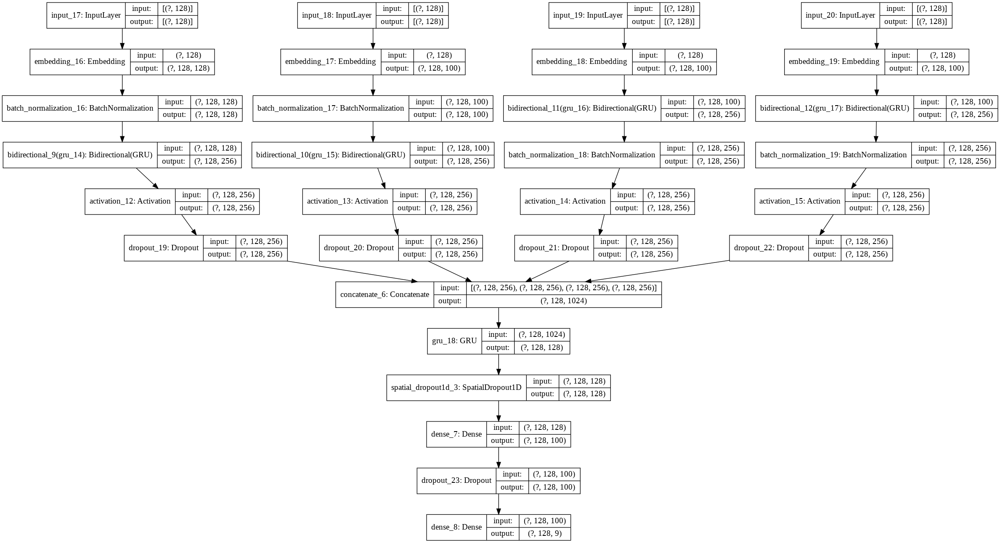

In [168]:
# параллельная архитектура
input_pos = Input((sent_len,))
x_pos = Embedding(num_words, emb_size)(input_pos)
x_pos = BatchNormalization()(x_pos)
x_pos = Bidirectional(GRU(emb_size, return_sequences=True))(x_pos)
x_pos = Activation('relu')(x_pos)
x_pos = Dropout(0.2)(x_pos)

input_case = Input((sent_len,))
x_case = Embedding(num_words, embedding_size)(input_case)
x_case = BatchNormalization()(x_case)
x_case = Bidirectional(GRU(emb_size, return_sequences=True))(x_case)
x_case = Activation('relu')(x_case)
x_case = Dropout(0.2)(x_case)

input_lang = Input((sent_len,))
x_lang = Embedding(num_words, embedding_size)(input_lang)
x_lang = Bidirectional(GRU(emb_size, return_sequences=True))(x_lang)
x_lang = BatchNormalization()(x_lang)
x_lang = Activation('relu')(x_lang)
x_lang = Dropout(0.2)(x_lang)

input_norms = Input((sent_len,))
x_norms = Embedding(num_words, embedding_size)(input_norms)
x_norms = Bidirectional(GRU(emb_size, return_sequences=True))(x_norms)
x_norms = BatchNormalization()(x_norms)
x_norms = Activation('relu')(x_norms)
x_norms = Dropout(0.2)(x_norms)

x = concatenate([x_pos, x_case, x_lang, x_norms])

x = GRU(emb_size, return_sequences=True)(x)
# x = BatchNormalization()(x)
x = Dense(100, activation='relu')(x)
x = Dropout(0.2)(x)

output = Dense(colors_count, activation='softmax')(x)

modelEGRUpar = Model(inputs=[input_pos, input_case, input_lang, input_norms], outputs=output)

modelEGRUpar.compile(loss='categorical_crossentropy', optimizer='adam', metrics=[dice_coef])
# modelEGRUpar.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=[dice_coef, AUC(num_thresholds=150)])

plot_model(modelEGRUpar, show_shapes=True)

In [169]:
historyEGRUpar = modelEGRUpar.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain,
                            epochs=100, batch_size=128,
                            validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest),  
                            callbacks=callbacks_list,
                            verbose=1)
                    
modelEGRUpar.save( '/content/drive/My Drive/tmp/modelEGRU_100epochs(gl_extr_par).h5' )

Epoch 1/100
23/23 [==============================] - ETA: 0s - loss: 0.5402 - dice_coef: 0.7506
Epoch 00001: val_dice_coef did not improve from 0.96852
23/23 [==============================] - 5s 197ms/step - loss: 0.5402 - dice_coef: 0.7506 - val_loss: 0.3536 - val_dice_coef: 0.8829
Epoch 2/100
23/23 [==============================] - ETA: 0s - loss: 0.1984 - dice_coef: 0.9088
Epoch 00002: val_dice_coef did not improve from 0.96852
23/23 [==============================] - 3s 114ms/step - loss: 0.1984 - dice_coef: 0.9088 - val_loss: 0.3568 - val_dice_coef: 0.8839
Epoch 3/100
23/23 [==============================] - ETA: 0s - loss: 0.1544 - dice_coef: 0.9297
Epoch 00003: val_dice_coef did not improve from 0.96852
23/23 [==============================] - 3s 115ms/step - loss: 0.1544 - dice_coef: 0.9297 - val_loss: 0.3196 - val_dice_coef: 0.8837
Epoch 4/100
23/23 [==============================] - ETA: 0s - loss: 0.1187 - dice_coef: 0.9452
Epoch 00004: val_dice_coef did not improve from 0

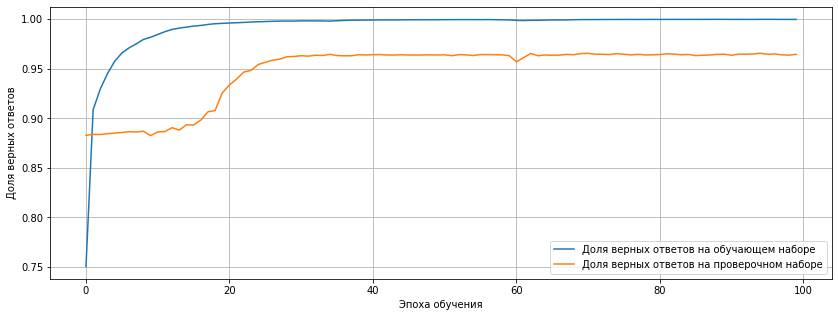

In [170]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyEGRUpar.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyEGRUpar.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()


**Проверка тренировочной выборки (насколько хорошо выучены примеры)**

In [171]:
YpredEGRU_train_par = modelEGRUpar.predict([Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms])

In [ ]:
for i, el in enumerate(paragraphs_train_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytrain[i]))
  print(colorize_the_text(el, YpredEGRU_train_par[i]))

*Чтобы память не забивать, результат 100%-го совпадения предсказаний с разметкой обучающей выборки удалён из текста*

**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [172]:
YpredEGRU_test_par = modelEGRUpar.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [ ]:
# выбираем конкретную фразу из тестовой выборки
i = 2 + 1
print(f'{i}.')
print(colorize_the_text(paragraphs_test_2[i], Ytest[i]))
print(colorize_the_text(paragraphs_test_2[i], YpredEGRU_test_par[i]))

In [ ]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest[i]))
  print(colorize_the_text(el, YpredEGRU_test_par[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/

In [173]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredEGRU_test_par.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.98      0.99      0.99     48969
      расшифровка       0.79      0.74      0.76      2083
      определение       0.81      0.81      0.81      1870
           термин       0.87      0.79      0.83       824
           связка       0.89      0.86      0.88       598
дубль-определение       0.35      0.16      0.22       185
     дубль-термин       0.73      0.55      0.63       232
     дубль-связка       0.53      0.33      0.41        88
дубль-расшифровка       0.00      0.00      0.00        63

         accuracy                           0.96     54912
        macro avg       0.66      0.58      0.61     54912
     weighted avg       0.96      0.96      0.96     54912



### **One-dimensional convolution**

#### Алгоритм: Embedding + Conv1D , batch_size = 16, activation='softmax'

*Последовательная архитектура*

In [174]:
'''
  Функция создания сети
    Входные параметры:
    - num_classes - количество классов для рапознавания
    - sentence_len - длина предложения
    - num_words - количество слов в словаре
    - embedding_size - длина эмбединга
'''
def pseudoLinearSegmentationNet(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 500
      ):
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Activation('relu')(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)

    x = concatenate([x_pos, x_case])
    x = Conv1D(128, 5, padding='same', name='input2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_lang])
    x = Conv1D(128, 5, padding='same', name='input3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_norms])
    x = Conv1D(128, 5, padding='same', name='input4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = LSTM(128, return_sequences=True)(x)
    x = SpatialDropout1D(0.2)(x)
    # x = BatchNormalization()(x)
    x = Dense(100, activation='relu')(x)
    x = Dropout(0.2)(x)

    # x = Dropout(0.2)(x)
    output = Conv1D(num_classes,3, activation=activation_function, padding='same')(x)

    model = Model(inputs=[input_pos, input_case, input_lang, input_norms], outputs=output)

    model.compile(optimizer='rmsprop', 
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])

    return model # Возвращаем сформированную модель

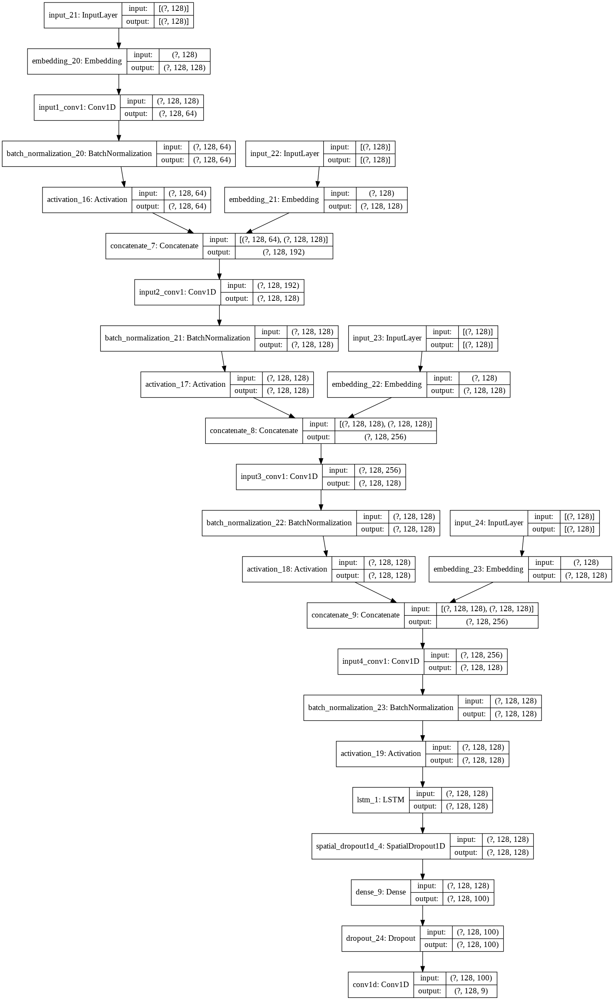

In [175]:
modelL = pseudoLinearSegmentationNet(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель linearSegmentationNet
plot_model(modelL, show_shapes=True)

In [176]:
historyL = modelL.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                      epochs=100, batch_size=64,
                      validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest)) # Обучаем модель на выборке по всем классам

Epoch 1/100
179/179 [==============================] - 4s 25ms/step - loss: 0.2039 - dice_coef: 0.9081 - val_loss: 0.3207 - val_dice_coef: 0.8998
Epoch 2/100
179/179 [==============================] - 4s 22ms/step - loss: 0.1294 - dice_coef: 0.9416 - val_loss: 0.1483 - val_dice_coef: 0.9277
Epoch 3/100
179/179 [==============================] - 4s 22ms/step - loss: 0.1110 - dice_coef: 0.9499 - val_loss: 0.1327 - val_dice_coef: 0.9374
Epoch 4/100
179/179 [==============================] - 4s 22ms/step - loss: 0.0971 - dice_coef: 0.9561 - val_loss: 0.0950 - val_dice_coef: 0.9569
Epoch 5/100
179/179 [==============================] - 4s 22ms/step - loss: 0.0856 - dice_coef: 0.9611 - val_loss: 0.1084 - val_dice_coef: 0.9511
Epoch 6/100
179/179 [==============================] - 4s 22ms/step - loss: 0.0756 - dice_coef: 0.9659 - val_loss: 0.1158 - val_dice_coef: 0.9598
Epoch 7/100
179/179 [==============================] - 4s 22ms/step - loss: 0.0666 - dice_coef: 0.9699 - val_loss: 0.0836 - 

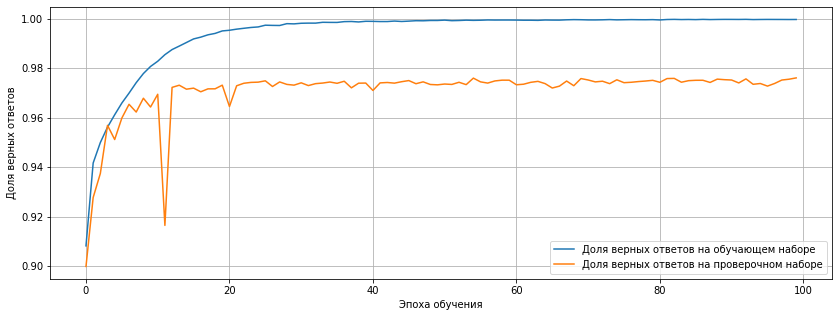

In [177]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyL.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyL.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [180]:
YpredL_test = modelL.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [181]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredL_test.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      0.99      0.99     48969
      расшифровка       0.85      0.89      0.87      2083
      определение       0.91      0.87      0.89      1870
           термин       0.89      0.86      0.87       824
           связка       0.90      0.90      0.90       598
дубль-определение       0.53      0.43      0.47       185
     дубль-термин       0.50      0.62      0.55       232
     дубль-связка       0.52      0.40      0.45        88
дубль-расшифровка       0.43      0.41      0.42        63

         accuracy                           0.98     54912
        macro avg       0.73      0.71      0.71     54912
     weighted avg       0.98      0.98      0.98     54912



**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [182]:
# выбираем конкретную фразу из тестовой выборки
i = 2 + 1
print(f'{i}.')
print(colorize_the_text(paragraphs_test_2[i], Ytest[i]))
print(colorize_the_text(paragraphs_test_2[i], YpredL_test[i]))

3.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее понятие .


In [183]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest[i]))
  print(colorize_the_text(el, YpredL_test[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/

1.
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
2.
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
3.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
4.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее пон

#### Алгоритм: Embedding + Conv1D , batch_size = 16, activation='softmax'

*Параллельная архитектура*

In [184]:
'''
  Функция создания сети
    Входные параметры:
    - num_classes - количество классов для рапознавания
    - sentence_len - длина предложения
    - num_words - количество слов в словаре
    - embedding_size - длина эмбединга
'''
def pseudoLinearSegmentationNet_par(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 500
      ):
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Activation('relu')(x_pos)
    x_pos = Dropout(0.2)(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)
    x_case = Conv1D(64, 3, padding='same', name='input2_conv1')(x_case)
    x_case = BatchNormalization()(x_case)
    x_case = Activation('relu')(x_case)
    x_case = Dropout(0.2)(x_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)
    x_lang = Conv1D(64, 3, padding='same', name='input3_conv1')(x_lang)
    x_lang = BatchNormalization()(x_lang)
    x_lang = Activation('relu')(x_lang)
    x_lang = Dropout(0.2)(x_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)
    x_norms = Conv1D(64, 3, padding='same', name='input4_conv1')(x_norms)
    x_norms = BatchNormalization()(x_norms)
    x_norms = Activation('relu')(x_norms)
    x_norms = Dropout(0.2)(x_norms)

    x = concatenate([x_pos, x_case, x_lang, x_norms])

    x = LSTM(128, return_sequences=True)(x)
    x = SpatialDropout1D(0.2)(x)
    # x = BatchNormalization()(x)
    x = Dense(100, activation='relu')(x)
    x = Dropout(0.2)(x)

    # x = Dropout(0.2)(x)
    output = Conv1D(num_classes,3, activation=activation_function, padding='same')(x)

    model = Model(inputs=[input_pos, input_case, input_lang, input_norms], outputs=output)

    model.compile(optimizer='rmsprop', 
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])

    return model # Возвращаем сформированную модель

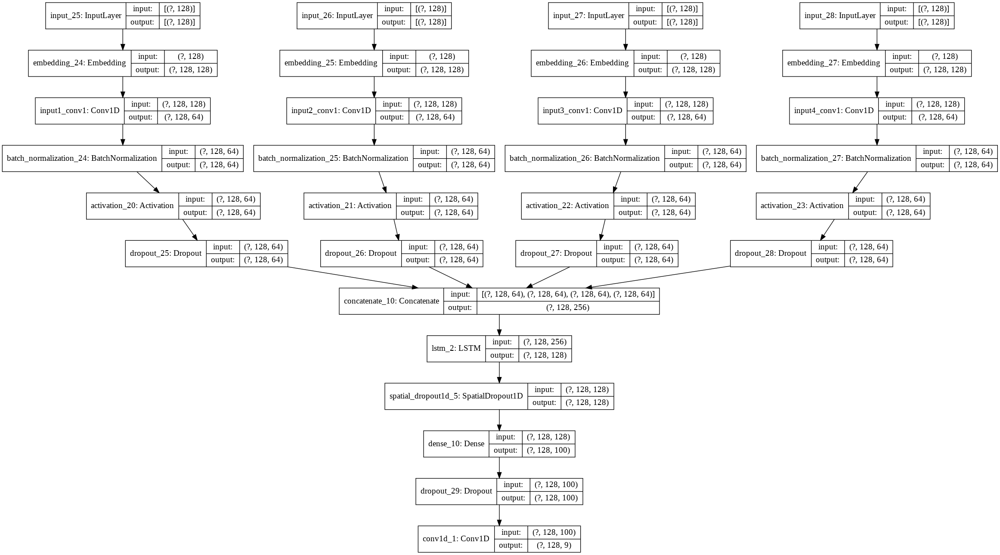

In [185]:
modelL_par = pseudoLinearSegmentationNet_par(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель linearSegmentationNet
plot_model(modelL_par, show_shapes=True)

In [186]:
historyL_par = modelL_par.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                      epochs=100, batch_size=64,
                      validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest)) # Обучаем модель на выборке по всем классам

Epoch 1/100
179/179 [==============================] - 5s 25ms/step - loss: 0.1989 - dice_coef: 0.9100 - val_loss: 0.2910 - val_dice_coef: 0.8952
Epoch 2/100
179/179 [==============================] - 4s 22ms/step - loss: 0.1191 - dice_coef: 0.9464 - val_loss: 0.1662 - val_dice_coef: 0.9156
Epoch 3/100
179/179 [==============================] - 4s 23ms/step - loss: 0.0937 - dice_coef: 0.9576 - val_loss: 0.1031 - val_dice_coef: 0.9484
Epoch 4/100
179/179 [==============================] - 4s 23ms/step - loss: 0.0767 - dice_coef: 0.9650 - val_loss: 0.0830 - val_dice_coef: 0.9637
Epoch 5/100
179/179 [==============================] - 4s 23ms/step - loss: 0.0636 - dice_coef: 0.9709 - val_loss: 0.0873 - val_dice_coef: 0.9654
Epoch 6/100
179/179 [==============================] - 4s 24ms/step - loss: 0.0516 - dice_coef: 0.9759 - val_loss: 0.0944 - val_dice_coef: 0.9669
Epoch 7/100
179/179 [==============================] - 4s 24ms/step - loss: 0.0418 - dice_coef: 0.9803 - val_loss: 0.0963 - 

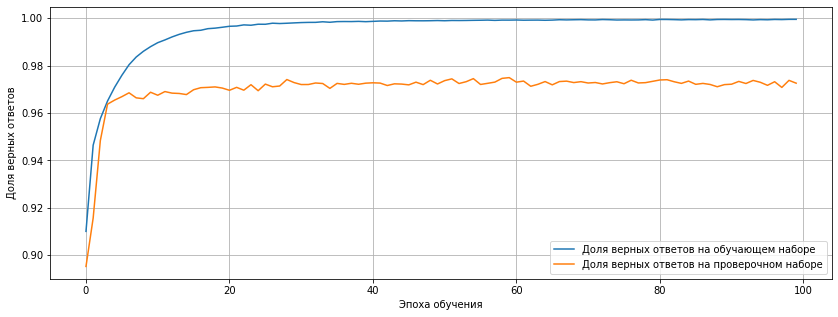

In [187]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyL_par.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyL_par.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [188]:
YpredL_par = modelL_par.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [189]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredL_par.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      0.99      0.99     48969
      расшифровка       0.87      0.84      0.86      2083
      определение       0.86      0.87      0.86      1870
           термин       0.89      0.82      0.85       824
           связка       0.90      0.90      0.90       598
дубль-определение       0.45      0.42      0.44       185
     дубль-термин       0.68      0.62      0.65       232
     дубль-связка       0.45      0.42      0.43        88
дубль-расшифровка       0.22      0.40      0.28        63

         accuracy                           0.97     54912
        macro avg       0.70      0.70      0.70     54912
     weighted avg       0.97      0.97      0.97     54912



### **U-net**

#### U-net classic

*Последовательная архитектура*



In [190]:
'''
  Функция создания сети
    Входные параметры:
    - num_classes - количество классов
    - sentence_len - длина предложения
    - num_words - количество слов в словаре
    - embedding_size - длина эмбединга
'''

def unet(
      num_classes = 6,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Activation('relu')(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)

    x = concatenate([x_pos, x_case])
    x = Conv1D(128, 5, padding='same', name='input2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_lang])
    x = Conv1D(128, 5, padding='same', name='input3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_norms])
    x = Conv1D(128, 5, padding='same', name='input4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)


    # Block 1
    x = Conv1D(64, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block1_conv2')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_1_out

    x = MaxPooling1D()(block_1_out)                                        # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(128, 3, padding='same', name='block2_conv1')(x)        # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same', name='block2_conv2')(x)        # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_2_out

    x = MaxPooling1D()(block_2_out)                                        # Добавляем слой MaxPooling1D

    # Block 3
    x = Conv1D(256, 3, padding='same', name='block3_conv1')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv2')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv3')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_3_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_3_out

    x = MaxPooling1D()(block_3_out)                                        # Добавляем слой MaxPooling1D

    # Block 4
    x = Conv1D(512, 3, padding='same', name='block4_conv1')(x)        # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv2')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv3')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_4_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_4_out
    x = block_4_out 

    # UP 2
    # x = Conv1DTranspose(x, 256, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 256 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(256, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = concatenate([x, block_3_out])                                      # Объединем текущий слой со слоем block_3_out
    x = Conv1D(256, 3, padding='same')(x)                             # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same')(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    # UP 3
    # x = Conv1DTranspose(x, 128, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 128 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(128, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = concatenate([x, block_2_out])                                      # Объединем текущий слой со слоем block_2_out
    x = Conv1D(128, 3, padding='same')(x)                             # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same')(x) # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    # UP 4
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = concatenate([x, block_1_out])  # Объединем текущий слой со слоем block_1_out
    x = Conv1D(64, 3, padding='same')(x) # Добавляем слой Conv1D с 64 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x) # Добавляем слой Conv1D с 64 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(num_classes, 3, activation='softmax', padding='same')(x)  # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель 
    model.compile(optimizer=Adam(),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model # Возвращаем сформированную модель

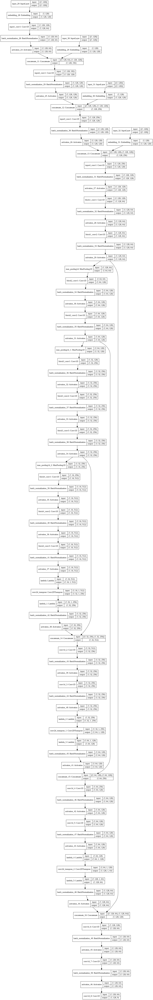

In [191]:
modelUnet = unet(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель unet
plot_model(modelUnet, show_shapes=True)

In [192]:
historyUnet = modelUnet.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                            epochs=100, batch_size=64,
                            validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest),  
                            callbacks=callbacks_list, verbose=1)                    
modelUnet.save( '/content/drive/My Drive/tmp/modelUnet_100epochs(gl_extr).h5' )

Epoch 1/100
179/179 [==============================] - ETA: 0s - loss: 0.2298 - dice_coef: 0.8848
Epoch 00001: val_dice_coef did not improve from 0.96852
179/179 [==============================] - 8s 47ms/step - loss: 0.2298 - dice_coef: 0.8848 - val_loss: 0.7433 - val_dice_coef: 0.8845
Epoch 2/100
179/179 [==============================] - ETA: 0s - loss: 0.1295 - dice_coef: 0.9395
Epoch 00002: val_dice_coef did not improve from 0.96852
179/179 [==============================] - 7s 41ms/step - loss: 0.1295 - dice_coef: 0.9395 - val_loss: 0.4113 - val_dice_coef: 0.9049
Epoch 3/100
179/179 [==============================] - ETA: 0s - loss: 0.1002 - dice_coef: 0.9528
Epoch 00003: val_dice_coef did not improve from 0.96852
179/179 [==============================] - 7s 40ms/step - loss: 0.1002 - dice_coef: 0.9528 - val_loss: 0.1819 - val_dice_coef: 0.9265
Epoch 4/100
178/179 [============================>.] - ETA: 0s - loss: 0.0797 - dice_coef: 0.9622
Epoch 00004: val_dice_coef did not imp

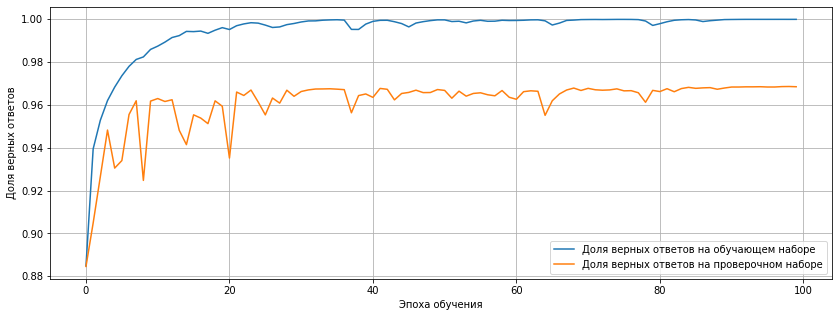

In [193]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyUnet.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyUnet.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [194]:
YpredUnet = modelUnet.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [195]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredUnet.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      0.99      0.99     48969
      расшифровка       0.82      0.79      0.81      2083
      определение       0.85      0.81      0.83      1870
           термин       0.90      0.83      0.87       824
           связка       0.90      0.87      0.88       598
дубль-определение       0.41      0.39      0.40       185
     дубль-термин       0.64      0.52      0.57       232
     дубль-связка       0.41      0.39      0.40        88
дубль-расшифровка       0.17      0.11      0.14        63

         accuracy                           0.97     54912
        macro avg       0.68      0.63      0.65     54912
     weighted avg       0.97      0.97      0.97     54912



**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [196]:
# выбираем конкретную фразу из тестовой выборки
i = 2
print(f'{i + 1}.')
print(colorize_the_text(paragraphs_test_2[i], Ytest[i]))
print(colorize_the_text(paragraphs_test_2[i], YpredUnet[i]))

3.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .


In [197]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest[i]))
  print(colorize_the_text(el, YpredUnet[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/ выше

1.
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
2.
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
3.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
4.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее пон

#### U-net classic

*Параллельная архитектура*



In [198]:
'''
  Функция создания сети
    Входные параметры:
    - num_classes - количество классов
    - sentence_len - длина предложения
    - num_words - количество слов в словаре
    - embedding_size - длина эмбединга
'''

def unet_par(
      num_classes = 6,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    # параллельная архитектура
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = Activation('relu')(x_pos)
    x_pos = Dropout(0.2)(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)
    x_case = BatchNormalization()(x_case)
    x_case = Conv1D(64, 3, padding='same', name='input2_conv1')(x_case)
    x_case = Activation('relu')(x_case)
    x_case = Dropout(0.2)(x_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)
    x_lang = Conv1D(64, 3, padding='same', name='input3_conv1')(x_lang)
    x_lang = BatchNormalization()(x_lang)
    x_lang = Activation('relu')(x_lang)
    x_lang = Dropout(0.2)(x_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)
    x_norms = Conv1D(64, 3, padding='same', name='input4_conv1')(x_norms)
    x_norms = BatchNormalization()(x_norms)
    x_norms = Activation('relu')(x_norms)
    x_norms = Dropout(0.2)(x_norms)

    x = concatenate([x_pos, x_case, x_lang, x_norms])


    # Block 1
    x = Conv1D(64, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block1_conv2')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_1_out

    x = MaxPooling1D()(block_1_out)                                        # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(128, 3, padding='same', name='block2_conv1')(x)        # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same', name='block2_conv2')(x)        # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_2_out

    x = MaxPooling1D()(block_2_out)                                        # Добавляем слой MaxPooling1D

    # Block 3
    x = Conv1D(256, 3, padding='same', name='block3_conv1')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv2')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv3')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_3_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_3_out

    x = MaxPooling1D()(block_3_out)                                        # Добавляем слой MaxPooling1D

    # Block 4
    x = Conv1D(512, 3, padding='same', name='block4_conv1')(x)        # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv2')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv3')(x)        # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_4_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_4_out
    x = block_4_out 

    # UP 2
    # x = Conv1DTranspose(x, 256, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 256 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(256, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = concatenate([x, block_3_out])                                      # Объединем текущий слой со слоем block_3_out
    x = Conv1D(256, 3, padding='same')(x)                             # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same')(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    # UP 3
    # x = Conv1DTranspose(x, 128, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 128 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(128, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = concatenate([x, block_2_out])                                      # Объединем текущий слой со слоем block_2_out
    x = Conv1D(128, 3, padding='same')(x)                             # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same')(x) # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    # UP 4
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = concatenate([x, block_1_out])  # Объединем текущий слой со слоем block_1_out
    x = Conv1D(64, 3, padding='same')(x) # Добавляем слой Conv1D с 64 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x) # Добавляем слой Conv1D с 64 нейронами
    x = BatchNormalization()(x) # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(num_classes, 3, activation='softmax', padding='same')(x)  # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель 
    model.compile(optimizer=Adam(),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model # Возвращаем сформированную модель

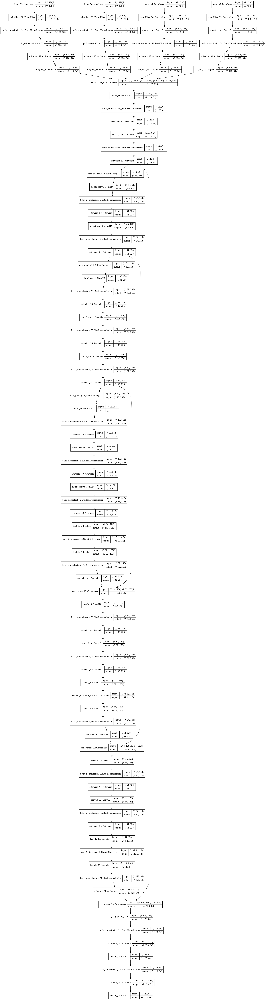

In [199]:
modelUnet_par = unet_par(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель unet
plot_model(modelUnet_par, show_shapes=True)

In [200]:
historyUnet_par = modelUnet_par.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                            epochs=100, batch_size=64,
                            validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest),  
                            callbacks=callbacks_list, verbose=1)                    
modelUnet.save( '/content/drive/My Drive/tmp/modelUnet_100epochs(gl_extr_par).h5' )

Epoch 1/100
45/45 [==============================] - ETA: 0s - loss: 0.7436 - dice_coef: 0.6299
Epoch 00001: val_dice_coef did not improve from 0.96860
45/45 [==============================] - 4s 81ms/step - loss: 0.7436 - dice_coef: 0.6299 - val_loss: 0.6942 - val_dice_coef: 0.6216
Epoch 2/100
44/45 [============================>.] - ETA: 0s - loss: 0.1548 - dice_coef: 0.9205
Epoch 00002: val_dice_coef did not improve from 0.96860
45/45 [==============================] - 2s 49ms/step - loss: 0.1552 - dice_coef: 0.9206 - val_loss: 0.5984 - val_dice_coef: 0.8320
Epoch 3/100
44/45 [============================>.] - ETA: 0s - loss: 0.1109 - dice_coef: 0.9444
Epoch 00003: val_dice_coef did not improve from 0.96860
45/45 [==============================] - 2s 50ms/step - loss: 0.1108 - dice_coef: 0.9444 - val_loss: 0.6721 - val_dice_coef: 0.8704
Epoch 4/100
44/45 [============================>.] - ETA: 0s - loss: 0.0838 - dice_coef: 0.9576
Epoch 00004: val_dice_coef did not improve from 0.96

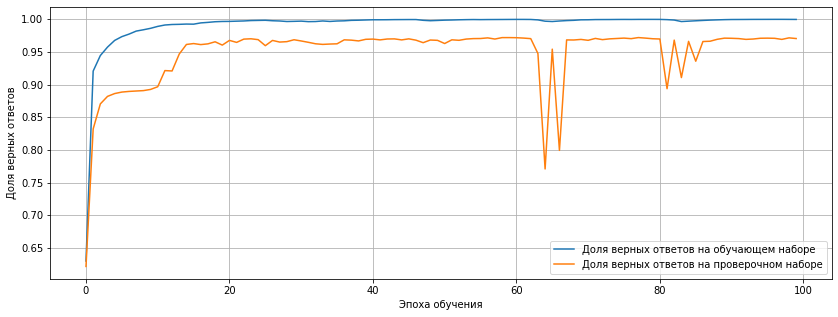

In [201]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyUnet_par.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyUnet_par.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [202]:
YpredUnet_par = modelUnet_par.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [203]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredUnet_par.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.99      0.99      0.99     48969
      расшифровка       0.77      0.87      0.82      2083
      определение       0.90      0.78      0.84      1870
           термин       0.88      0.87      0.88       824
           связка       0.90      0.89      0.90       598
дубль-определение       0.50      0.34      0.41       185
     дубль-термин       0.83      0.47      0.60       232
     дубль-связка       0.54      0.34      0.42        88
дубль-расшифровка       0.12      0.06      0.08        63

         accuracy                           0.97     54912
        macro avg       0.71      0.63      0.66     54912
     weighted avg       0.97      0.97      0.97     54912



**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [204]:
# выбираем конкретную фразу из тестовой выборки
i = 2
print(f'{i + 1}.')
print(colorize_the_text(paragraphs_test_2[i], Ytest[i]))
print(colorize_the_text(paragraphs_test_2[i], YpredUnet_par[i]))

3.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .


In [205]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest[i]))
  print(colorize_the_text(el, YpredUnet_par[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/ выше

1.
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
2.
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
3.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
4.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее пон

#### Simplified U-net

*Последовательная архитектура*

In [155]:
def simpleUnet(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Activation('relu')(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)

    x = concatenate([x_pos, x_case])
    x = Conv1D(128, 5, padding='same', name='input2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_lang])
    x = Conv1D(128, 5, padding='same', name='input3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_norms])
    x = Conv1D(128, 5, padding='same', name='input4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # Block 1
    x = Conv1D(32, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same', name='block1_conv2')(x)         # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_1_out

    x = MaxPooling1D()(block_1_out)                                        # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(64, 3, padding='same', name='block2_conv1')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block2_conv2')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_2_out

    x = MaxPooling1D()(block_2_out)                                        # Добавляем слой MaxPooling1D
    
    # UP 1
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    # UP 2
    # x = Conv1DTranspose(x, 32, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 32 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(32, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(num_classes,3, activation=activation_function, padding='same')(x) # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(lr=1e-3),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model                                                           # Возвращаем модель

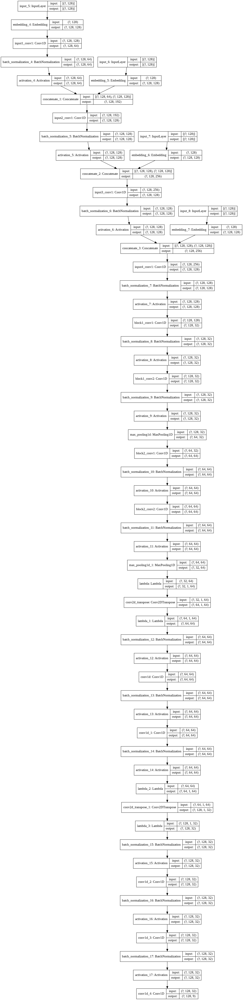

In [156]:
modelS = simpleUnet(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель simpleUnet
plot_model(modelS, show_shapes=True)

In [157]:
historyS = modelS.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                      epochs=100, batch_size=64,
                      validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest))

Epoch 1/100
179/179 [==============================] - 7s 40ms/step - loss: 0.3850 - dice_coef: 0.7956 - val_loss: 0.5803 - val_dice_coef: 0.8364
Epoch 2/100
179/179 [==============================] - 6s 36ms/step - loss: 0.1697 - dice_coef: 0.9186 - val_loss: 0.7459 - val_dice_coef: 0.8887
Epoch 3/100
179/179 [==============================] - 6s 35ms/step - loss: 0.1351 - dice_coef: 0.9370 - val_loss: 0.1765 - val_dice_coef: 0.9120
Epoch 4/100
179/179 [==============================] - 6s 36ms/step - loss: 0.1133 - dice_coef: 0.9471 - val_loss: 0.2522 - val_dice_coef: 0.9232
Epoch 5/100
179/179 [==============================] - 6s 36ms/step - loss: 0.0973 - dice_coef: 0.9547 - val_loss: 0.1796 - val_dice_coef: 0.9268
Epoch 6/100
179/179 [==============================] - 6s 36ms/step - loss: 0.0884 - dice_coef: 0.9585 - val_loss: 0.3046 - val_dice_coef: 0.9141
Epoch 7/100
179/179 [==============================] - 7s 37ms/step - loss: 0.0807 - dice_coef: 0.9623 - val_loss: 0.3256 - 

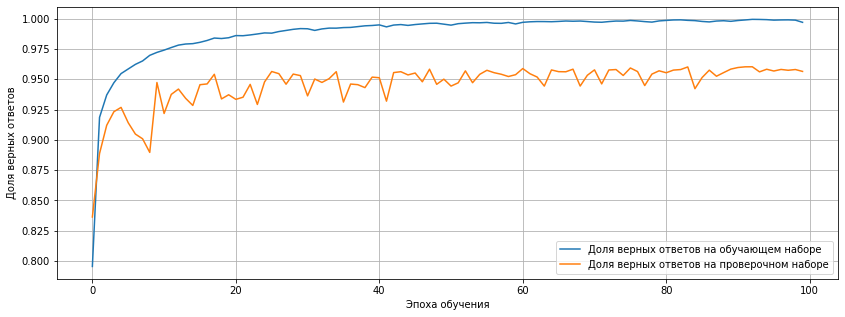

In [158]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyS.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyS.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [159]:
YpredS = modelS.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [160]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredS.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.97      0.99      0.98     48366
      расшифровка       0.80      0.67      0.73      2068
      определение       0.83      0.69      0.75      1862
           термин       0.78      0.78      0.78       817
           связка       0.81      0.78      0.79       591
дубль-определение       0.29      0.11      0.16       185
     дубль-термин       0.53      0.38      0.45       232
     дубль-связка       0.20      0.12      0.15        88
дубль-расшифровка       0.00      0.00      0.00        63

         accuracy                           0.96     54272
        macro avg       0.58      0.50      0.53     54272
     weighted avg       0.95      0.96      0.95     54272



#### Simplified U-net

*Параллельная архитектура*

In [161]:
def simpleUnet_par(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    # параллельная архитектура
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = Activation('relu')(x_pos)
    x_pos = Dropout(0.2)(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)
    x_case = BatchNormalization()(x_case)
    x_case = Conv1D(64, 3, padding='same', name='input2_conv1')(x_case)
    x_case = Activation('relu')(x_case)
    x_case = Dropout(0.2)(x_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)
    x_lang = Conv1D(64, 3, padding='same', name='input3_conv1')(x_lang)
    x_lang = BatchNormalization()(x_lang)
    x_lang = Activation('relu')(x_lang)
    x_lang = Dropout(0.2)(x_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)
    x_norms = Conv1D(64, 3, padding='same', name='input4_conv1')(x_norms)
    x_norms = BatchNormalization()(x_norms)
    x_norms = Activation('relu')(x_norms)
    x_norms = Dropout(0.2)(x_norms)

    x = concatenate([x_pos, x_case, x_lang, x_norms])


    # Block 1
    x = Conv1D(32, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same', name='block1_conv2')(x)         # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_1_out

    x = MaxPooling1D()(block_1_out)                                        # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(64, 3, padding='same', name='block2_conv1')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block2_conv2')(x)         # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                    # Добавляем слой Activation и запоминаем в переменной block_2_out

    x = MaxPooling1D()(block_2_out)                                        # Добавляем слой MaxPooling1D
    
    # UP 1
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    # UP 2
    # x = Conv1DTranspose(x, 32, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 32 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(32, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(32, 3, padding='same')(x)                              # Добавляем Conv1D-слой с 32-нейронами
    x = BatchNormalization()(x)                                            # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                              # Добавляем слой Activation

    x = Conv1D(num_classes,3, activation=activation_function, padding='same')(x) # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(lr=1e-3),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model                                                           # Возвращаем модель

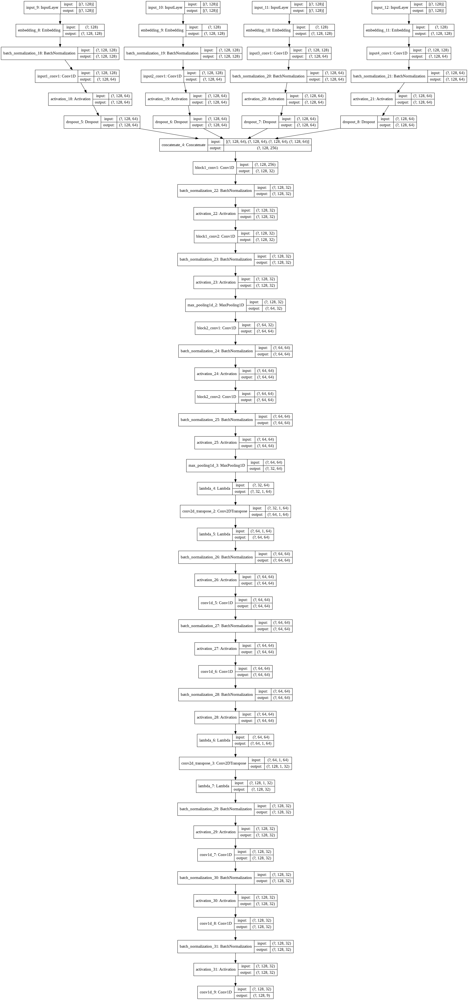

In [162]:
modelS_par = simpleUnet_par(colors_count, sent_len, num_words, 'softmax', emb_size) # Создаем модель simpleUnet
plot_model(modelS_par, show_shapes=True)

In [163]:
historyS_par = modelS_par.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                      epochs=100, batch_size=64,
                      validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest))

Epoch 1/100
45/45 [==============================] - 3s 56ms/step - loss: 0.6679 - dice_coef: 0.6340 - val_loss: 1.2564 - val_dice_coef: 0.3025
Epoch 2/100
45/45 [==============================] - 2s 39ms/step - loss: 0.2317 - dice_coef: 0.8756 - val_loss: 0.6556 - val_dice_coef: 0.6344
Epoch 3/100
45/45 [==============================] - 2s 40ms/step - loss: 0.1782 - dice_coef: 0.9090 - val_loss: 0.5484 - val_dice_coef: 0.8045
Epoch 4/100
45/45 [==============================] - 2s 40ms/step - loss: 0.1394 - dice_coef: 0.9295 - val_loss: 0.5767 - val_dice_coef: 0.8547
Epoch 5/100
45/45 [==============================] - 2s 40ms/step - loss: 0.1129 - dice_coef: 0.9434 - val_loss: 0.6480 - val_dice_coef: 0.8785
Epoch 6/100
45/45 [==============================] - 2s 40ms/step - loss: 0.0948 - dice_coef: 0.9527 - val_loss: 0.6611 - val_dice_coef: 0.8838
Epoch 7/100
45/45 [==============================] - 2s 39ms/step - loss: 0.0795 - dice_coef: 0.9602 - val_loss: 0.6136 - val_dice_coef:

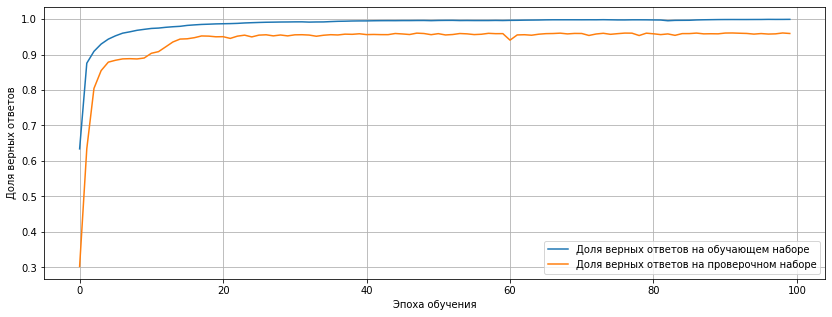

In [164]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyS_par.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyS_par.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [165]:
YpredS_par = modelS_par.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [166]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredS_par.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.98      0.99      0.98     48366
      расшифровка       0.82      0.68      0.74      2068
      определение       0.86      0.75      0.80      1862
           термин       0.87      0.80      0.83       817
           связка       0.85      0.83      0.84       591
дубль-определение       0.20      0.19      0.19       185
     дубль-термин       0.56      0.41      0.47       232
     дубль-связка       0.19      0.15      0.17        88
дубль-расшифровка       0.00      0.00      0.00        63

         accuracy                           0.96     54272
        macro avg       0.59      0.53      0.56     54272
     weighted avg       0.96      0.96      0.96     54272



#### Extended U-net

*Последовательная архитектура*

In [167]:
def unetWithMask(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Activation('relu')(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)

    x = concatenate([x_pos, x_case])
    x = Conv1D(128, 5, padding='same', name='input2_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_lang])
    x = Conv1D(128, 5, padding='same', name='input3_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = concatenate([x, x_norms])
    x = Conv1D(128, 5, padding='same', name='input4_conv1')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # Block 1
    x = Conv1D(64, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block1_conv2')(x)      # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_1_out
    
    block_1_out_mask = Conv1D(64, 1, padding='same')(block_1_out)  # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_1_out_mask

    x = MaxPooling1D()(block_1_out) # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(128, 3, padding='same', name='block2_conv1')(x)     # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same', name='block2_conv2')(x)     # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_2_out

    block_2_out_mask = Conv1D(128, 1, padding='same')(block_2_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_2_out_mask
    
    x = MaxPooling1D()(block_2_out)                                     # Добавляем слой MaxPooling1D

    # Block 3
    x = Conv1D(256, 3, padding='same', name='block3_conv1')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv2')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv3')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_3_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_3_out

    block_3_out_mask = Conv1D(256, 1, padding='same')(block_3_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_3_out_mask
        
    x = MaxPooling1D()(block_3_out)                                     # Добавляем слой MaxPooling1D

     # Block 4
    x = Conv1D(512, 3, padding='same', name='block4_conv1')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv2')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv3')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_4_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_4_out

    block_4_out_mask = Conv1D(512, 1, padding='same')(block_4_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_4_out_mask
            
    x = MaxPooling1D()(block_4_out)                                     # Добавляем слой MaxPooling1D

    # Block 5
    x = Conv1D(512, 3, padding='same', name='block5_conv1')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block5_conv2')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block5_conv3')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation
    
    for_pretrained_weight = MaxPooling1D()(x)                           # Добавляем слой MaxPooling1D
 
    # UP 1
    # x = Conv1DTranspose(x, 512, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 512 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(512, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_4_out, block_4_out_mask])                 # Объединем текущий слой со слоем block_4_out и слоем-маской block_4_out_mask
    x = Conv1D(512, 3, padding='same')(x)                          # Добавляем слой Conv1D с 512 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same')(x)                          # Добавляем слой Conv1D с 512 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 2
    # x = Conv1DTranspose(x, 256, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 256 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(256, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_3_out, block_3_out_mask])                 # Объединем текущий слой со слоем block_3_out и слоем-маской block_3_out_mask
    x = Conv1D(256, 3, padding='same')(x)                          # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same')(x)                          # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 3
    # x = Conv1DTranspose(x, 128, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 128 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(128, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_2_out, block_2_out_mask])                 # Объединем текущий слой со слоем block_2_out и слоем-маской block_2_out_mask
    x = Conv1D(128, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 4
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = concatenate([x, block_1_out, block_1_out_mask])                # Объединем текущий слой со слоем block_1_out и слоем-маской block_1_out_mask
    x = Conv1D(64, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = Conv1D(num_classes, 3, activation=activation_function, padding='same')(x) # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель 
    model.compile(optimizer=Adam(),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model                                                       # Возвращаем сформированную модель

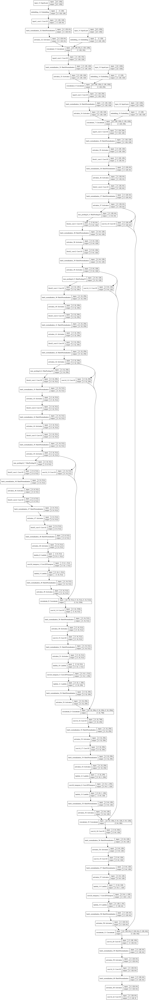

In [168]:
modelM3 = unetWithMask(colors_count, sent_len, num_words, 'sigmoid', emb_size) # Создаем модель unetWithMask
plot_model(modelM3, show_shapes=True)

In [169]:
historyM3 = modelM3.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                        epochs=100, batch_size=64,
                        validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest))

Epoch 1/100
45/45 [==============================] - 5s 104ms/step - loss: 1.1051 - dice_coef: 0.5029 - val_loss: 1.1618 - val_dice_coef: 0.4606
Epoch 2/100
45/45 [==============================] - 3s 67ms/step - loss: 0.2062 - dice_coef: 0.8774 - val_loss: 0.5593 - val_dice_coef: 0.7853
Epoch 3/100
45/45 [==============================] - 3s 67ms/step - loss: 0.1399 - dice_coef: 0.9169 - val_loss: 0.5202 - val_dice_coef: 0.8425
Epoch 4/100
45/45 [==============================] - 3s 65ms/step - loss: 0.1075 - dice_coef: 0.9322 - val_loss: 0.5346 - val_dice_coef: 0.8694
Epoch 5/100
45/45 [==============================] - 3s 66ms/step - loss: 0.0885 - dice_coef: 0.9400 - val_loss: 0.4804 - val_dice_coef: 0.8722
Epoch 6/100
45/45 [==============================] - 3s 66ms/step - loss: 0.0718 - dice_coef: 0.9454 - val_loss: 0.3953 - val_dice_coef: 0.8771
Epoch 7/100
45/45 [==============================] - 3s 66ms/step - loss: 0.0589 - dice_coef: 0.9488 - val_loss: 0.3799 - val_dice_coef

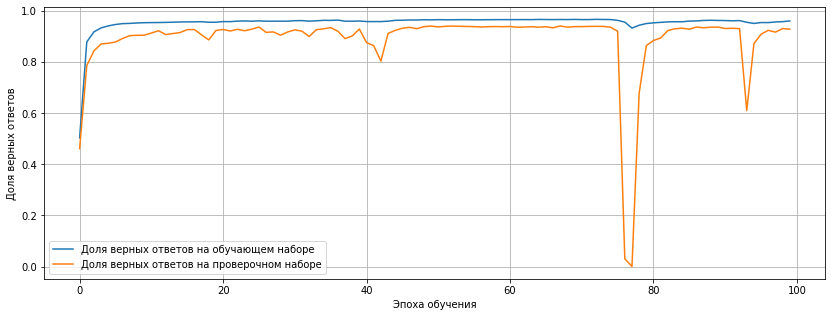

In [170]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyM3.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyM3.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [171]:
YpredM3 = modelM3.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [172]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredM3.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.98      0.99      0.99     48366
      расшифровка       0.81      0.72      0.76      2068
      определение       0.86      0.77      0.81      1862
           термин       0.84      0.80      0.82       817
           связка       0.88      0.88      0.88       591
дубль-определение       0.44      0.28      0.34       185
     дубль-термин       0.67      0.47      0.55       232
     дубль-связка       0.45      0.30      0.36        88
дубль-расшифровка       0.06      0.06      0.06        63

         accuracy                           0.96     54272
        macro avg       0.66      0.59      0.62     54272
     weighted avg       0.96      0.96      0.96     54272



**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [173]:
# выбираем конкретную фразу из тестовой выборки
i = 2
print(f'{i + 1}.')
print(colorize_the_text(paragraphs_test_2[i], Ytest[i]))
print(colorize_the_text(paragraphs_test_2[i], YpredM3[i]))

3.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .


In [174]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest[i]))
  print(colorize_the_text(el, YpredM3[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/ выше

1.
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
2.
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
3.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
4.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее пон

#### Extended U-net

*Параллельная архитектура*

In [175]:
def unetWithMask_par(
      num_classes = 9,
      sentence_len = 200,
      num_words = 5000,
      activation_function = 'softmax',
      embedding_size = 50
      ):
    # параллельная архитектура
    input_pos = Input((sentence_len,))
    x_pos = Embedding(num_words, embedding_size)(input_pos)
    x_pos = BatchNormalization()(x_pos)
    x_pos = Conv1D(64, 3, padding='same', name='input1_conv1')(x_pos)
    x_pos = Activation('relu')(x_pos)
    x_pos = Dropout(0.2)(x_pos)

    input_case = Input((sentence_len,))
    x_case = Embedding(num_words, embedding_size)(input_case)
    x_case = BatchNormalization()(x_case)
    x_case = Conv1D(64, 3, padding='same', name='input2_conv1')(x_case)
    x_case = Activation('relu')(x_case)
    x_case = Dropout(0.2)(x_case)

    input_lang = Input((sentence_len,))
    x_lang = Embedding(num_words, embedding_size)(input_lang)
    x_lang = Conv1D(64, 3, padding='same', name='input3_conv1')(x_lang)
    x_lang = BatchNormalization()(x_lang)
    x_lang = Activation('relu')(x_lang)
    x_lang = Dropout(0.2)(x_lang)

    input_norms = Input((sentence_len,))
    x_norms = Embedding(num_words, embedding_size)(input_norms)
    x_norms = Conv1D(64, 3, padding='same', name='input4_conv1')(x_norms)
    x_norms = BatchNormalization()(x_norms)
    x_norms = Activation('relu')(x_norms)
    x_norms = Dropout(0.2)(x_norms)

    x = concatenate([x_pos, x_case, x_lang, x_norms])


    # Block 1
    x = Conv1D(64, 3, padding='same', name='block1_conv1')(x) # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same', name='block1_conv2')(x)      # Добавляем Conv1D-слой с 64-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_1_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_1_out
    
    block_1_out_mask = Conv1D(64, 1, padding='same')(block_1_out)  # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_1_out_mask

    x = MaxPooling1D()(block_1_out) # Добавляем слой MaxPooling1D

    # Block 2
    x = Conv1D(128, 3, padding='same', name='block2_conv1')(x)     # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x) # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same', name='block2_conv2')(x)     # Добавляем Conv1D-слой с 128-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_2_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_2_out

    block_2_out_mask = Conv1D(128, 1, padding='same')(block_2_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_2_out_mask
    
    x = MaxPooling1D()(block_2_out)                                     # Добавляем слой MaxPooling1D

    # Block 3
    x = Conv1D(256, 3, padding='same', name='block3_conv1')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv2')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same', name='block3_conv3')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_3_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_3_out

    block_3_out_mask = Conv1D(256, 1, padding='same')(block_3_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_3_out_mask
        
    x = MaxPooling1D()(block_3_out)                                     # Добавляем слой MaxPooling1D

     # Block 4
    x = Conv1D(512, 3, padding='same', name='block4_conv1')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv2')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block4_conv3')(x)     # Добавляем Conv1D-слой с 256-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    block_4_out = Activation('relu')(x)                                 # Добавляем слой Activation и запоминаем в переменной block_4_out

    block_4_out_mask = Conv1D(512, 1, padding='same')(block_4_out) # Добавляем Conv1D-маску к текущему слою и запоминаем в переменную block_4_out_mask
            
    x = MaxPooling1D()(block_4_out)                                     # Добавляем слой MaxPooling1D

    # Block 5
    x = Conv1D(512, 3, padding='same', name='block5_conv1')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block5_conv2')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same', name='block5_conv3')(x)     # Добавляем Conv1D-слой с 512-нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation
    
    for_pretrained_weight = MaxPooling1D()(x)                           # Добавляем слой MaxPooling1D
 
    # UP 1
    # x = Conv1DTranspose(x, 512, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 512 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(512, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_4_out, block_4_out_mask])                 # Объединем текущий слой со слоем block_4_out и слоем-маской block_4_out_mask
    x = Conv1D(512, 3, padding='same')(x)                          # Добавляем слой Conv1D с 512 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(512, 3, padding='same')(x)                          # Добавляем слой Conv1D с 512 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 2
    # x = Conv1DTranspose(x, 256, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 256 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(256, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_3_out, block_3_out_mask])                 # Объединем текущий слой со слоем block_3_out и слоем-маской block_3_out_mask
    x = Conv1D(256, 3, padding='same')(x)                          # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(256, 3, padding='same')(x)                          # Добавляем слой Conv1D с 256 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 3
    # x = Conv1DTranspose(x, 128, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 128 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(128, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = concatenate([x, block_2_out, block_2_out_mask])                 # Объединем текущий слой со слоем block_2_out и слоем-маской block_2_out_mask
    x = Conv1D(128, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    x = Conv1D(128, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                         # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                           # Добавляем слой Activation

    # UP 4
    # x = Conv1DTranspose(x, 64, 2, strides=2, padding='same')(x)    # Добавляем слой Conv1DTranspose с 64 нейронами
    x = Lambda(lambda x: K.expand_dims(x, axis=2))(x)
    x = Conv2DTranspose(64, (2, 1), strides=(2, 1), padding='same')(x)
    x = Lambda(lambda x: K.squeeze(x, axis=2))(x)
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = concatenate([x, block_1_out, block_1_out_mask])                # Объединем текущий слой со слоем block_1_out и слоем-маской block_1_out_mask
    x = Conv1D(64, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = Conv1D(64, 3, padding='same')(x)                          # Добавляем слой Conv1D с 128 нейронами
    x = BatchNormalization()(x)                                        # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                          # Добавляем слой Activation

    x = Conv1D(num_classes, 3, activation=activation_function, padding='same')(x) # Добавляем Conv1D-Слой с softmax-активацией на num_classes-нейронов

    model = Model([input_pos, input_case, input_lang, input_norms], x)                                   # Создаем модель со входами и выходом 'x'

    # Компилируем модель 
    model.compile(optimizer=Adam(),
                  loss='categorical_crossentropy',
                  metrics=[dice_coef])
    
    return model                                                       # Возвращаем сформированную модель

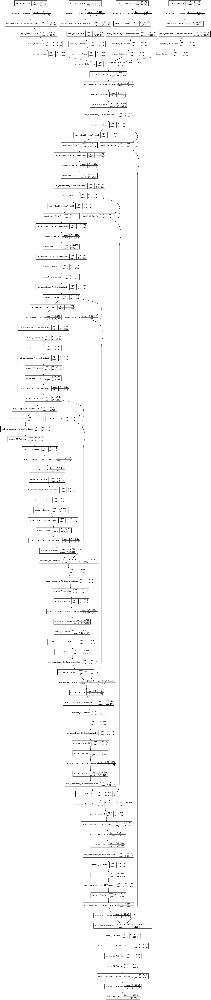

In [176]:
modelM3_par = unetWithMask_par(colors_count, sent_len, num_words, 'sigmoid', emb_size) # Создаем модель unetWithMask
plot_model(modelM3_par, show_shapes=True)

In [177]:
historyM3_par = modelM3_par.fit(x=[Xtrain_pos, Xtrain_case, Xtrain_lang, Xtrain_norms], y=Ytrain, 
                        epochs=100, batch_size=64,
                        validation_data=([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms], Ytest))

Epoch 1/100
45/45 [==============================] - 4s 85ms/step - loss: 1.3076 - dice_coef: 0.4383 - val_loss: 1.0197 - val_dice_coef: 0.5190
Epoch 2/100
45/45 [==============================] - 3s 66ms/step - loss: 0.2129 - dice_coef: 0.8736 - val_loss: 0.6130 - val_dice_coef: 0.7778
Epoch 3/100
45/45 [==============================] - 3s 64ms/step - loss: 0.1264 - dice_coef: 0.9221 - val_loss: 0.6373 - val_dice_coef: 0.8551
Epoch 4/100
45/45 [==============================] - 3s 64ms/step - loss: 0.0937 - dice_coef: 0.9344 - val_loss: 0.7199 - val_dice_coef: 0.8718
Epoch 5/100
45/45 [==============================] - 3s 64ms/step - loss: 0.0717 - dice_coef: 0.9399 - val_loss: 0.8018 - val_dice_coef: 0.8799
Epoch 6/100
45/45 [==============================] - 3s 64ms/step - loss: 0.0558 - dice_coef: 0.9428 - val_loss: 0.8268 - val_dice_coef: 0.8815
Epoch 7/100
45/45 [==============================] - 3s 65ms/step - loss: 0.0441 - dice_coef: 0.9443 - val_loss: 0.8106 - val_dice_coef:

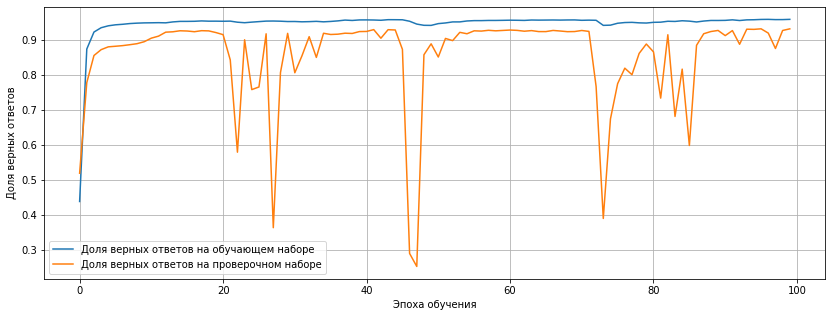

In [178]:
# Отобразим график обучения модели
plt.figure(figsize=(14, 5))
plt.plot(historyM3_par.history['dice_coef'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(historyM3_par.history['val_dice_coef'], 
         label='Доля верных ответов на проверочном наборе')
plt.grid(True)
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [179]:
YpredM3_par = modelM3_par.predict([Xtest_pos, Xtest_case, Xtest_lang, Xtest_norms])

In [180]:
# Встроенная функция sklearn возвращает и точность и полноту по классам
print(classification_report(Ytest.argmax(axis=-1).flatten(), 
                            YpredM3_par.argmax(axis=-1).flatten(), 
                            target_names=list(tag_tokenizer.index_word.values())))  

                   precision    recall  f1-score   support

                o       0.98      0.99      0.99     48366
      расшифровка       0.82      0.82      0.82      2068
      определение       0.86      0.80      0.83      1862
           термин       0.90      0.81      0.86       817
           связка       0.89      0.87      0.88       591
дубль-определение       0.43      0.24      0.31       185
     дубль-термин       0.77      0.52      0.62       232
     дубль-связка       0.59      0.31      0.40        88
дубль-расшифровка       0.27      0.10      0.14        63

         accuracy                           0.97     54272
        macro avg       0.72      0.61      0.65     54272
     weighted avg       0.97      0.97      0.97     54272



**Проверка тестовой выборки (насколько хорошо обучена сеть)**

In [181]:
# выбираем конкретную фразу из тестовой выборки
i = 2
print(f'{i + 1}.')
print(colorize_the_text(paragraphs_test_2[i], Ytest[i]))
print(colorize_the_text(paragraphs_test_2[i], YpredM3_par[i]))

3.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .


In [182]:
# воспроизводим все фразы из тестовой выборки
for i, el in enumerate(paragraphs_test_2):
  print(f'{i+1}.')
  print(colorize_the_text(el, Ytest[i]))
  print(colorize_the_text(el, YpredM3_par[i]))

# На github не отображается расцветка текста
# Чтобы её посмотреть, воспользуйтесь ссылкой на https://colab.research.google.com/ выше

1.
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
 Удобный поиск — возможность использования эффективной системы поиска ( полнотекстовый поиск , одновременный поиск в нескольких словарях , высокая скорость поиска ) [ 26 ] .
2.
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
 Синтаксический анализатор ( жарг. парсер ← англ. parser ) — это программа или часть программы , выполняющая синтаксический анализ .
3.
 Свойство — необходимое условие принадлежности классу .
 Свойство — необходимое условие принадлежности классу .
4.
 Парадигма программирования как исходная концептуальная схема постановки проблем и их решения является инструментом грамматического описания фактов , событий , явлений и процессов , возможно , не существующих одновременно , но интуитивно объединяемых в общее пон